In [8]:
%matplotlib inline
from matplotlib import pyplot as plt
import matplotlib
import seaborn as sns
sns.set_style("ticks")
sns.set_context("paper", font_scale=1.5, rc={"lines.linewidth": 2.0})

import os
import re
import pandas as pd
import numpy as np
import shutil
import subprocess
import multiprocessing
import re
import cantera as ct

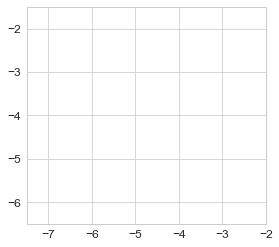

array([[[-7.5   , -7.5   , -7.5   , -7.5   , -7.5   , -7.5   , -7.5   ,
         -7.5   , -7.5   ],
        [-6.8125, -6.8125, -6.8125, -6.8125, -6.8125, -6.8125, -6.8125,
         -6.8125, -6.8125],
        [-6.125 , -6.125 , -6.125 , -6.125 , -6.125 , -6.125 , -6.125 ,
         -6.125 , -6.125 ],
        [-5.4375, -5.4375, -5.4375, -5.4375, -5.4375, -5.4375, -5.4375,
         -5.4375, -5.4375],
        [-4.75  , -4.75  , -4.75  , -4.75  , -4.75  , -4.75  , -4.75  ,
         -4.75  , -4.75  ],
        [-4.0625, -4.0625, -4.0625, -4.0625, -4.0625, -4.0625, -4.0625,
         -4.0625, -4.0625],
        [-3.375 , -3.375 , -3.375 , -3.375 , -3.375 , -3.375 , -3.375 ,
         -3.375 , -3.375 ],
        [-2.6875, -2.6875, -2.6875, -2.6875, -2.6875, -2.6875, -2.6875,
         -2.6875, -2.6875],
        [-2.    , -2.    , -2.    , -2.    , -2.    , -2.    , -2.    ,
         -2.    , -2.    ]],

       [[-6.5   , -5.875 , -5.25  , -4.625 , -4.    , -3.375 , -2.75  ,
         -2.125 , -1.5   ]

In [2]:
carbon_range = (-7.5, -2)
oxygen_range = (-6.5, -1.5)
grid_size = 9
mesh  = np.mgrid[carbon_range[0]:carbon_range[1]:grid_size*1j, 
                 oxygen_range[0]:oxygen_range[1]:grid_size*1j]

with sns.axes_style("whitegrid"):
    plt.axis('square')
    plt.xlim(carbon_range)
    plt.ylim(oxygen_range)
plt.show()
    
mesh

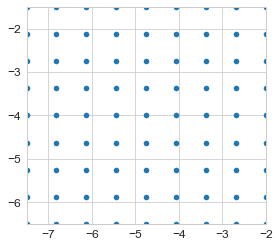

In [3]:
experiments = mesh.reshape((2,-1)).T

with sns.axes_style("whitegrid"):
    plt.axis('square')
    plt.xlim(carbon_range)
    plt.ylim(oxygen_range)
    plt.plot(*experiments.T, marker='o', linestyle='none')

In [4]:
extent = carbon_range + oxygen_range

# Because the center of a corner pixel is in fact the corner of the grid# Becaus 
# we want to stretch the image a little
c_step = mesh[0,1,0]-mesh[0,0,0]
o_step = mesh[1,0,1]-mesh[1,0,0]
carbon_range2 = (carbon_range[0]-c_step/2, carbon_range[1]+c_step/2)
oxygen_range2 = (oxygen_range[0]-c_step/2, oxygen_range[1]+c_step/2)
extent2 = carbon_range2 + oxygen_range2

In [13]:
# smoosh all csv files together
array = os.listdir('./linearscaling/')
array = sorted(array)

reactions = []
num_surf_reactions = []
count = 1
for x in array:
    try:
        data = pd.read_csv('./linearscaling/' + x + '/dict.csv', header=None)
        # get the reactions
        rxns = []
        n = []
        for y in data[1]:
            rxns.append(y)
        for y in data[2]:
            n.append([y])
        zipped = zip(rxns,n)
        zipped = [list(z) for z in zipped]
        #counting number of surface reactions in each 
        num_surf_reactions.append(len(zipped))

        if count is 1:
            reactions = zipped
        else:
            # add the reactions that already have a match
            for rxn in reactions:
                for a in zipped:
                    if a[0] == rxn[0]:
                        rxn[1].append(a[1][0])
                        zipped.remove(a)
            # add 0s to the reactions that don't occur in this model
            for f in reactions:
                if len(f[1]) is not count:
                    f[1].append(0.000000001)
            # add the new reactions
            for a in zipped:
                if len(a[1]) is not count:
                    zeros = [0.000000001] * (count - len(a[1]))
                    a[1] = zeros + a[1]
                    reactions.append(a)

        count += 1
    except:
        print '%s does not have a dict.csv file'%(x)
        pass
# for s in reactions:
#     print s


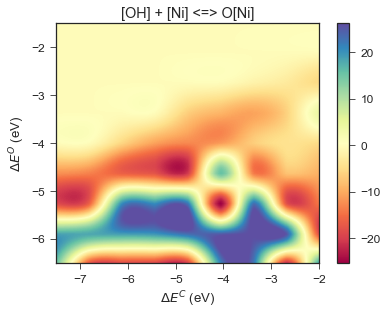

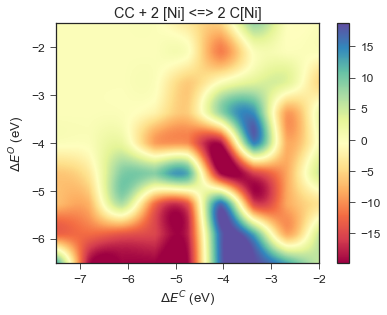

skipping CCOO + 2 [Ni] <=> [Ni] + CC([Ni])OO because it's boring
skipping CCOO + 2 [Ni] <=> [Ni] + CCOO[Ni] because it's boring


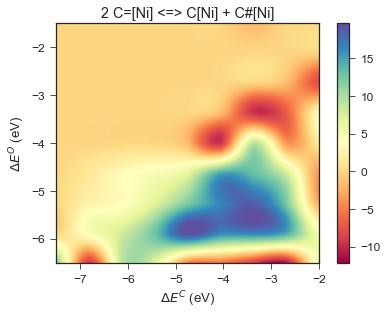

skipping CC=CO + 2 [Ni] <=> [Ni] + CC([Ni])=CO because it's boring


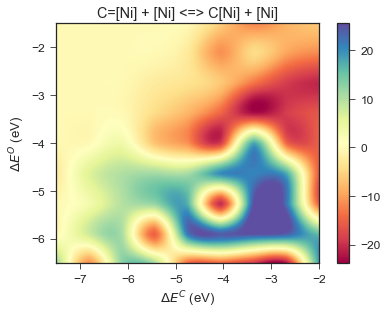

skipping C=CO + 2 [Ni] <=> C=C[Ni] + O[Ni] because it's boring
skipping CC(O)OO + 2 [Ni] <=> OO[Ni] + CC(O)[Ni] because it's boring
skipping C=CO + 2 [Ni] <=> [Ni] + OC=C[Ni] because it's boring
skipping COC(C)O + 2 [Ni] <=> [Ni] + CC(O)OC[Ni] because it's boring
skipping CC(C)(O)OO + 2 [Ni] <=> OO[Ni] + CC(C)(O)[Ni] because it's boring
skipping OCOO + 2 [Ni] <=> O[Ni] + OOC[Ni] because it's boring
skipping OCOO + 2 [Ni] <=> OC[Ni] + OO[Ni] because it's boring
skipping CC(O)OO + 2 [Ni] <=> [Ni] + CC(OO)O[Ni] because it's boring
skipping CC(O)OO + 2 [Ni] <=> [Ni] + CC(O)OO[Ni] because it's boring


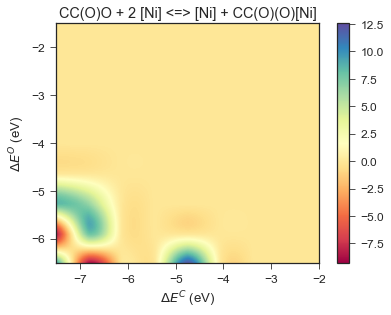

skipping CC(O)OO + 2 [Ni] <=> [Ni] + CC(O)([Ni])OO because it's boring


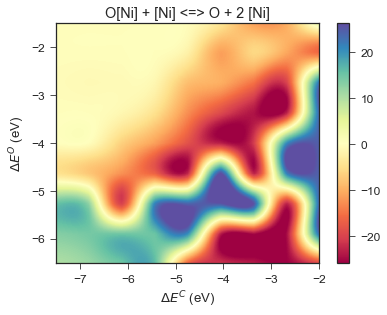

skipping OCOO + 2 [Ni] <=> [Ni] + OCOO[Ni] because it's boring


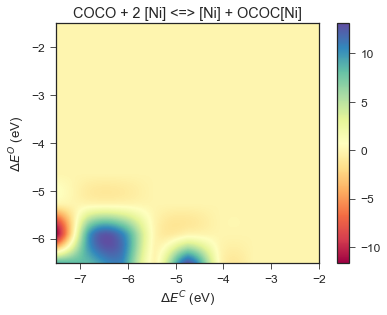

skipping CC(O)(O)OO + 2 [Ni] <=> OO[Ni] + CC(O)(O)[Ni] because it's boring
skipping CC(C)O + 2 [Ni] <=> [Ni] + CC(C)(O)[Ni] because it's boring


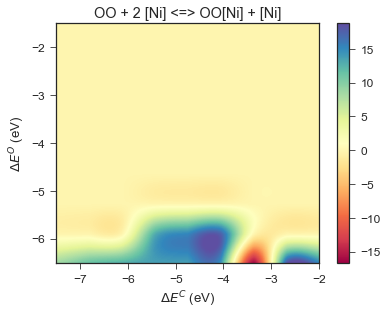

skipping C=[Ni] + CC(O)OO[Ni] <=> O=[Ni] + CC(O)OC[Ni] because it's boring
skipping COC(O)O + 2 [Ni] <=> [Ni] + OC(O)OC[Ni] because it's boring
skipping COC(C)(O)O + 2 [Ni] <=> [Ni] + CC(O)(O)OC[Ni] because it's boring
skipping CC(C)O + 2 [Ni] <=> C[Ni] + CC(O)[Ni] because it's boring
skipping OC=CO + 2 [Ni] <=> [Ni] + OC=CO[Ni] because it's boring
skipping OOC(O)O + 2 [Ni] <=> [Ni] + OOC(O)O[Ni] because it's boring
skipping OOC(O)O + 2 [Ni] <=> OO[Ni] + OC(O)[Ni] because it's boring
skipping OC=CO + 2 [Ni] <=> O[Ni] + OC=C[Ni] because it's boring
skipping COC(O)OC + 2 [Ni] <=> [Ni] + COC(O)OC[Ni] because it's boring
skipping OOC(O)O + 2 [Ni] <=> O[Ni] + OOC(O)[Ni] because it's boring
skipping CC(C)(O)OO + 2 [Ni] <=> C[Ni] + CC(O)([Ni])OO because it's boring
skipping COC(O)O + 2 [Ni] <=> O[Ni] + COC(O)[Ni] because it's boring
skipping OCOO + 2 [Ni] <=> [Ni] + OOC(O)[Ni] because it's boring
skipping C=[Ni] + OCOO[Ni] <=> O=[Ni] + OCOC[Ni] because it's boring
skipping COC(O)OCO + 2 [Ni] 

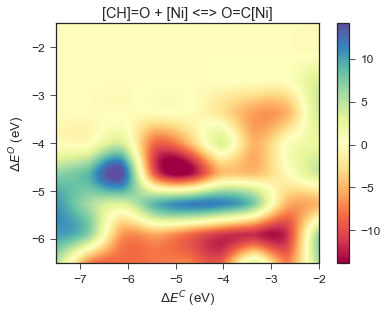

skipping CC=C(C)O + 2 [Ni] <=> CC=C(C)[Ni] + O[Ni] because it's boring


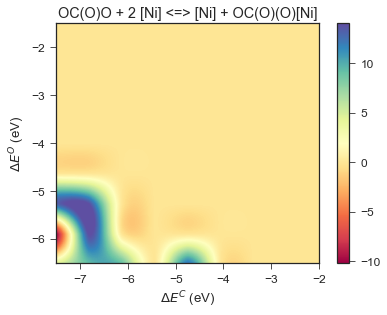

skipping CC(O)OC[Ni] + [Ni] <=> C=[Ni] + CC(O)O[Ni] because it's boring
skipping CC(O)OC(O)O + 2 [Ni] <=> OC(O)O[Ni] + CC(O)[Ni] because it's boring


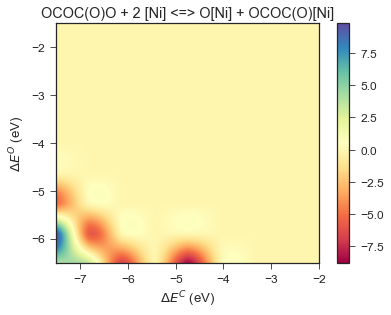

skipping CC(C)OO + 2 [Ni] <=> C[Ni] + CC([Ni])OO because it's boring
skipping CC(O)OCO + 2 [Ni] <=> OCO[Ni] + CC(O)[Ni] because it's boring
skipping OCOC(O)OO + 2 [Ni] <=> OO[Ni] + OCOC(O)[Ni] because it's boring
skipping CC(O)OC(O)O + 2 [Ni] <=> O[Ni] + CC(O)OC(O)[Ni] because it's boring
skipping OCCOO + 2 [Ni] <=> OC[Ni] + OOC[Ni] because it's boring
skipping CC(OO)O[Ni] + [Ni] <=> O=[Ni] + CC([Ni])OO because it's boring


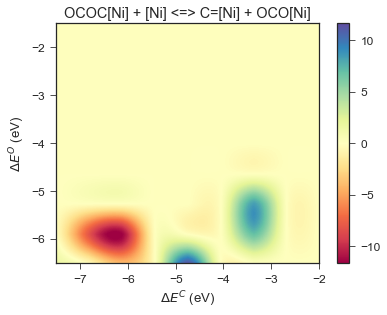

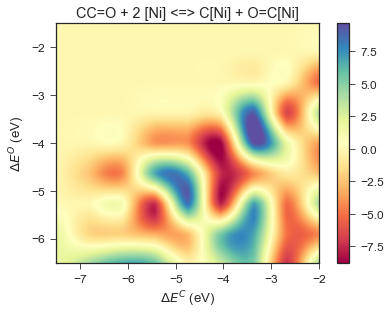

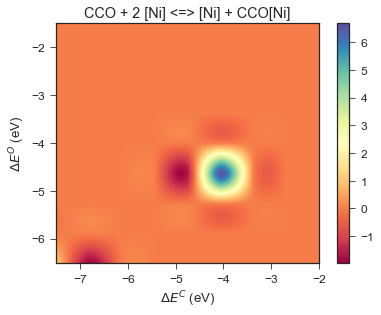

skipping CC(O)(O)OC[Ni] + [Ni] <=> C=[Ni] + CC(O)(O)O[Ni] because it's boring
skipping OCCOO + 2 [Ni] <=> [Ni] + OOCC(O)[Ni] because it's boring
skipping OCOCOO + 2 [Ni] <=> OC[Ni] + OOCO[Ni] because it's boring
skipping CC(O)=CO + 2 [Ni] <=> O[Ni] + CC([Ni])=CO because it's boring
skipping OCOCOO + 2 [Ni] <=> OO[Ni] + OCOC[Ni] because it's boring
skipping OC(O)OC[Ni] + [Ni] <=> C=[Ni] + OC(O)O[Ni] because it's boring
skipping OCCOO + 2 [Ni] <=> [Ni] + OCC([Ni])OO because it's boring
skipping OCC(O)OO + 2 [Ni] <=> [Ni] + OOC(O)C(O)[Ni] because it's boring


/Users/rwest/anaconda/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':
/Users/rwest/anaconda/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.
/Users/rwest/anaconda/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in multiply
  # This is added back by InteractiveShellApp.init_path()


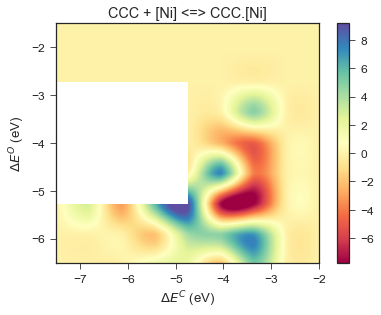

skipping CC(C)(O)O + [Ni] <=> CC(C)(O)O.[Ni] because it's boring
skipping OOC(O)O[Ni] + [Ni] <=> O=[Ni] + OOC(O)[Ni] because it's boring


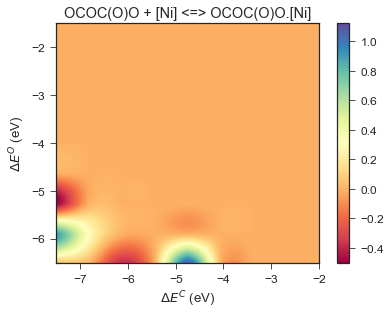

skipping OCC(O)OO + 2 [Ni] <=> OO[Ni] + OCC(O)[Ni] because it's boring


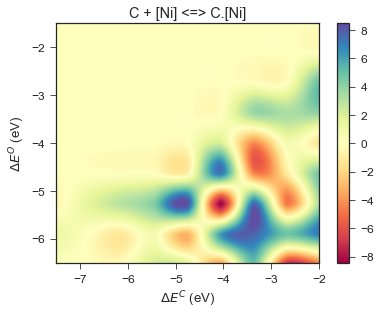

skipping CC(O)OC(O)O + [Ni] <=> CC(O)OC(O)O.[Ni] because it's boring


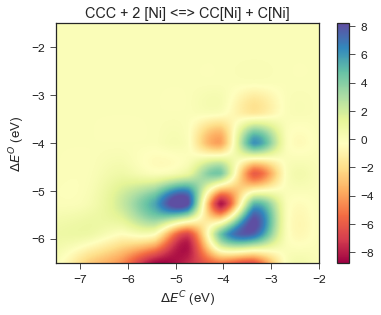

skipping COC(O)OCO + [Ni] <=> COC(O)OCO.[Ni] because it's boring
skipping COC(C)O + [Ni] <=> COC(C)O.[Ni] because it's boring


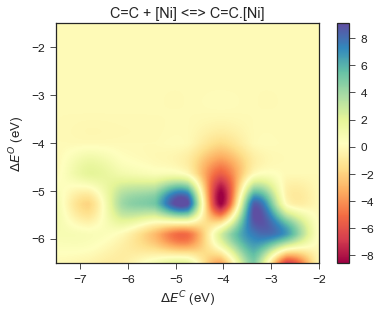

skipping COCOCO + [Ni] <=> COCOCO.[Ni] because it's boring


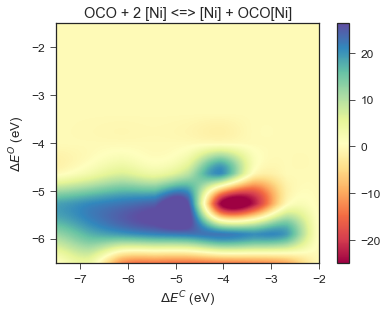

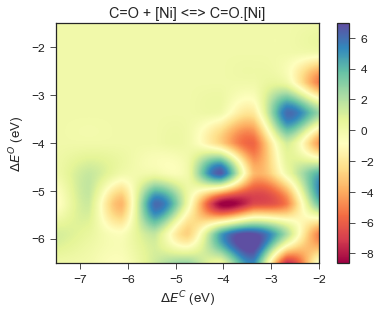

skipping CC(C)(O)O[Ni] + [Ni] <=> O=[Ni] + CC(C)(O)[Ni] because it's boring
skipping CC(=CO)O[Ni] + [Ni] <=> O=[Ni] + CC([Ni])=CO because it's boring
skipping COC(O)O[Ni] + [Ni] <=> O=[Ni] + COC(O)[Ni] because it's boring


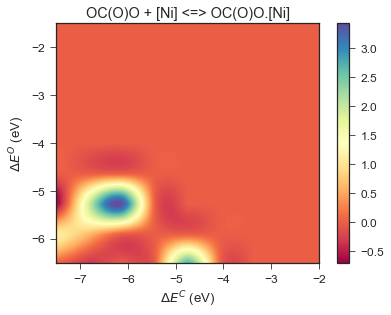

skipping OCC(O)O + 2 [Ni] <=> [Ni] + OCC(O)O[Ni] because it's boring
skipping OC=CO[Ni] + [Ni] <=> O=[Ni] + OC=C[Ni] because it's boring


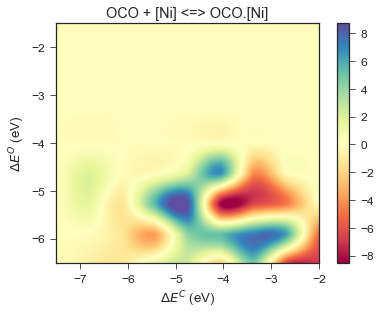

skipping OOC(O)O + [Ni] <=> OOC(O)O.[Ni] because it's boring
skipping OCOC(O)O[Ni] + [Ni] <=> O=[Ni] + OCOC(O)[Ni] because it's boring


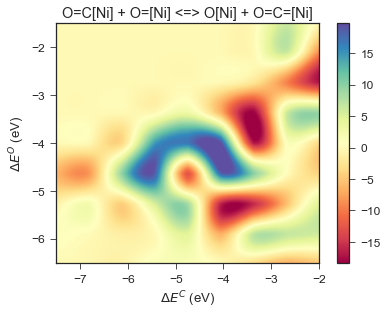

skipping OCOC(O)OC[Ni] + [Ni] <=> C=[Ni] + OCOC(O)O[Ni] because it's boring


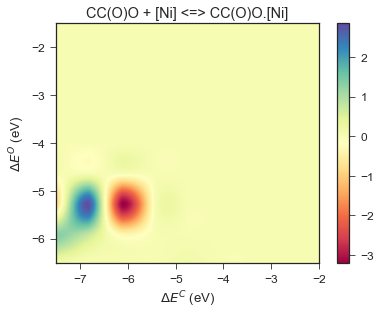

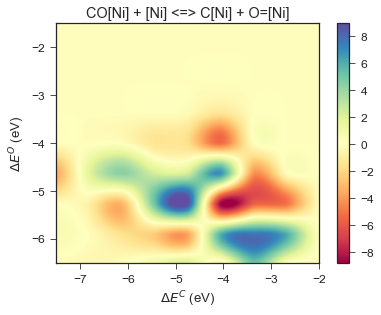

skipping COCOO + [Ni] <=> COCOO.[Ni] because it's boring


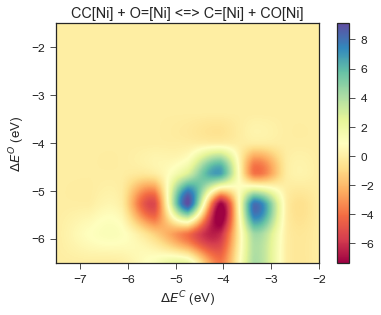

skipping OCOC(O)OO + [Ni] <=> OCOC(O)OO.[Ni] because it's boring
skipping CCOO[Ni] + [Ni] <=> O=[Ni] + CCO[Ni] because it's boring


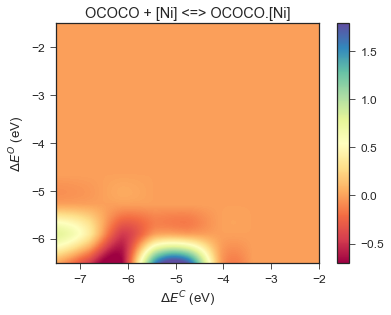

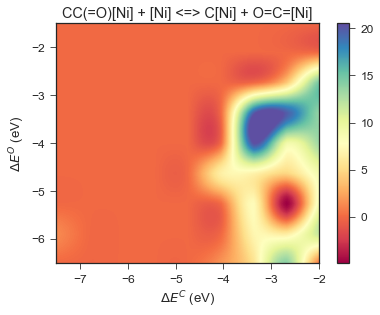

skipping CC(C)OO + [Ni] <=> CC(C)OO.[Ni] because it's boring


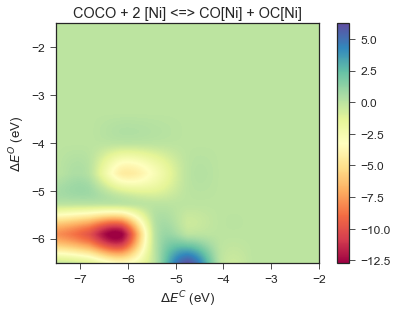

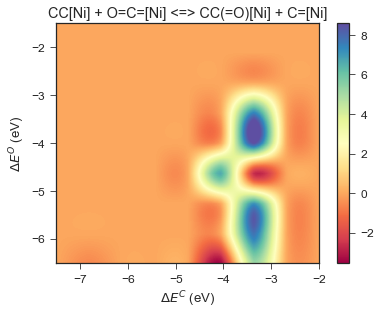

skipping CCOO + [Ni] <=> CCOO.[Ni] because it's boring


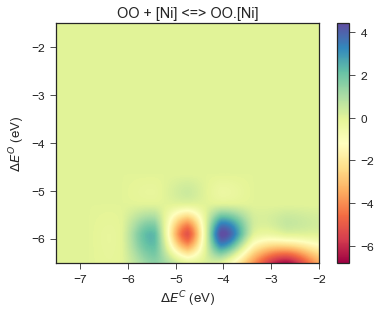

skipping COC(O)OC + [Ni] <=> COC(O)OC.[Ni] because it's boring
skipping OCOCOO + [Ni] <=> OCOCOO.[Ni] because it's boring
skipping COC(O)OC[Ni] + [Ni] <=> C=[Ni] + COC(O)O[Ni] because it's boring
skipping C=CC + [Ni] <=> C=CC.[Ni] because it's boring


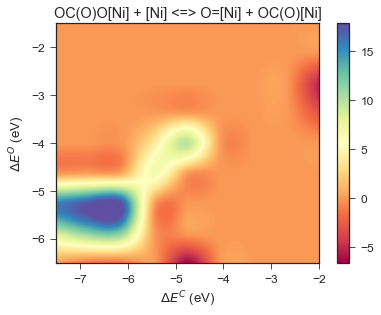

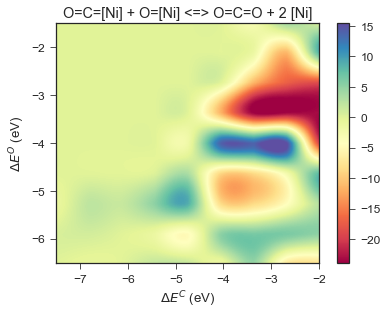

skipping CC(O)OO + [Ni] <=> CC(O)OO.[Ni] because it's boring
skipping OCOCOO + 2 [Ni] <=> OCO[Ni] + OOC[Ni] because it's boring


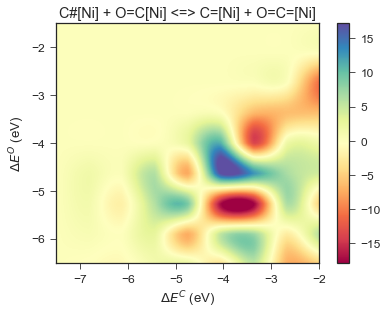

skipping OCC(O)O + 2 [Ni] <=> [Ni] + OC(O)C(O)[Ni] because it's boring
skipping OCC(O)O[Ni] + [Ni] <=> O=[Ni] + OCC(O)[Ni] because it's boring
skipping CC(O)=CO + [Ni] <=> CC(O)=CO.[Ni] because it's boring


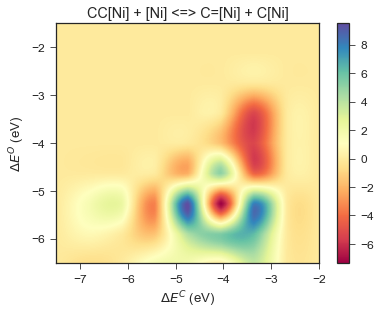

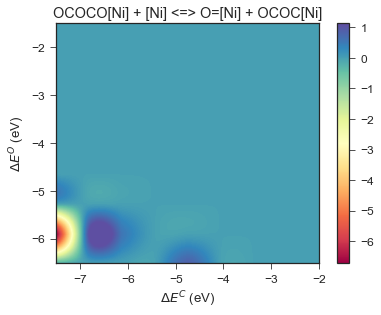

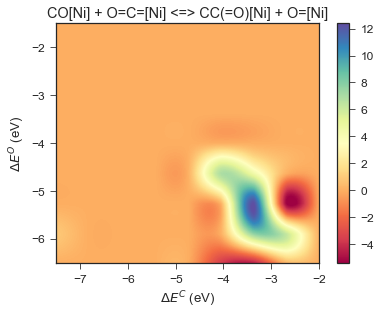

skipping OC=CO + [Ni] <=> OC=CO.[Ni] because it's boring


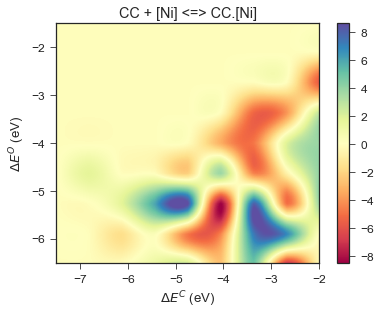

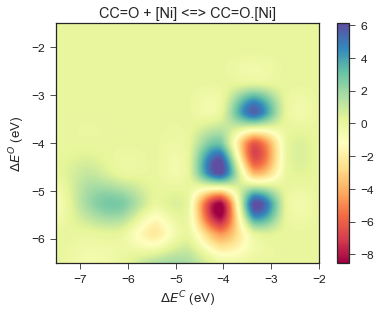

skipping OC(O)C(O)O + 2 [Ni] <=> 2 OC(O)[Ni] because it's boring


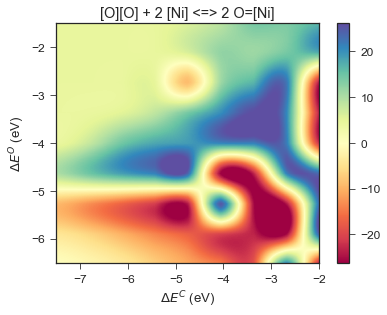

skipping OC(O)C(O)O + [Ni] <=> OC(O)C(O)O.[Ni] because it's boring
skipping CC(C)O + [Ni] <=> CC(C)O.[Ni] because it's boring
skipping CC=CO + [Ni] <=> CC=CO.[Ni] because it's boring


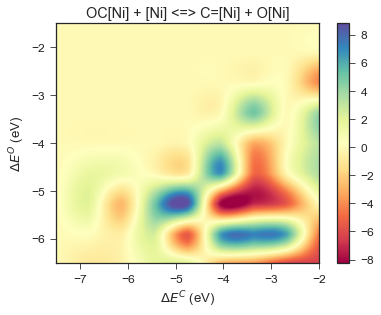

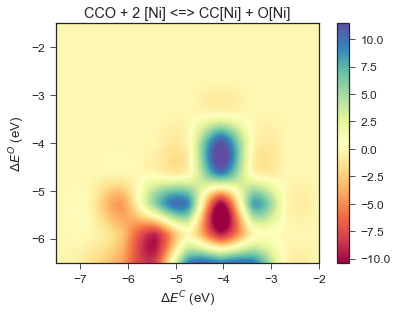

skipping OCOC(O)OCO + [Ni] <=> OCOC(O)OCO.[Ni] because it's boring
skipping COO + [Ni] <=> COO.[Ni] because it's boring


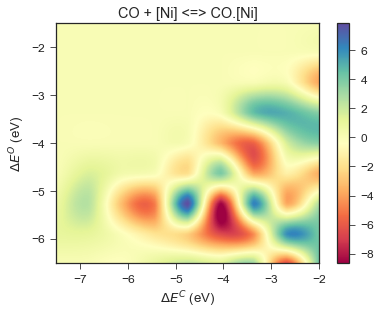

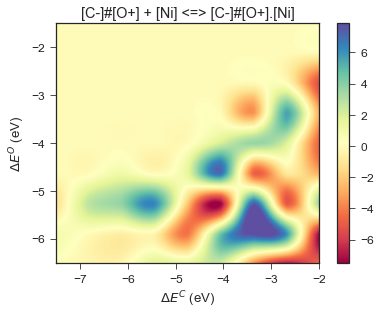

skipping CC(O)(O)OCO + [Ni] <=> CC(O)(O)OCO.[Ni] because it's boring
skipping OC(O)C(O)O + 2 [Ni] <=> O[Ni] + OC(O)C(O)[Ni] because it's boring
skipping OCOO + [Ni] <=> OCOO.[Ni] because it's boring
skipping CC(O)OCO + [Ni] <=> CC(O)OCO.[Ni] because it's boring
skipping CCO[Ni] + [Ni] <=> CC[Ni] + O=[Ni] because it's boring
skipping OCC(O)O + 2 [Ni] <=> OC[Ni] + OC(O)[Ni] because it's boring
skipping CC(O)OC(C)O + [Ni] <=> CC(O)OC(C)O.[Ni] because it's boring
skipping C=CO + [Ni] <=> C=CO.[Ni] because it's boring
skipping OCC(O)OO + 2 [Ni] <=> O[Ni] + OCC([Ni])OO because it's boring
skipping OCOCOO + 2 [Ni] <=> O[Ni] + OCOCO[Ni] because it's boring


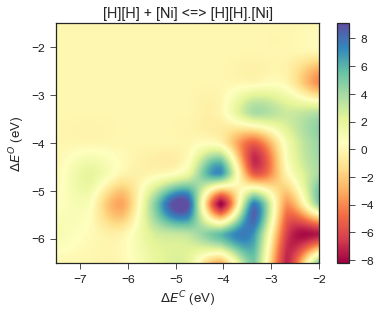

skipping OCC(O)OO + [Ni] <=> OCC(O)OO.[Ni] because it's boring


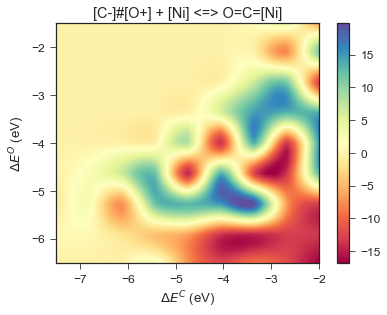

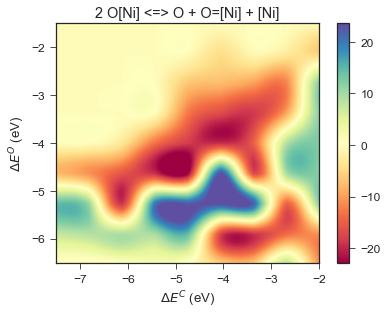

skipping CC(O)(O)O + [Ni] <=> CC(O)(O)O.[Ni] because it's boring


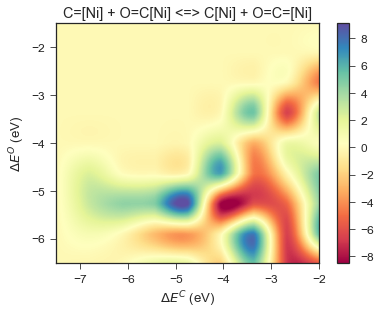

skipping COC(C)(O)O + [Ni] <=> COC(C)(O)O.[Ni] because it's boring


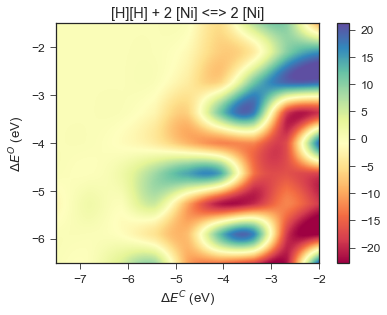

skipping CC=C(C)O + [Ni] <=> CC=C(C)O.[Ni] because it's boring
skipping OCCOO + [Ni] <=> OCCOO.[Ni] because it's boring
skipping OCC(O)O + 2 [Ni] <=> O[Ni] + OCC(O)[Ni] because it's boring
skipping OCC(O)O + [Ni] <=> OCC(O)O.[Ni] because it's boring


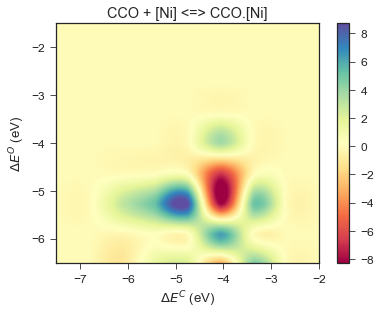

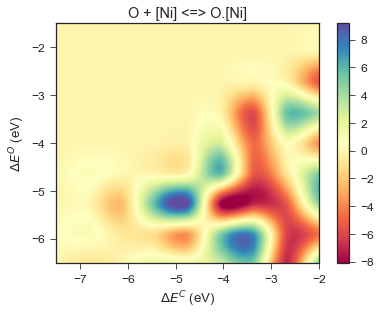

skipping CC=CC + [Ni] <=> CC=CC.[Ni] because it's boring


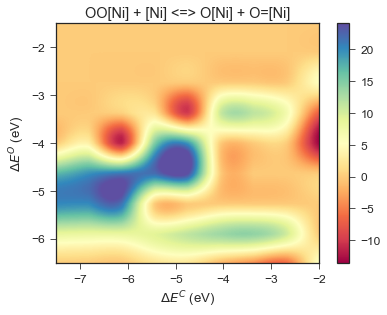

skipping CC(O)(O)OO + [Ni] <=> CC(O)(O)OO.[Ni] because it's boring


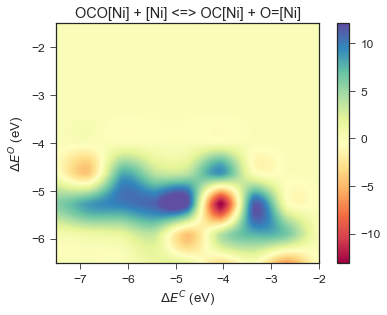

skipping CC=C(C)O[Ni] + [Ni] <=> CC=C(C)[Ni] + O=[Ni] because it's boring
skipping OCC(O)OO + 2 [Ni] <=> O[Ni] + OCC(O)O[Ni] because it's boring


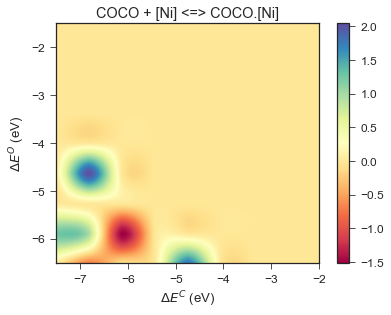

skipping COC(O)O + [Ni] <=> COC(O)O.[Ni] because it's boring
skipping OCC(O)OO + 2 [Ni] <=> OC[Ni] + OOC(O)[Ni] because it's boring
skipping CC(C)(O)OO + [Ni] <=> CC(C)(O)OO.[Ni] because it's boring
skipping CC(O)(O)O[Ni] + [Ni] <=> O=[Ni] + CC(O)(O)[Ni] because it's boring
skipping OCOC(O)OCO + 2 [Ni] <=> OC[Ni] + OCOC(O)O[Ni] because it's boring
skipping COC(O)OCO + 2 [Ni] <=> C[Ni] + OCOC(O)O[Ni] because it's boring
skipping CC[O] + [Ni] <=> CCO[Ni] because it's boring
skipping OCOC(O)OCO + 2 [Ni] <=> OCOC(O)[Ni] + OCO[Ni] because it's boring
skipping OCOC(O)OO + 2 [Ni] <=> OCO[Ni] + OOC(O)[Ni] because it's boring
skipping COCOCO + 2 [Ni] <=> C[Ni] + OCOCO[Ni] because it's boring


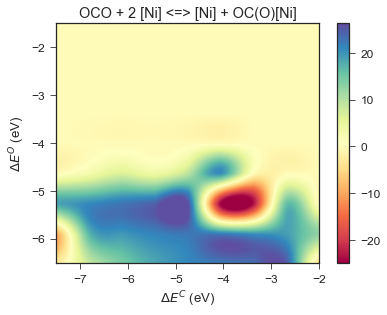

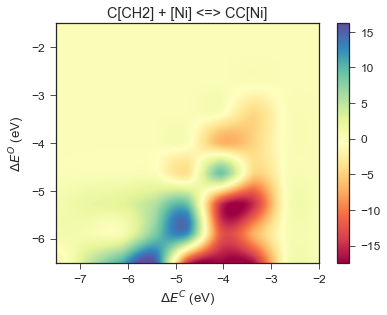

skipping OOCO[Ni] + [Ni] <=> O=[Ni] + OOC[Ni] because it's boring
skipping COC(O)OC + 2 [Ni] <=> C[Ni] + COC(O)O[Ni] because it's boring
skipping CC(O)OC(O)O + 2 [Ni] <=> C[Ni] + OC(O)OC(O)[Ni] because it's boring


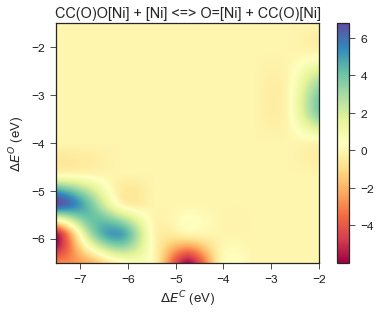

skipping OCOC(O)OO + 2 [Ni] <=> O[Ni] + OCOC(O)O[Ni] because it's boring
skipping OCOC(O)OCO + 2 [Ni] <=> O[Ni] + OCOC(O)OC[Ni] because it's boring
skipping CC(O)(O)O + 2 [Ni] <=> C[Ni] + OC(O)(O)[Ni] because it's boring


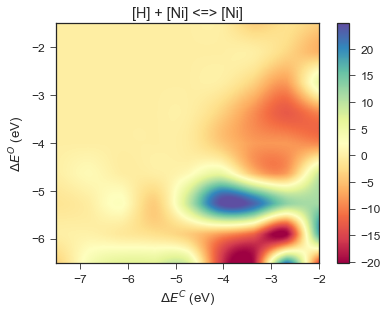

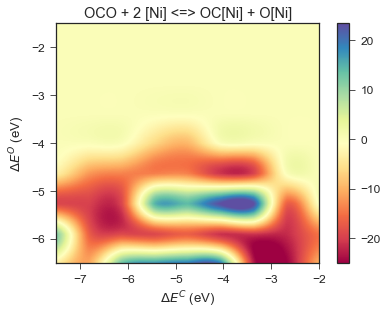

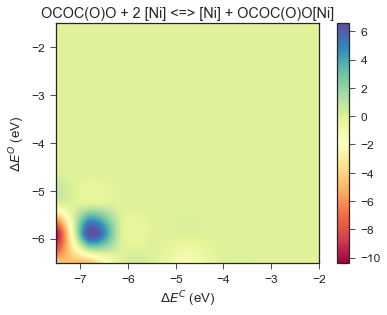

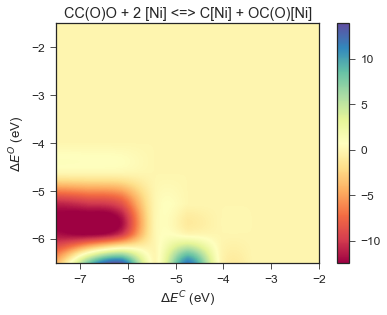

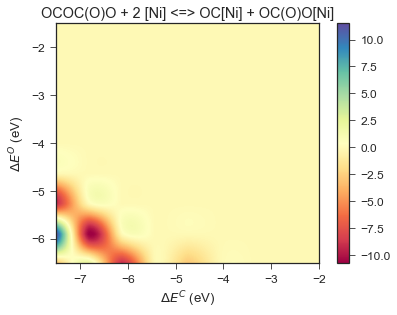

skipping CC(O)(O)OCO + 2 [Ni] <=> OCO[Ni] + CC(O)(O)[Ni] because it's boring
skipping COC(O)O + 2 [Ni] <=> C[Ni] + OC(O)O[Ni] because it's boring
skipping OCOC(O)OO + 2 [Ni] <=> OC[Ni] + OOC(O)O[Ni] because it's boring
skipping COC(O)OCO + 2 [Ni] <=> OC[Ni] + COC(O)O[Ni] because it's boring
skipping COC(C)(O)O + 2 [Ni] <=> C[Ni] + CC(O)(O)O[Ni] because it's boring
skipping COCOCO + 2 [Ni] <=> CO[Ni] + OCOC[Ni] because it's boring
skipping COC(O)OCO + 2 [Ni] <=> COC(O)[Ni] + OCO[Ni] because it's boring


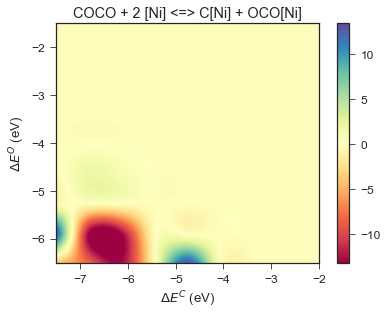

skipping COCOO + 2 [Ni] <=> C[Ni] + OOCO[Ni] because it's boring
skipping CC(O)OC(O)O + 2 [Ni] <=> OC(O)[Ni] + CC(O)O[Ni] because it's boring
skipping OCOC(O)O + 2 [Ni] <=> OC(O)[Ni] + OCO[Ni] because it's boring


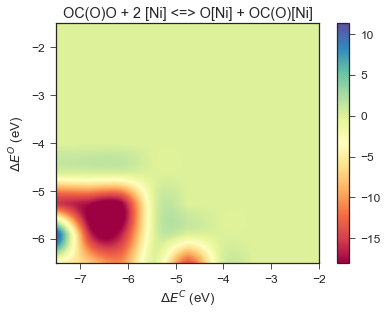

skipping CC(O)OCO + 2 [Ni] <=> C[Ni] + OCOC(O)[Ni] because it's boring
skipping CC(O)(O)OCO + 2 [Ni] <=> OC[Ni] + CC(O)(O)O[Ni] because it's boring
skipping CC(C)(O)O + 2 [Ni] <=> [Ni] + CC(C)(O)O[Ni] because it's boring
skipping COC(O)OCO + 2 [Ni] <=> CO[Ni] + OCOC(O)[Ni] because it's boring


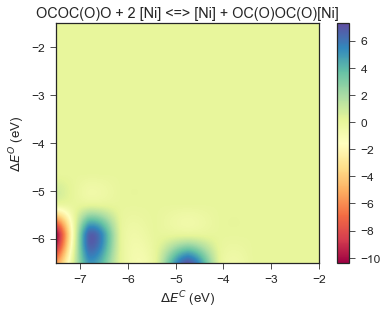

skipping COC(O)OCO + 2 [Ni] <=> O[Ni] + COC(O)OC[Ni] because it's boring
skipping CC(O)OO + 2 [Ni] <=> C[Ni] + OOC(O)[Ni] because it's boring


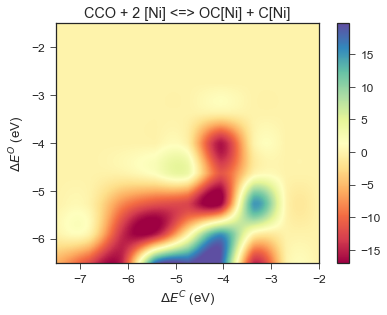

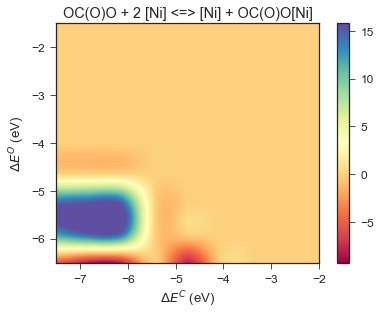

skipping COC(C)O + 2 [Ni] <=> C[Ni] + COC(O)[Ni] because it's boring
skipping CC(O)OC(C)O + 2 [Ni] <=> C[Ni] + CC(O)OC(O)[Ni] because it's boring


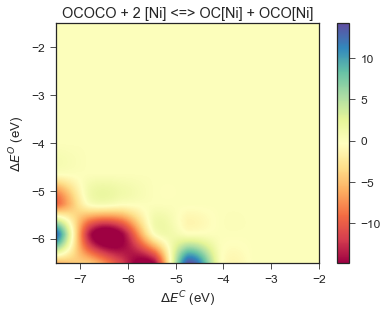

skipping CC(O)(O)OCO + 2 [Ni] <=> O[Ni] + CC(O)(O)OC[Ni] because it's boring


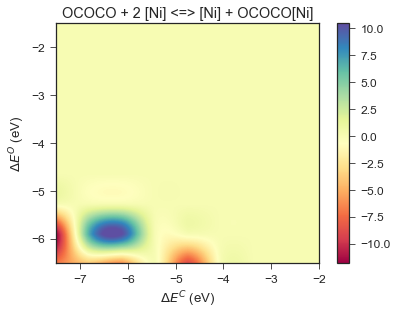

skipping CC(O)OC(C)O + 2 [Ni] <=> CC(O)O[Ni] + CC(O)[Ni] because it's boring


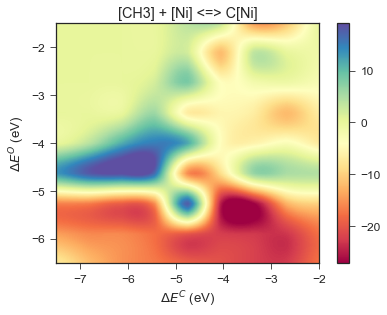

skipping COCOO + 2 [Ni] <=> CO[Ni] + OOC[Ni] because it's boring


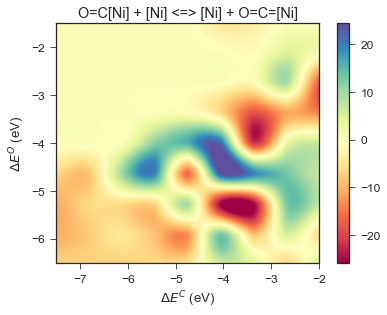

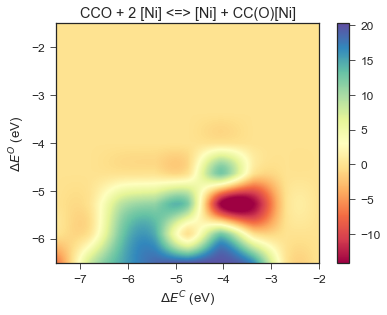

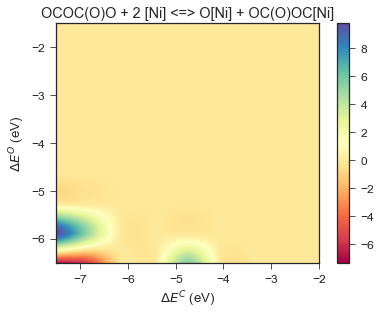

skipping CC(C)(O)O + 2 [Ni] <=> C[Ni] + CC(O)(O)[Ni] because it's boring
skipping COC(O)O + 2 [Ni] <=> [Ni] + COC(O)O[Ni] because it's boring
skipping CC(O)(O)O + 2 [Ni] <=> O[Ni] + CC(O)(O)[Ni] because it's boring
skipping COC(O)OC + 2 [Ni] <=> CO[Ni] + COC(O)[Ni] because it's boring
skipping CC(O)(O)OO + 2 [Ni] <=> O[Ni] + CC(O)([Ni])OO because it's boring
skipping CC=CO + 2 [Ni] <=> C[Ni] + OC=C[Ni] because it's boring
skipping CC(O)(O)O + 2 [Ni] <=> [Ni] + CC(O)(O)O[Ni] because it's boring
skipping COC(O)O + 2 [Ni] <=> CO[Ni] + OC(O)[Ni] because it's boring


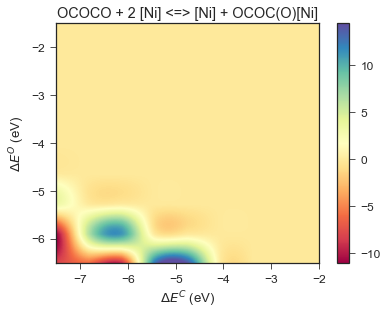

skipping COC(C)O + 2 [Ni] <=> C[Ni] + CC(O)O[Ni] because it's boring


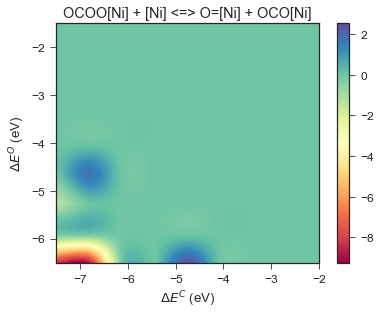

skipping COC(C)(O)O + 2 [Ni] <=> CO[Ni] + CC(O)(O)[Ni] because it's boring
skipping CC(O)OCO + 2 [Ni] <=> OC[Ni] + CC(O)O[Ni] because it's boring
skipping OOC(O)O + 2 [Ni] <=> O[Ni] + OC(O)O[Ni] because it's boring
skipping CC(O)=CO + 2 [Ni] <=> [Ni] + CC(=CO)O[Ni] because it's boring


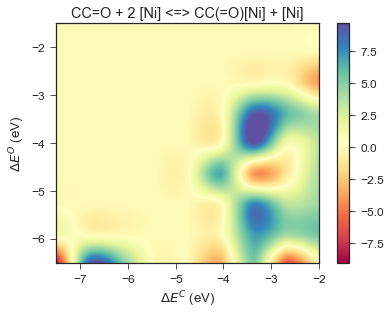

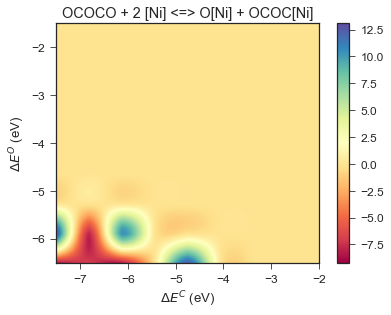

skipping CC(O)(O)OO + 2 [Ni] <=> O[Ni] + CC(O)(O)O[Ni] because it's boring


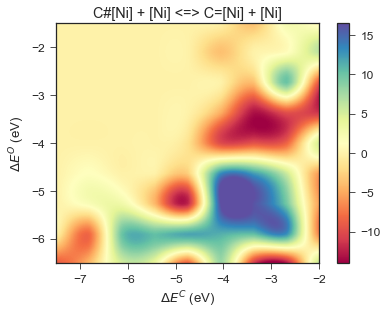

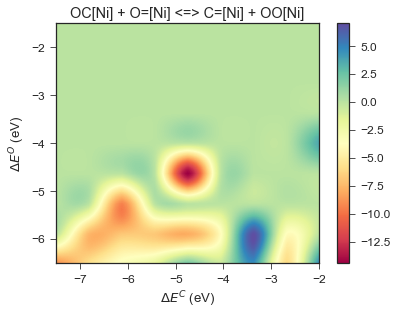

skipping CC(O)OCO + 2 [Ni] <=> [Ni] + CC(O)OC(O)[Ni] because it's boring


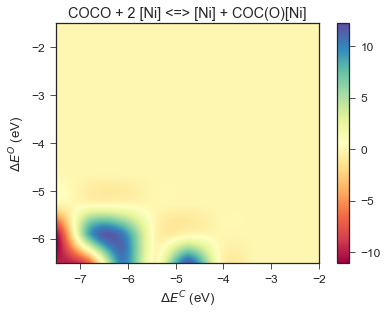

skipping OCOO + 2 [Ni] <=> O[Ni] + OCO[Ni] because it's boring


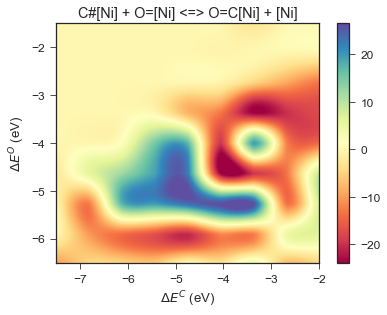

skipping CC(O)OO[Ni] + [Ni] <=> O=[Ni] + CC(O)O[Ni] because it's boring
skipping CC(O)OO + 2 [Ni] <=> O[Ni] + CC([Ni])OO because it's boring


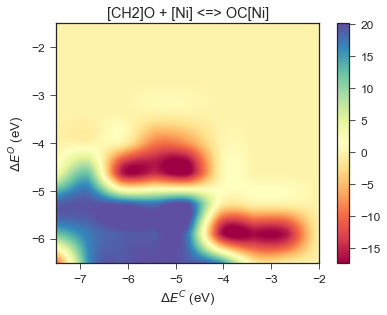

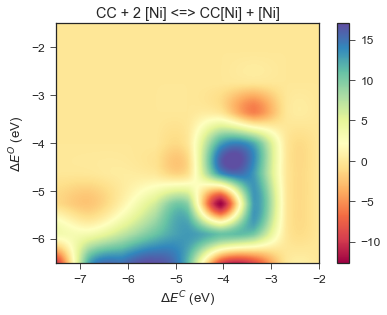

skipping OCOO + 2 [Ni] <=> [Ni] + OOCO[Ni] because it's boring
skipping CC(O)OCO + 2 [Ni] <=> O[Ni] + CC(O)OC[Ni] because it's boring


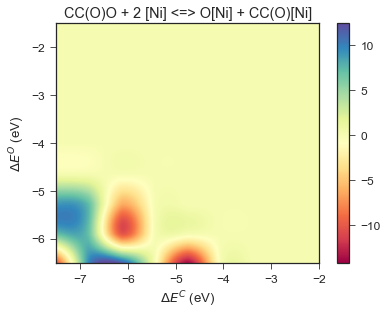

skipping CC=CO + 2 [Ni] <=> CC=C[Ni] + O[Ni] because it's boring


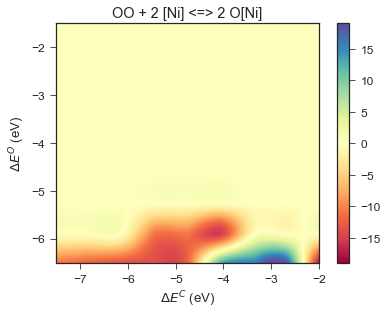

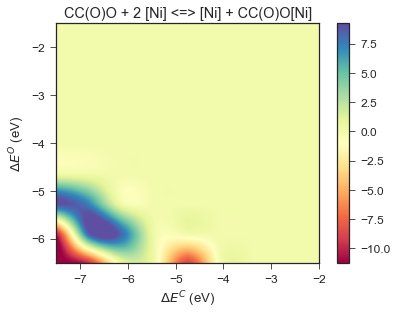

skipping CC(C)(O)OO + 2 [Ni] <=> O[Ni] + CC(C)(O)O[Ni] because it's boring
skipping CCOO + 2 [Ni] <=> C[Ni] + OOC[Ni] because it's boring


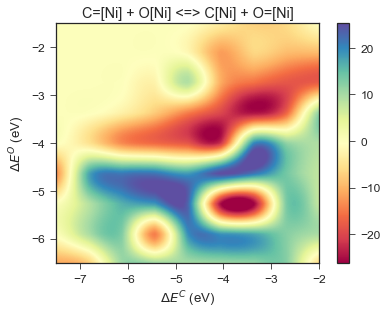

skipping CC=CC + 2 [Ni] <=> CC=C[Ni] + C[Ni] because it's boring


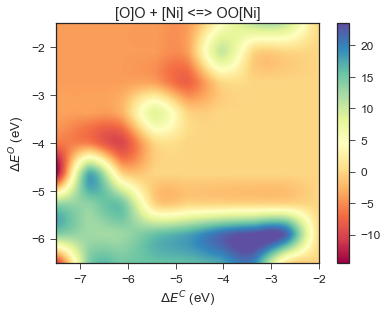

skipping OOC[Ni] + [Ni] <=> C=[Ni] + OO[Ni] because it's boring
skipping COC(C)O + 2 [Ni] <=> CO[Ni] + CC(O)[Ni] because it's boring
skipping C=CC + 2 [Ni] <=> C=C[Ni] + C[Ni] because it's boring


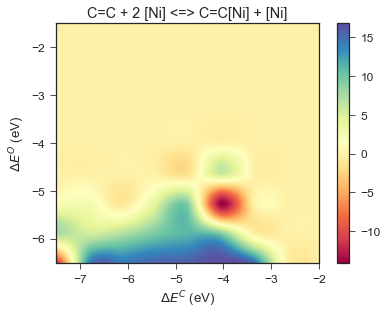

skipping CC(O)OO + 2 [Ni] <=> O[Ni] + CC(O)O[Ni] because it's boring
skipping CCOO + 2 [Ni] <=> O[Ni] + CCO[Ni] because it's boring
skipping CC=CC + 2 [Ni] <=> CC=C(C)[Ni] + [Ni] because it's boring
skipping CC=C(C)O + 2 [Ni] <=> [Ni] + CC=C(C)O[Ni] because it's boring
skipping C=CC + 2 [Ni] <=> CC=C[Ni] + [Ni] because it's boring
skipping CCOO + 2 [Ni] <=> CC[Ni] + OO[Ni] because it's boring


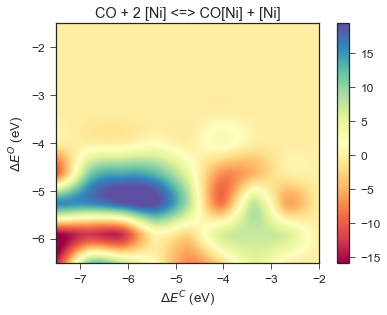

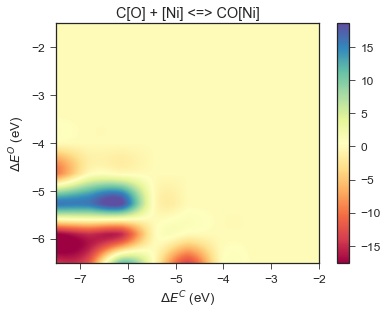

skipping COO + 2 [Ni] <=> [Ni] + OOC[Ni] because it's boring


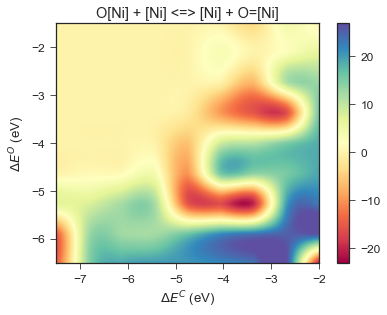

skipping COO + 2 [Ni] <=> CO[Ni] + O[Ni] because it's boring


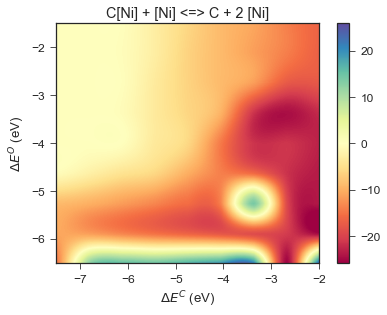

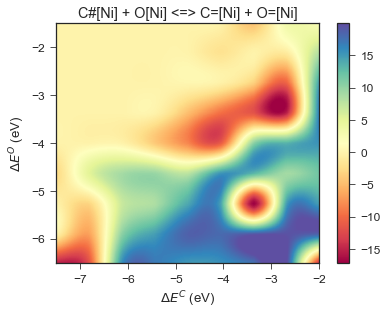

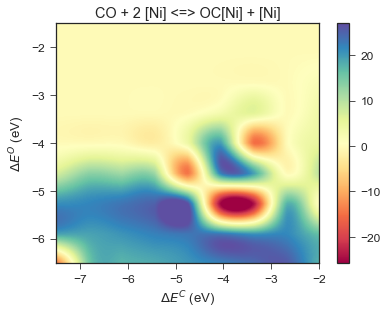

skipping COO + 2 [Ni] <=> C[Ni] + OO[Ni] because it's boring


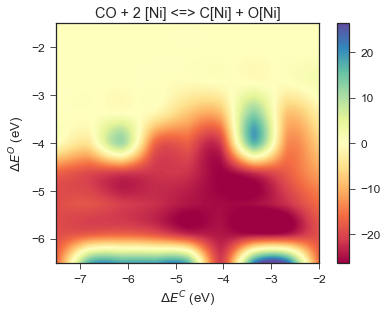

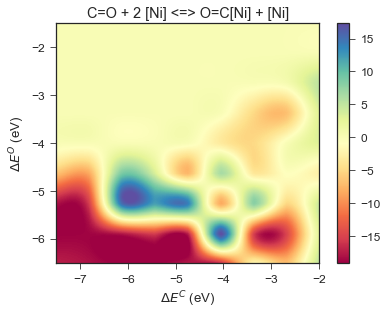

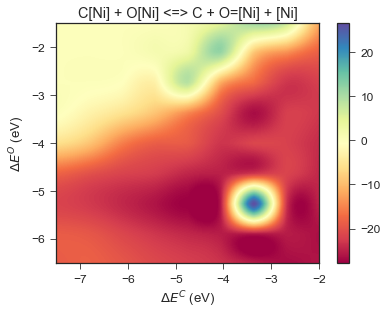

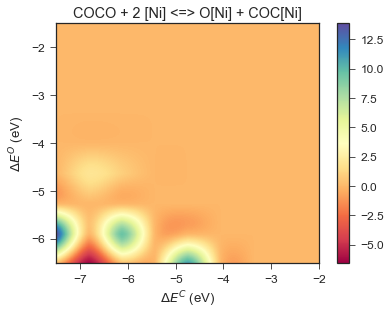

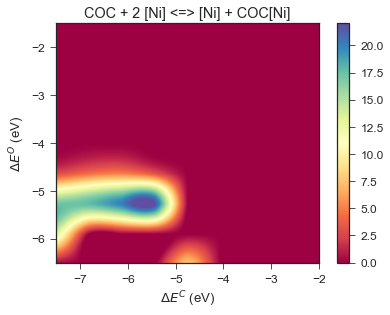

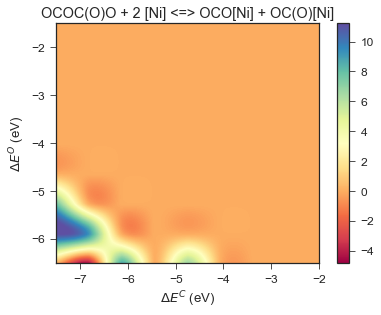

skipping OC(O)(O)O + 2 [Ni] <=> [Ni] + OC(O)(O)O[Ni] because it's boring
skipping OC(O)(O)O + 2 [Ni] <=> O[Ni] + OC(O)(O)[Ni] because it's boring
skipping OCOC(O)(O)O + 2 [Ni] <=> O[Ni] + OCOC(O)(O)[Ni] because it's boring
skipping OCOC(O)(O)O + 2 [Ni] <=> OC[Ni] + OC(O)(O)O[Ni] because it's boring
skipping OCOC(O)(O)O + 2 [Ni] <=> OCO[Ni] + OC(O)(O)[Ni] because it's boring
skipping OC(O)(O)O[Ni] + [Ni] <=> O=[Ni] + OC(O)(O)[Ni] because it's boring
skipping OCOC(O)(O)O[Ni] + [Ni] <=> O=[Ni] + OCOC(O)(O)[Ni] because it's boring
skipping OC(O)OCO[Ni] + [Ni] <=> O=[Ni] + OC(O)OC[Ni] because it's boring
skipping OC(O)(O)O + [Ni] <=> OC(O)(O)O.[Ni] because it's boring
skipping OCOC(O)(O)O + [Ni] <=> OCOC(O)(O)O.[Ni] because it's boring


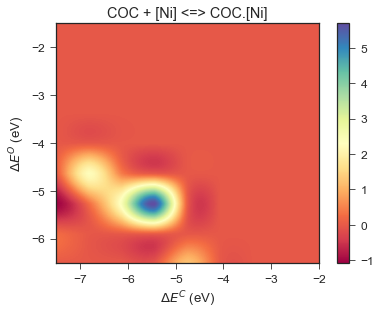

skipping OCOC(O)(O)O + 2 [Ni] <=> [Ni] + OCOC(O)(O)O[Ni] because it's boring
skipping OCOC(O)O + 2 [Ni] <=> [Ni] + OCOC(O)(O)[Ni] because it's boring


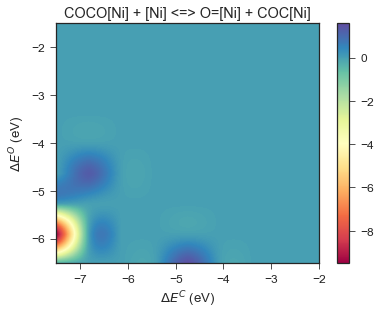

skipping OCOC(O)O + 2 [Ni] <=> [Ni] + OC(O)OCO[Ni] because it's boring
skipping COCO + 2 [Ni] <=> [Ni] + COCO[Ni] because it's boring


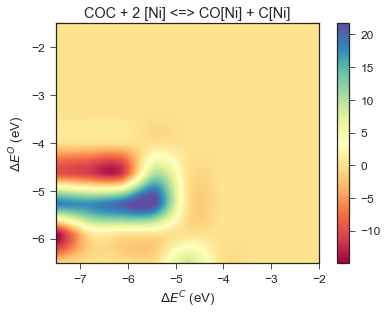

skipping OCC(O)O + 2 [Ni] <=> [Ni] + OCC(O)(O)[Ni] because it's boring
skipping OCC(O)(O)O + 2 [Ni] <=> [Ni] + OCC(O)(O)O[Ni] because it's boring
skipping OCC(O)(O)O + 2 [Ni] <=> O[Ni] + OCC(O)(O)[Ni] because it's boring
skipping OCC(O)(O)O[Ni] + [Ni] <=> O=[Ni] + OCC(O)(O)[Ni] because it's boring
skipping OC(O)OO[Ni] + [Ni] <=> O=[Ni] + OC(O)O[Ni] because it's boring


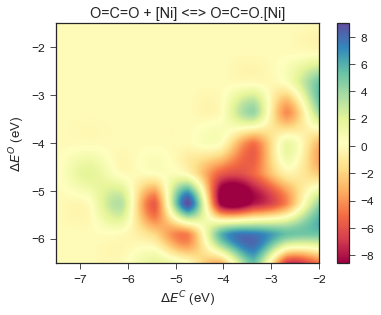

skipping OCC(O)(O)O + [Ni] <=> OCC(O)(O)O.[Ni] because it's boring
skipping OCC(O)(O)O + 2 [Ni] <=> OC[Ni] + OC(O)(O)[Ni] because it's boring
skipping COO[Ni] + [Ni] <=> CO[Ni] + O=[Ni] because it's boring


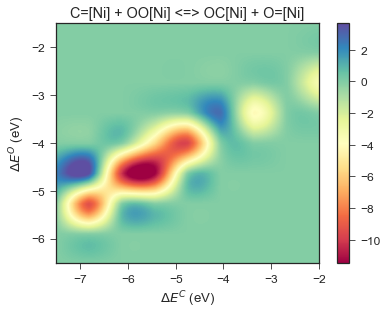

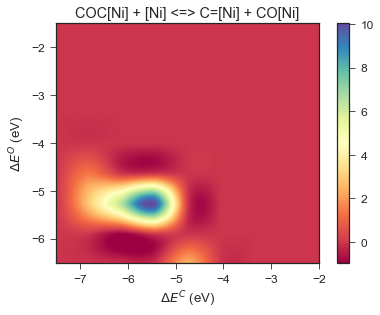

skipping COCOO[Ni] + [Ni] <=> O=[Ni] + COCO[Ni] because it's boring
skipping C=[Ni] + COO[Ni] <=> O=[Ni] + COC[Ni] because it's boring


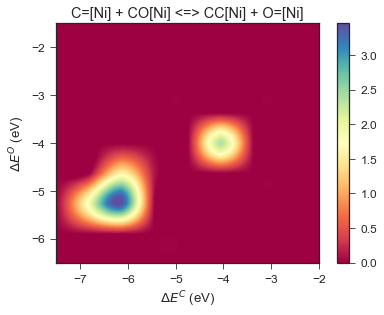

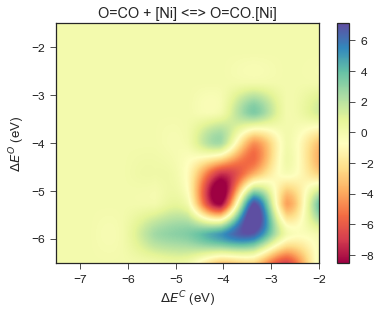

skipping OCOCOC(O)O + 2 [Ni] <=> OC(O)[Ni] + OCOCO[Ni] because it's boring
skipping OCOCOC(O)O + 2 [Ni] <=> O[Ni] + OCOCOC(O)[Ni] because it's boring


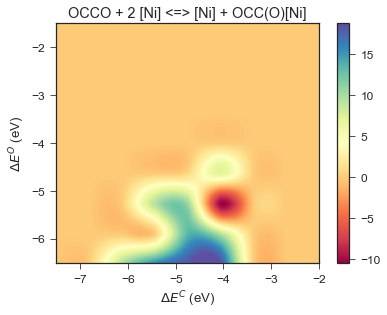

skipping OCOCOC(O)O + [Ni] <=> OCOCOC(O)O.[Ni] because it's boring
skipping OCOCOC(O)O + 2 [Ni] <=> OCOC[Ni] + OC(O)O[Ni] because it's boring
skipping OC=CCO + [Ni] <=> OC=CCO.[Ni] because it's boring
skipping OCOCOC(O)O + 2 [Ni] <=> OCO[Ni] + OC(O)OC[Ni] because it's boring
skipping OCOCOC(O)O + 2 [Ni] <=> OC[Ni] + OC(O)OCO[Ni] because it's boring
skipping OCOCOCO + [Ni] <=> OCOCOCO.[Ni] because it's boring


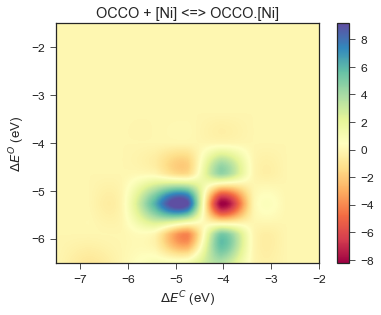

skipping OCOC(O)OCO + 2 [Ni] <=> OCO[Ni] + OCOC(O)[Ni] because it's boring
skipping OCOCOCO + 2 [Ni] <=> OCO[Ni] + OCOC[Ni] because it's boring
skipping OCOCOCO + 2 [Ni] <=> [Ni] + OCOCOC(O)[Ni] because it's boring
skipping OCOCOCO + 2 [Ni] <=> OC[Ni] + OCOCO[Ni] because it's boring


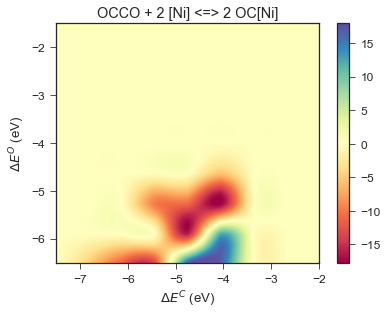

skipping COC(O)OCO + 2 [Ni] <=> OCO[Ni] + COC(O)[Ni] because it's boring
skipping OC=CCO + 2 [Ni] <=> [Ni] + OC=CC(O)[Ni] because it's boring
skipping OC=CCO + 2 [Ni] <=> OC[Ni] + OC=C[Ni] because it's boring


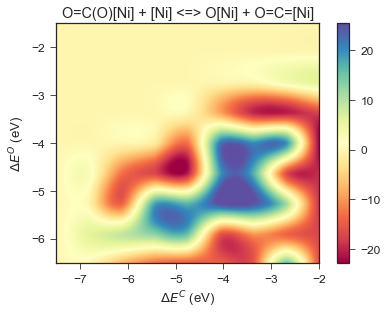

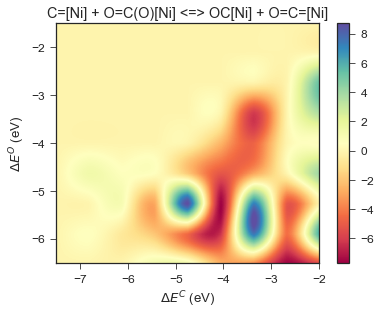

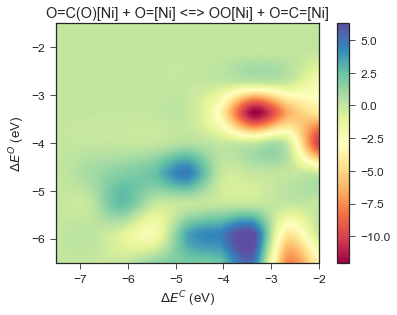

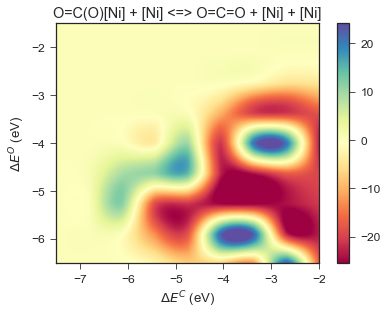

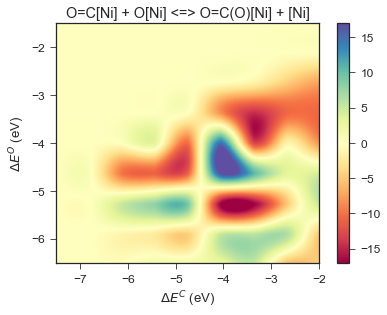

...

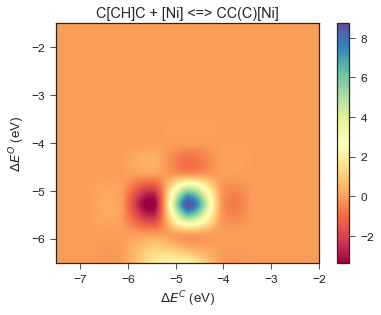

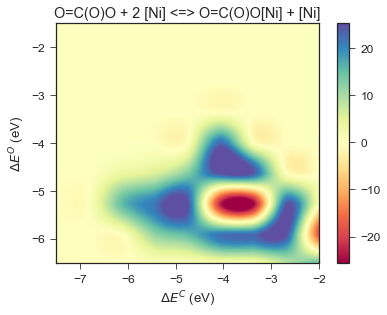

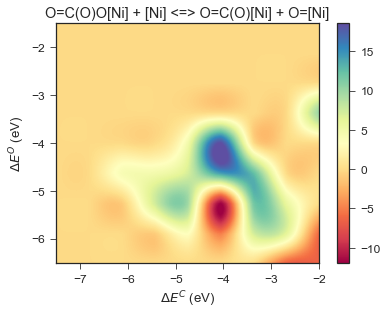

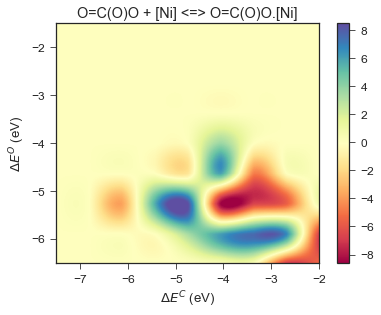

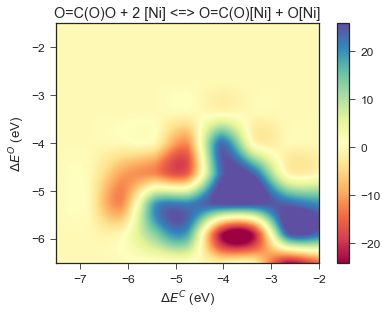

skipping OO[Ni] + O=C=[Ni] <=> O=C(O)[Ni] + O=[Ni] because it's boring
skipping [CH2]CC + [Ni] <=> CCC[Ni] because it's boring


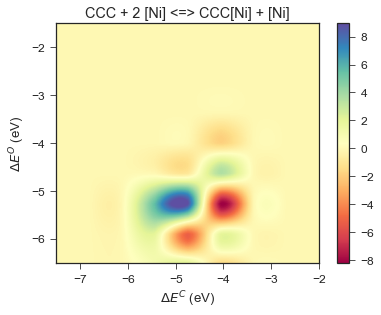

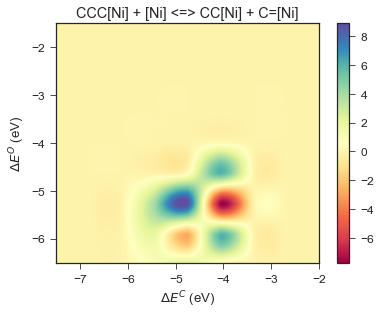

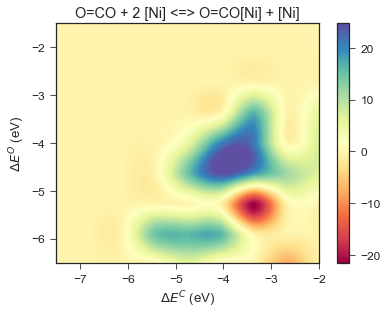

skipping COC(=O)O + 2 [Ni] <=> CO[Ni] + O=C(O)[Ni] because it's boring
skipping COC(=O)O + 2 [Ni] <=> [Ni] + O=C(O)OC[Ni] because it's boring
skipping COC(=O)O + 2 [Ni] <=> [Ni] + COC(=O)O[Ni] because it's boring
skipping COC(=O)O + 2 [Ni] <=> O[Ni] + COC(=O)[Ni] because it's boring
skipping CCOC(=O)O + [Ni] <=> CCOC(=O)O.[Ni] because it's boring
skipping CCOC(=O)O + 2 [Ni] <=> [Ni] + CC([Ni])OC(=O)O because it's boring
skipping CCOC(=O)O + 2 [Ni] <=> C[Ni] + O=C(O)OC[Ni] because it's boring


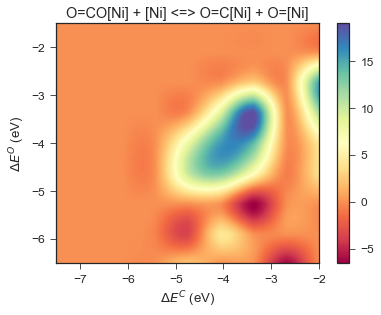

skipping CCOC(=O)O + 2 [Ni] <=> CC[Ni] + O=C(O)O[Ni] because it's boring
skipping COC(=O)O[Ni] + [Ni] <=> O=[Ni] + COC(=O)[Ni] because it's boring
skipping COC(=O)[Ni] + [Ni] <=> CO[Ni] + O=C=[Ni] because it's boring
skipping COC(=O)O + [Ni] <=> COC(=O)O.[Ni] because it's boring


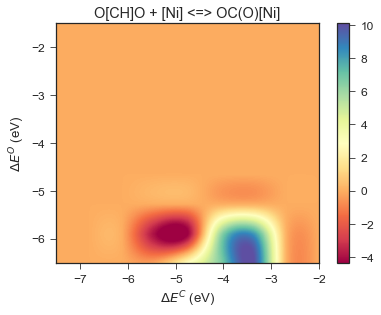

skipping O=C(O)OC[Ni] + [Ni] <=> C=[Ni] + O=C(O)O[Ni] because it's boring
skipping COC(=O)O + 2 [Ni] <=> C[Ni] + O=C(O)O[Ni] because it's boring


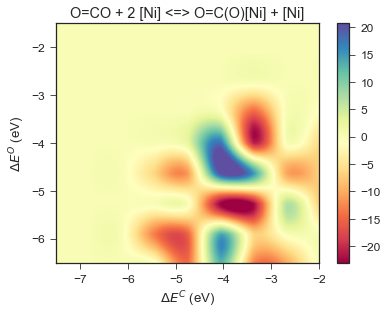

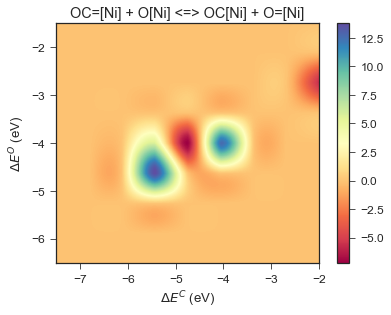

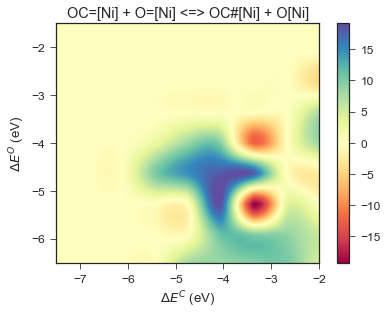

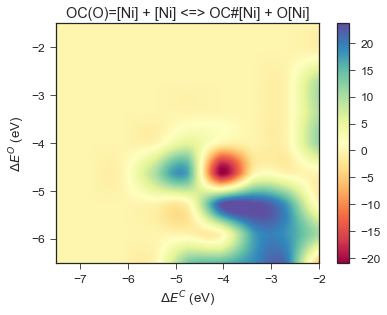

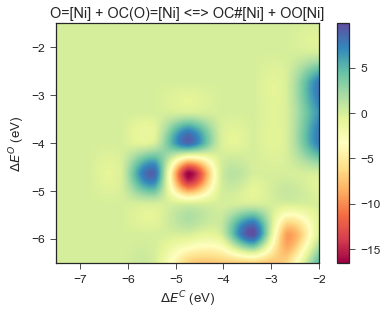

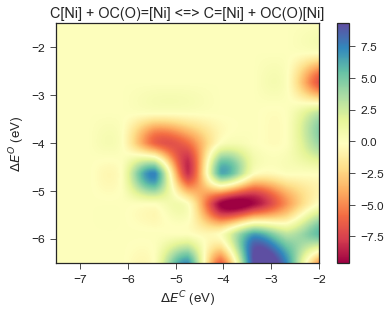

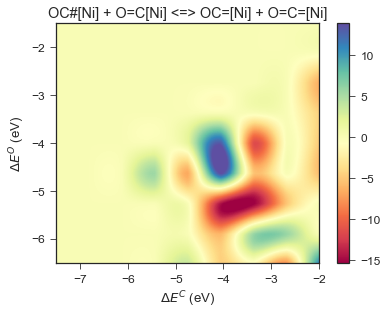

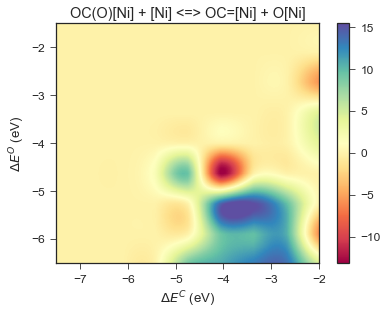

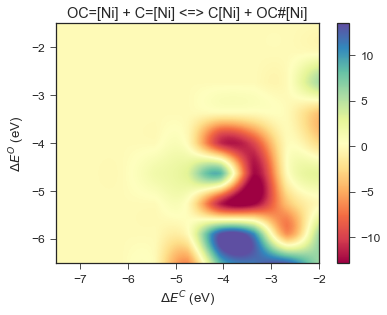

skipping CO[Ni] + OC#[Ni] <=> O=[Ni] + CC(O)=[Ni] because it's boring
skipping COC=[Ni] + [Ni] <=> CO[Ni] + C#[Ni] because it's boring


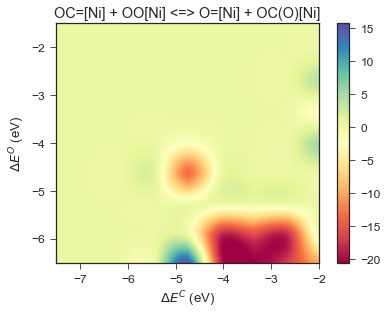

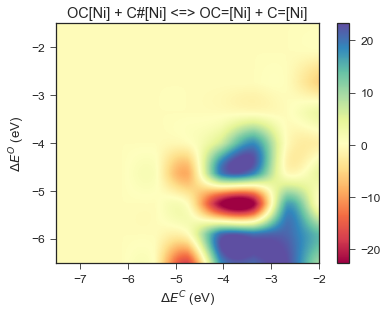

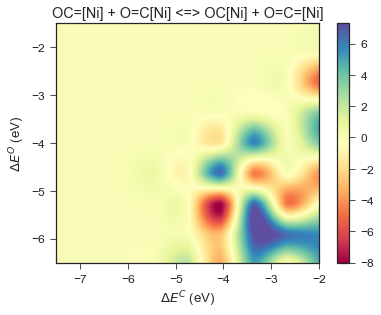

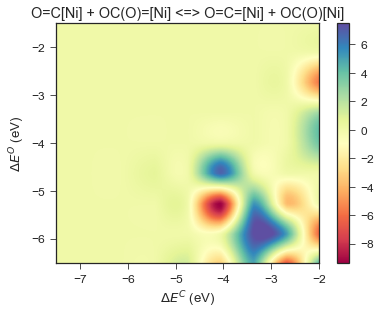

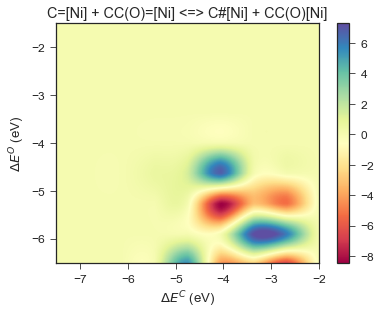

skipping OC=[Ni] + COC=[Ni] <=> OC#[Ni] + COC[Ni] because it's boring


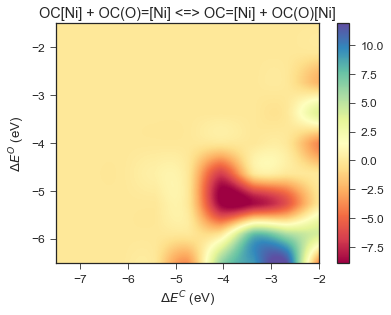

skipping OCOC[Ni] + OC(O)=[Ni] <=> OC(O)[Ni] + OCOC=[Ni] because it's boring


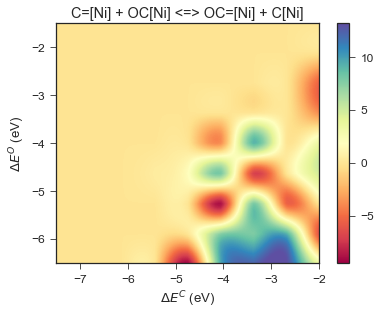

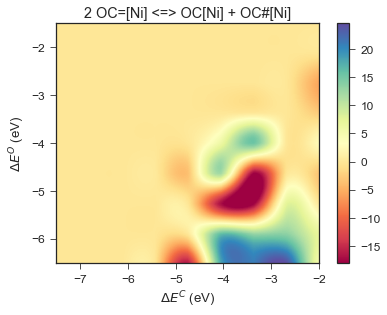

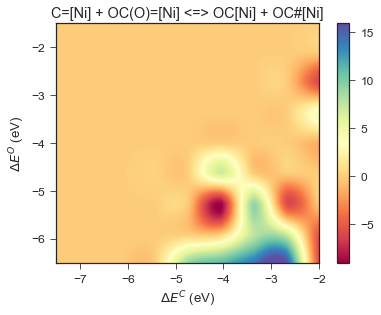

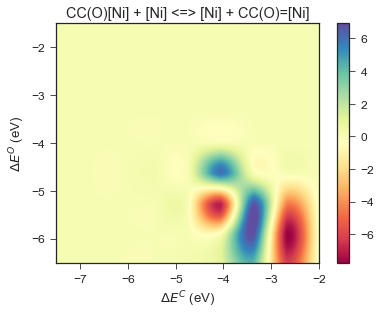

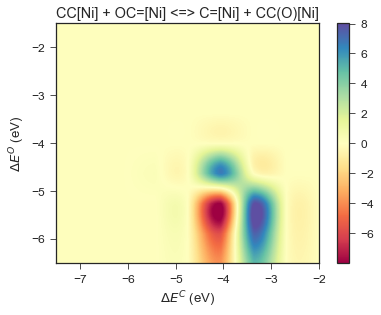

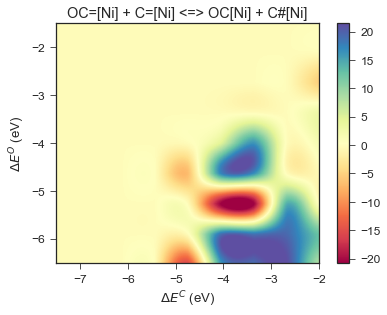

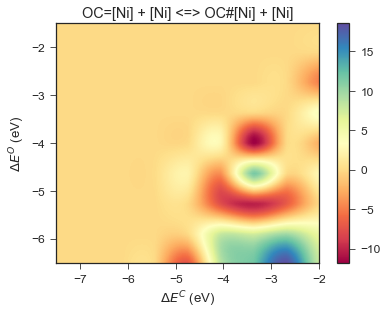

skipping O=C[Ni] + OCOC=[Ni] <=> O=C=[Ni] + OCOC[Ni] because it's boring


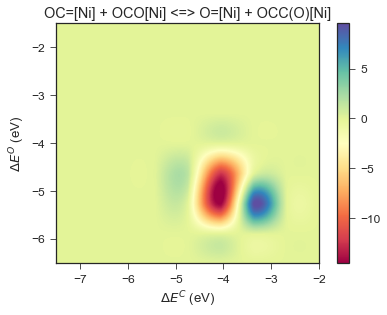

skipping C#[Ni] + OCOC[Ni] <=> C=[Ni] + OCOC=[Ni] because it's boring


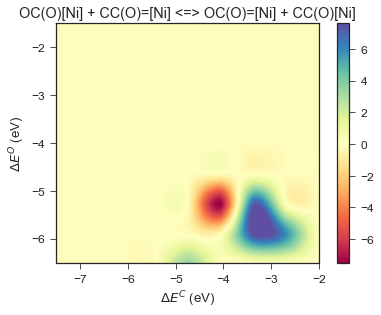

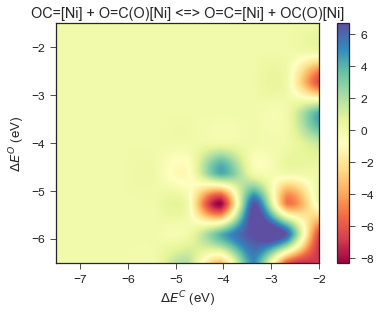

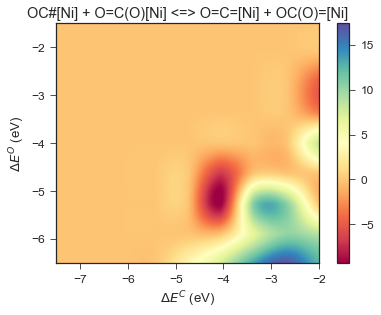

skipping C=[Ni] + CCO[Ni] <=> CCC[Ni] + O=[Ni] because it's boring


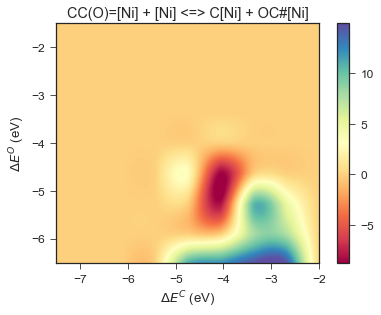

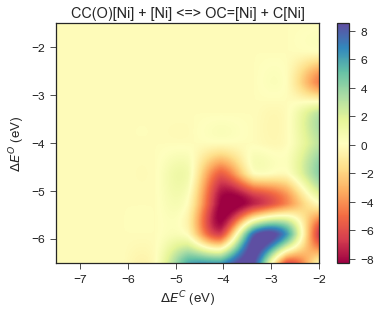

skipping OCOC[Ni] + [Ni] <=> [Ni] + OCOC=[Ni] because it's boring
skipping C=[Ni] + OCOC=[Ni] <=> C#[Ni] + OCOC[Ni] because it's boring
skipping OCOC=[Ni] + [Ni] <=> C#[Ni] + OCO[Ni] because it's boring
skipping OC=[Ni] + OCOC=[Ni] <=> OC#[Ni] + OCOC[Ni] because it's boring


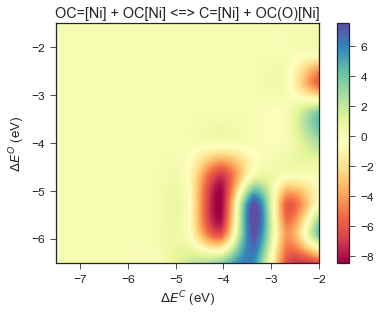

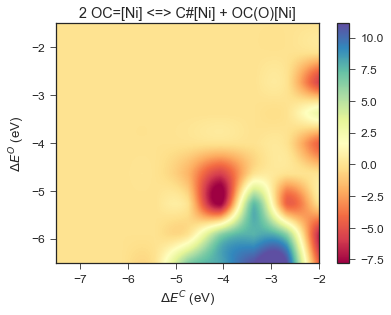

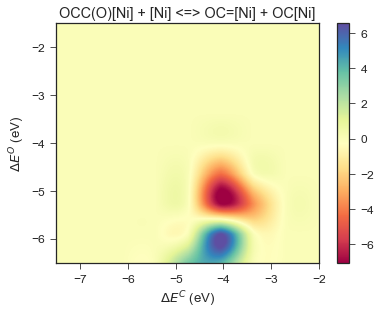

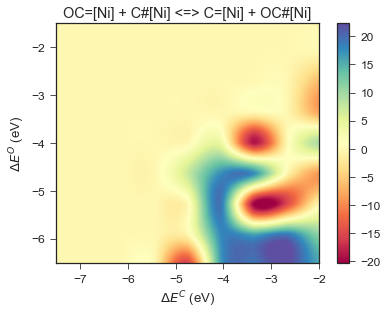

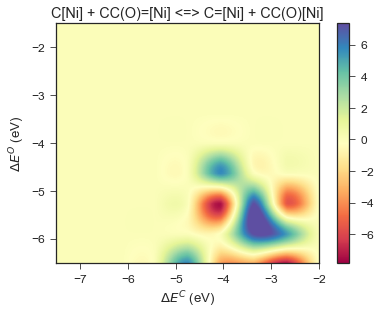

skipping OCOC[Ni] + CC(O)=[Ni] <=> OCOC=[Ni] + CC(O)[Ni] because it's boring
skipping C#[Ni] + COC[Ni] <=> C=[Ni] + COC=[Ni] because it's boring
skipping COC[Ni] + CC(O)=[Ni] <=> COC=[Ni] + CC(O)[Ni] because it's boring


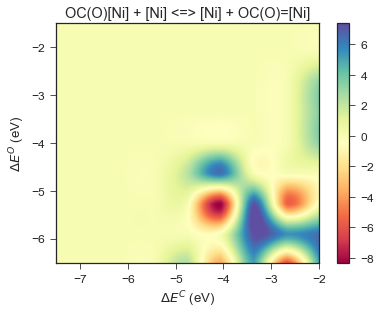

skipping O[Ni] + COC=[Ni] <=> O=[Ni] + COC[Ni] because it's boring


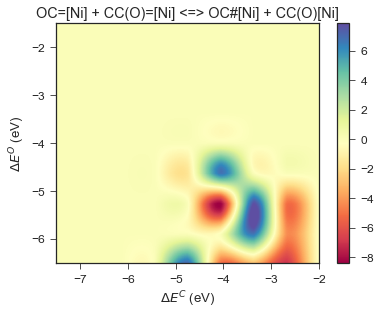

skipping OC[Ni] + OCOC=[Ni] <=> OC=[Ni] + OCOC[Ni] because it's boring


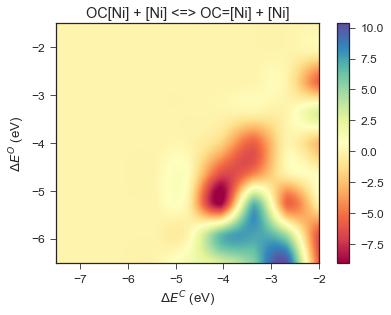

skipping C[Ni] + OCOC=[Ni] <=> C=[Ni] + OCOC[Ni] because it's boring


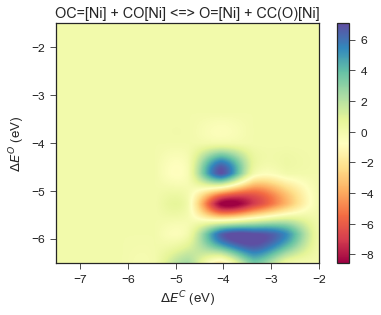

skipping O[Ni] + OCOC=[Ni] <=> O=[Ni] + OCOC[Ni] because it's boring


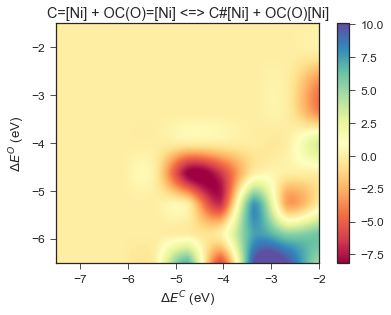

skipping COC[Ni] + [Ni] <=> [Ni] + COC=[Ni] because it's boring


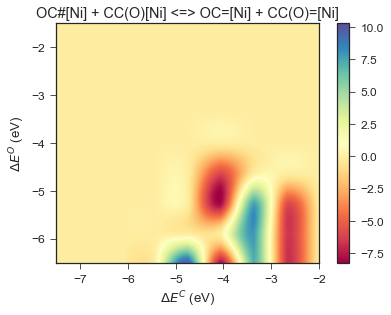

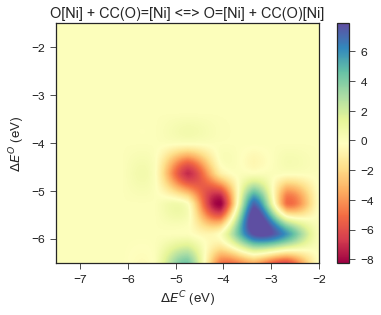

skipping C[Ni] + COC=[Ni] <=> C=[Ni] + COC[Ni] because it's boring


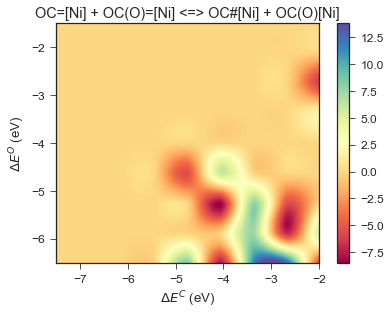

skipping O=C[Ni] + COC=[Ni] <=> O=C=[Ni] + COC[Ni] because it's boring
skipping COC[Ni] + OC(O)=[Ni] <=> OC(O)[Ni] + COC=[Ni] because it's boring
skipping COC=[Ni] + OCOC[Ni] <=> COC[Ni] + OCOC=[Ni] because it's boring


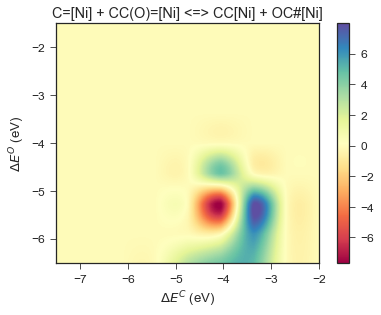

skipping OC[Ni] + COC=[Ni] <=> OC=[Ni] + COC[Ni] because it's boring
skipping C=[Ni] + COC=[Ni] <=> C#[Ni] + COC[Ni] because it's boring


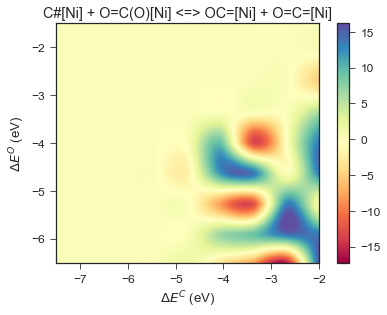

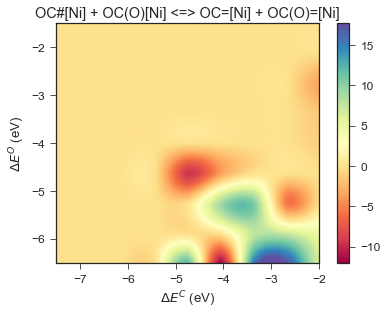

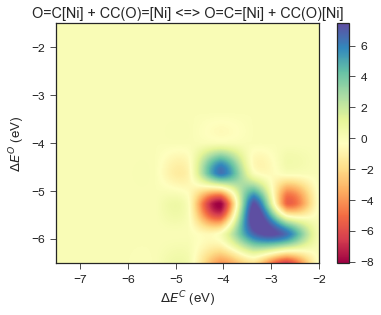

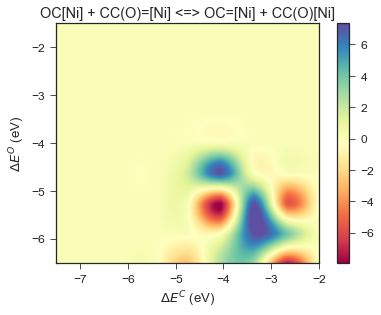

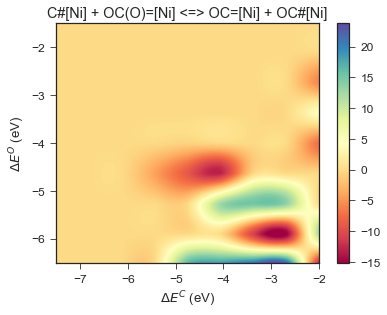

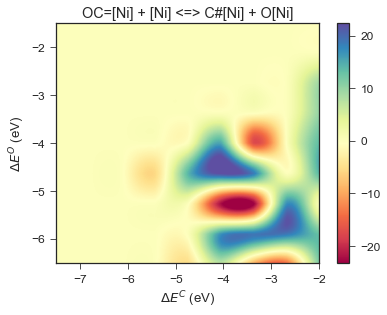

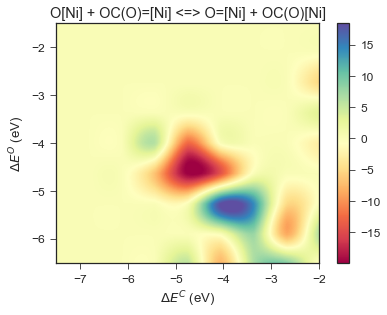

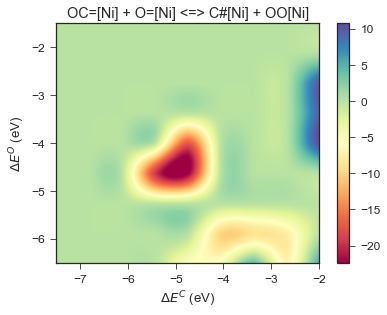

skipping OC#[Ni] + OO[Ni] <=> O=[Ni] + OC(O)=[Ni] because it's boring
skipping C#[Ni] + COO[Ni] <=> O=[Ni] + COC=[Ni] because it's boring
skipping O=[Ni] + O=C([Ni])CO <=> O=C=[Ni] + OCO[Ni] because it's boring
skipping O=C([Ni])CO + [Ni] <=> OC[Ni] + O=C=[Ni] because it's boring
skipping C#[Ni] + OO[Ni] <=> OC=[Ni] + O=[Ni] because it's boring
skipping C#C + [Ni] <=> C#C.[Ni] because it's boring


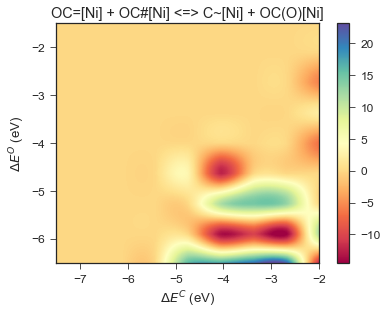

skipping OCOC(O)=[Ni] + [Ni] <=> OC#[Ni] + OCO[Ni] because it's boring
skipping OC=[Ni] + OOC(O)[Ni] <=> OC(O)[Ni] + OOC=[Ni] because it's boring
skipping OC=[Ni] + OCOC(O)[Ni] <=> OC(O)[Ni] + OCOC=[Ni] because it's boring


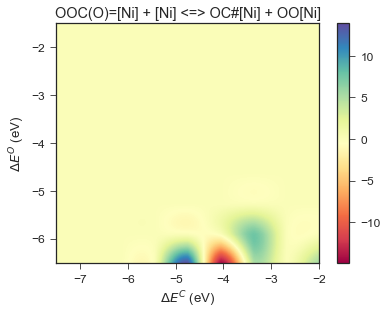

skipping O=[Ni] + OCC(O)[Ni] <=> OC=[Ni] + OCO[Ni] because it's boring
skipping [CH2]CO + [Ni] <=> OCC[Ni] because it's boring


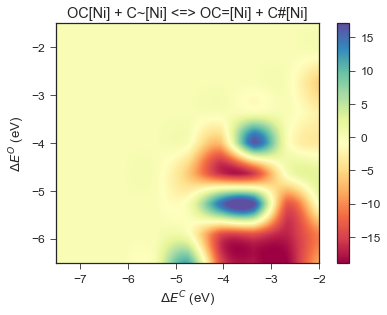

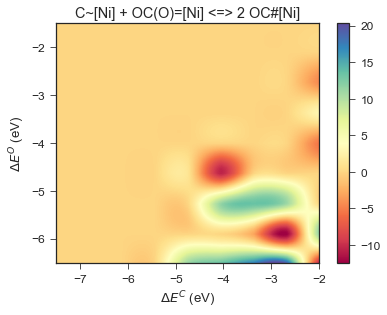

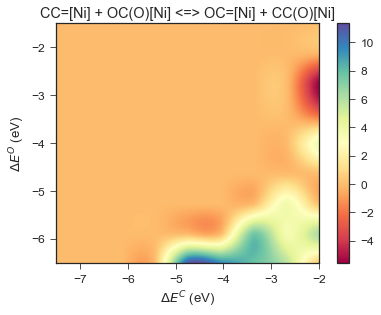

skipping OC=[Ni] + OC(O)(O)[Ni] <=> OC(O)[Ni] + OC(O)=[Ni] because it's boring
skipping OCOC(O)[Ni] + [Ni] <=> OC=[Ni] + OCO[Ni] because it's boring
skipping OOC(O)[Ni] + [Ni] <=> OC=[Ni] + OO[Ni] because it's boring


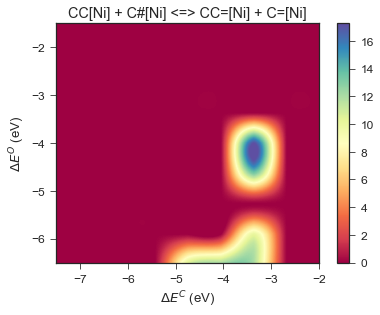

skipping OC(O)=[Ni] + OOC(O)[Ni] <=> OC(O)[Ni] + OOC(O)=[Ni] because it's boring
skipping OC=[Ni] + CC(O)(O)[Ni] <=> OC(O)[Ni] + CC(O)=[Ni] because it's boring
skipping OC=[Ni] + OOC[Ni] <=> C=[Ni] + OOC(O)[Ni] because it's boring
skipping OC=[Ni] + COC(O)[Ni] <=> OC(O)[Ni] + COC=[Ni] because it's boring
skipping OC(O)C(O)[Ni] + [Ni] <=> OC=[Ni] + OC(O)[Ni] because it's boring


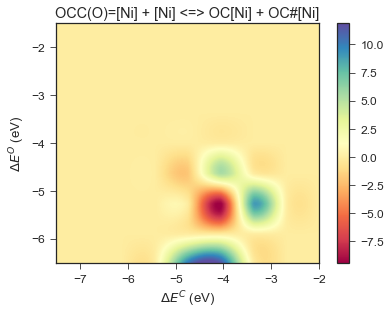

skipping OC=[Ni] + C=CC(O)=[Ni] <=> OC#[Ni] + C=CC(O)[Ni] because it's boring
skipping OC=[Ni] + OCC(O)(O)[Ni] <=> OC(O)[Ni] + OCC(O)=[Ni] because it's boring
skipping OC=[Ni] + CC(O)(O)[Ni] <=> OC(O)=[Ni] + CC(O)[Ni] because it's boring
skipping O=COCO + 2 [Ni] <=> [Ni] + O=COC(O)[Ni] because it's boring
skipping O=COCO + 2 [Ni] <=> OC[Ni] + O=CO[Ni] because it's boring
skipping OC=[Ni] + OCC(O)(O)[Ni] <=> OC(O)=[Ni] + OCC(O)[Ni] because it's boring
skipping CCO + 2 [Ni] <=> [Ni] + OCC[Ni] because it's boring
skipping CC(O)=[Ni] + OOC(O)[Ni] <=> CC(O)[Ni] + OOC(O)=[Ni] because it's boring


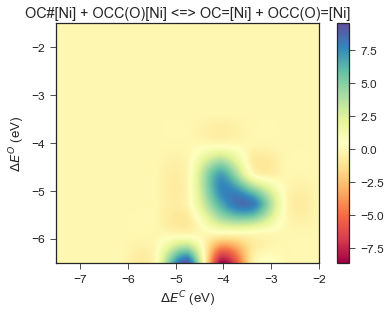

skipping C[Ni] + C=CC(O)=[Ni] <=> C=[Ni] + C=CC(O)[Ni] because it's boring


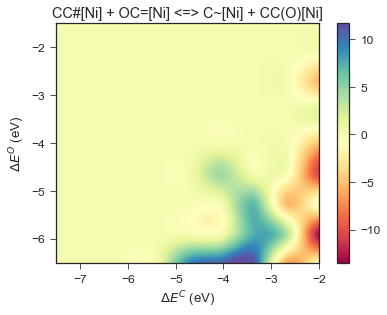

skipping O=COCO + 2 [Ni] <=> O[Ni] + O=COC[Ni] because it's boring


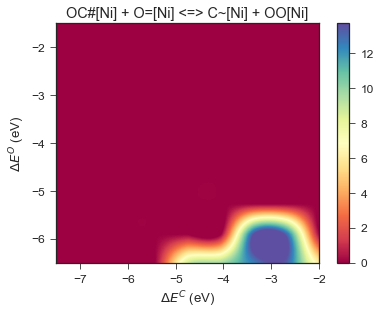

skipping C=[Ni] + C=CC(O)=[Ni] <=> C#[Ni] + C=CC(O)[Ni] because it's boring
skipping OC#[Ni] + C=CC(O)[Ni] <=> OC=[Ni] + C=CC(O)=[Ni] because it's boring
skipping O=COC(O)=[Ni] + [Ni] <=> O=CO[Ni] + OC#[Ni] because it's boring
skipping CCOCO + 2 [Ni] <=> CC[Ni] + OCO[Ni] because it's boring
skipping CC(O)C(O)[Ni] + [Ni] <=> OC=[Ni] + CC(O)[Ni] because it's boring
skipping O=[Ni] + OCOCC(O)[Ni] <=> OC=[Ni] + OCOCO[Ni] because it's boring
skipping OCC=[Ni] + OC(O)[Ni] <=> OC=[Ni] + OCC(O)[Ni] because it's boring


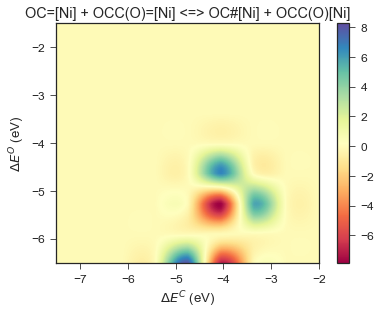

skipping OCCOCO + 2 [Ni] <=> [Ni] + OCOCC(O)[Ni] because it's boring
skipping OCC(O)C(O)[Ni] + [Ni] <=> OC=[Ni] + OCC(O)[Ni] because it's boring
skipping OC=[Ni] + O=COC(O)[Ni] <=> OC(O)[Ni] + O=COC=[Ni] because it's boring
skipping OCC(O)[Ni] + OOC(O)=[Ni] <=> OCC(O)=[Ni] + OOC(O)[Ni] because it's boring
skipping OC#[Ni] + OC(O)=[Ni] <=> C~[Ni] + OC(O)(O)[Ni] because it's boring
skipping CCOCO + 2 [Ni] <=> [Ni] + CC([Ni])OCO because it's boring
skipping CC(O)O + 2 [Ni] <=> [Ni] + OC(O)C[Ni] because it's boring
skipping CCOCO + 2 [Ni] <=> [Ni] + CCOC(O)[Ni] because it's boring
skipping CCOCO + 2 [Ni] <=> C[Ni] + OCOC[Ni] because it's boring
skipping O=[Ni] + OC(O)C(O)[Ni] <=> OC=[Ni] + OC(O)O[Ni] because it's boring
skipping OCOCOC(O)=[Ni] + [Ni] <=> OC#[Ni] + OCOCO[Ni] because it's boring
skipping OCCOCO + 2 [Ni] <=> OC[Ni] + OCOC[Ni] because it's boring
skipping OCCOCO + 2 [Ni] <=> [Ni] + OCOC([Ni])CO because it's boring
skipping O[Ni] + C=CC(O)=[Ni] <=> O=[Ni] + C=CC(O)[Ni] because 

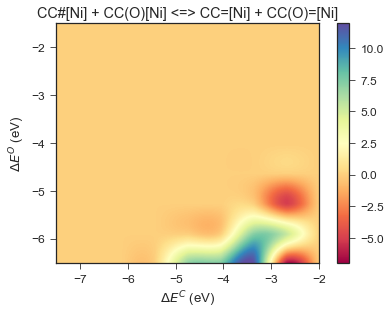

skipping OC#[Ni] + OCC=[Ni] <=> OC=[Ni] + OCC#[Ni] because it's boring
skipping OC(=[Ni])OC(O)O + [Ni] <=> OC#[Ni] + OC(O)O[Ni] because it's boring
skipping CCOCO + 2 [Ni] <=> O[Ni] + CCOC[Ni] because it's boring
skipping CCCO + 2 [Ni] <=> [Ni] + CCC(O)[Ni] because it's boring


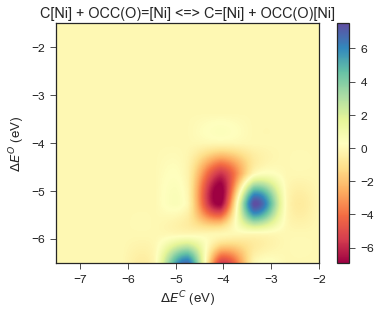

skipping OC=[Ni] + OCC#[Ni] <=> C#[Ni] + OCC(O)=[Ni] because it's boring
skipping OC=[Ni] + OCC#[Ni] <=> C~[Ni] + OCC(O)[Ni] because it's boring
skipping OC(O)C[Ni] + [Ni] <=> C=[Ni] + OC(O)[Ni] because it's boring
skipping O=[Ni] + COCC(O)[Ni] <=> OC=[Ni] + COCO[Ni] because it's boring


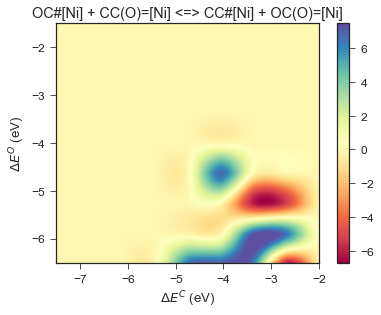

skipping OC=[Ni] + OCOCOC(O)[Ni] <=> OC(O)[Ni] + OCOCOC=[Ni] because it's boring
skipping OC#[Ni] + CC(O)=[Ni] <=> C~[Ni] + CC(O)(O)[Ni] because it's boring


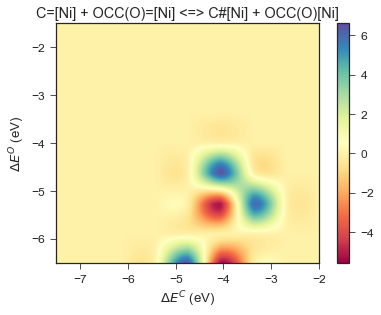

skipping OC=[Ni] + OC(O)OC(O)[Ni] <=> OC(O)[Ni] + OC(O)OC=[Ni] because it's boring
skipping OCCO + 2 [Ni] <=> O[Ni] + OCC[Ni] because it's boring
skipping OC=[Ni] + CCOC(O)[Ni] <=> OC(O)[Ni] + CCOC=[Ni] because it's boring
skipping C#[Ni] + OOC(O)=[Ni] <=> C~[Ni] + OOC(O)[Ni] because it's boring
skipping O=COC=[Ni] + [Ni] <=> O=CO[Ni] + C#[Ni] because it's boring
skipping OC=[Ni] + CC([Ni])OCO <=> OCOC=[Ni] + CC(O)[Ni] because it's boring
skipping OCC(O)OC(O)=[Ni] + [Ni] <=> OC#[Ni] + OCC(O)O[Ni] because it's boring
skipping OC(O)=[Ni] + OCC#[Ni] <=> OC#[Ni] + OCC(O)=[Ni] because it's boring
skipping OC=[Ni] + OCOC([Ni])CO <=> OCOC=[Ni] + OCC(O)[Ni] because it's boring
skipping OOC(O)=[Ni] + C=CC(O)[Ni] <=> OOC(O)[Ni] + C=CC(O)=[Ni] because it's boring
skipping C#[Ni] + OCC[Ni] <=> C=[Ni] + OCC=[Ni] because it's boring
skipping CCCO + 2 [Ni] <=> CC[Ni] + OC[Ni] because it's boring
skipping OCOC=[Ni] + OC(O)(O)[Ni] <=> OC(O)=[Ni] + OCOC(O)[Ni] because it's boring
skipping OC=[Ni] + O=CO

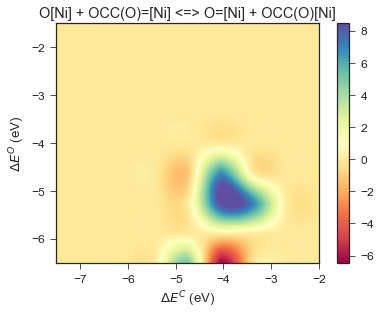

skipping OCOC=[Ni] + OCC(O)(O)[Ni] <=> OCOC(O)[Ni] + OCC(O)=[Ni] because it's boring
skipping OCOC(O)C(O)[Ni] + [Ni] <=> OC=[Ni] + OCOC(O)[Ni] because it's boring
skipping COCOCO + 2 [Ni] <=> [Ni] + OCOCOC[Ni] because it's boring
skipping COCOCO + 2 [Ni] <=> OCO[Ni] + COC[Ni] because it's boring
skipping OOC(O)C(O)[Ni] + [Ni] <=> OC=[Ni] + OOC(O)[Ni] because it's boring
skipping OCOCOCO + 2 [Ni] <=> [Ni] + OCOC([Ni])OCO because it's boring
skipping C#[Ni] + OCC=[Ni] <=> C=[Ni] + OCC#[Ni] because it's boring


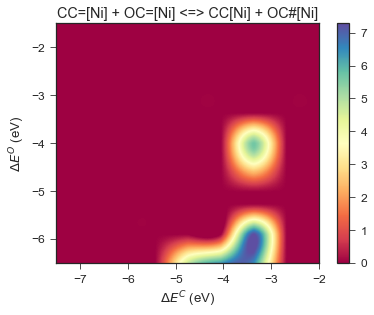

skipping OCOCOC=[Ni] + [Ni] <=> C#[Ni] + OCOCO[Ni] because it's boring
skipping OC=[Ni] + OCOC(O)(O)[Ni] <=> OC(O)[Ni] + OCOC(O)=[Ni] because it's boring
skipping OCOCOCO + 2 [Ni] <=> O[Ni] + OCOCOC[Ni] because it's boring
skipping OCOC[Ni] + OOC(O)=[Ni] <=> OCOC=[Ni] + OOC(O)[Ni] because it's boring
skipping OCOC(O)=[Ni] + OOC(O)[Ni] <=> OCOC(O)[Ni] + OOC(O)=[Ni] because it's boring
skipping OC(O)OC=[Ni] + [Ni] <=> C#[Ni] + OC(O)O[Ni] because it's boring
skipping O=COC[Ni] + [Ni] <=> C=[Ni] + O=CO[Ni] because it's boring
skipping OC(O)=[Ni] + OCOC(O)[Ni] <=> OC(O)[Ni] + OCOC(O)=[Ni] because it's boring
skipping OOC=[Ni] + OC(O)(O)[Ni] <=> OC(O)=[Ni] + OOC(O)[Ni] because it's boring
skipping OCOC(O)CO + 2 [Ni] <=> [Ni] + OCOC(O)C(O)[Ni] because it's boring
skipping OC=[Ni] + OOC=[Ni] <=> OC#[Ni] + OOC[Ni] because it's boring
skipping O=COC(O)[Ni] + [Ni] <=> OC=[Ni] + O=CO[Ni] because it's boring


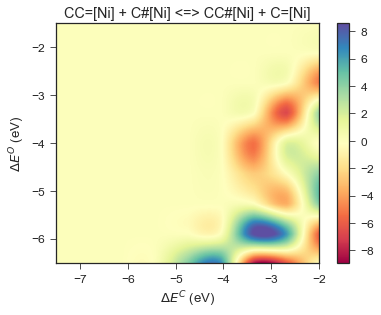

skipping OCOC(O)CO + 2 [Ni] <=> [Ni] + OCC(O)OC(O)[Ni] because it's boring
skipping OC=[Ni] + OCOC(O)(O)[Ni] <=> OC(O)=[Ni] + OCOC(O)[Ni] because it's boring
skipping OOC=[Ni] + OCC(O)(O)[Ni] <=> OCC(O)=[Ni] + OOC(O)[Ni] because it's boring
skipping OC(O)[Ni] + OCOCC(O)=[Ni] <=> OC(O)=[Ni] + OCOCC(O)[Ni] because it's boring
skipping OC=[Ni] + OCOC([Ni])OCO <=> OCOC=[Ni] + OCOC(O)[Ni] because it's boring
skipping OCOC(O)CO + 2 [Ni] <=> OCO[Ni] + OCC(O)[Ni] because it's boring
skipping CC(O)=[Ni] + OOC(O)[Ni] <=> OOC=[Ni] + CC(O)(O)[Ni] because it's boring
skipping OCOC(O)[Ni] + CC(O)=[Ni] <=> OCOC=[Ni] + CC(O)(O)[Ni] because it's boring
skipping OCOC(O)CO + 2 [Ni] <=> O[Ni] + OCOC([Ni])CO because it's boring
skipping O=[Ni] + CC(O)C(O)[Ni] <=> OC=[Ni] + CC(O)O[Ni] because it's boring
skipping OC=[Ni] + OOC(O)=[Ni] <=> OC#[Ni] + OOC(O)[Ni] because it's boring
skipping OC=[Ni] + OCOC(O)=[Ni] <=> OC#[Ni] + OCOC(O)[Ni] because it's boring
skipping OCOCOC[Ni] + [Ni] <=> C=[Ni] + OCOCO[Ni] be

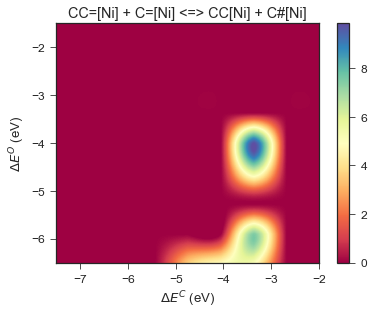

skipping OOC[Ni] + OOC(O)=[Ni] <=> OOC=[Ni] + OOC(O)[Ni] because it's boring
skipping CCOCO + 2 [Ni] <=> [Ni] + OCOCC[Ni] because it's boring
skipping C[Ni] + OOC=[Ni] <=> C=[Ni] + OOC[Ni] because it's boring
skipping OCOCOC(O)[Ni] + [Ni] <=> OC=[Ni] + OCOCO[Ni] because it's boring
skipping OCC=[Ni] + CC(O)[Ni] <=> CC=[Ni] + OCC(O)[Ni] because it's boring
skipping CC(O)=[Ni] + OCOCC(O)[Ni] <=> CC(O)[Ni] + OCOCC(O)=[Ni] because it's boring
skipping OCOC(=[Ni])CO + [Ni] <=> OCO[Ni] + OCC#[Ni] because it's boring
skipping OCOCC(O)[Ni] + [Ni] <=> OC=[Ni] + OCOC[Ni] because it's boring
skipping OC#[Ni] + COC(O)[Ni] <=> OC=[Ni] + COC(O)=[Ni] because it's boring
skipping C=CC(O)[Ni] + [Ni] <=> C=C[Ni] + OC=[Ni] because it's boring
skipping C#[Ni] + O=COC[Ni] <=> C=[Ni] + O=COC=[Ni] because it's boring
skipping OC(O)OC(O)[Ni] + [Ni] <=> OC=[Ni] + OC(O)O[Ni] because it's boring
skipping OCOCC(O)=[Ni] + [Ni] <=> OC#[Ni] + OCOC[Ni] because it's boring


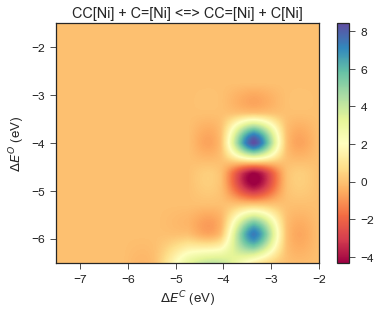

skipping C~[Ni] + OCC(O)=[Ni] <=> OC#[Ni] + OCC#[Ni] because it's boring
skipping OC=[Ni] + OCOO[Ni] <=> O=[Ni] + OCOC(O)[Ni] because it's boring
skipping O=[Ni] + OCC(O)C(O)[Ni] <=> OC=[Ni] + OCC(O)O[Ni] because it's boring
skipping C=[Ni] + OOC=[Ni] <=> C#[Ni] + OOC[Ni] because it's boring
skipping C=[Ni] + OCOC(O)(O)[Ni] <=> OCOC[Ni] + OC(O)=[Ni] because it's boring
skipping C#[Ni] + OCOC(O)C(O)=[Ni] <=> C~[Ni] + OCOC(O)C(O)[Ni] because it's boring
skipping C[Ni] + OCOC(O)=[Ni] <=> C=[Ni] + OCOC(O)[Ni] because it's boring
skipping OCC#[Ni] + CC(=[Ni])OCO <=> CC#[Ni] + OCOC(=[Ni])CO because it's boring
skipping OC=[Ni] + OCOCC(O)=[Ni] <=> OC#[Ni] + OCOCC(O)[Ni] because it's boring
skipping OCCOC(O)=[Ni] + OC(O)OC(O)[Ni] <=> OCCOC(O)[Ni] + OC(=[Ni])OC(O)O because it's boring
skipping O=COC(O)[Ni] + OC(O)OC=[Ni] <=> O=COC=[Ni] + OC(O)OC(O)[Ni] because it's boring
skipping CC[Ni] + OCC(O)=[Ni] <=> C=[Ni] + CC(O)([Ni])CO because it's boring
skipping OCC[Ni] + O=COC=[Ni] <=> OCC=[Ni] + O=

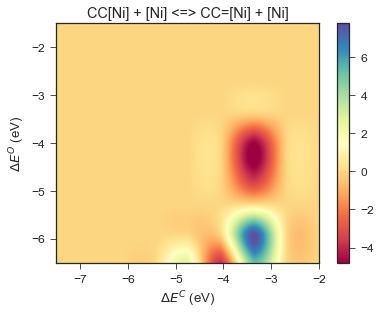

skipping OCOC=[Ni] + CC(O)(O)[Ni] <=> OC(O)=[Ni] + CC([Ni])OCO because it's boring
skipping OC(O)(O)[Ni] + OCOCOC=[Ni] <=> OC(O)=[Ni] + OCOCOC(O)[Ni] because it's boring
skipping C=C[Ni] + [Ni] <=> C=C=[Ni] + [Ni] because it's boring
skipping OCC(O)OC(O)=[Ni] + OCOC[Ni] <=> OCC(O)OC(O)[Ni] + OCOC=[Ni] because it's boring
skipping CC(O)=[Ni] + COC=[Ni] <=> CC#[Ni] + COC(O)[Ni] because it's boring
skipping CC(O)C(O)=[Ni] + COC(O)[Ni] <=> CC(O)C(O)[Ni] + COC(O)=[Ni] because it's boring
skipping OCOC(O)(O)[Ni] + [Ni] <=> O[Ni] + OCOC(O)=[Ni] because it's boring


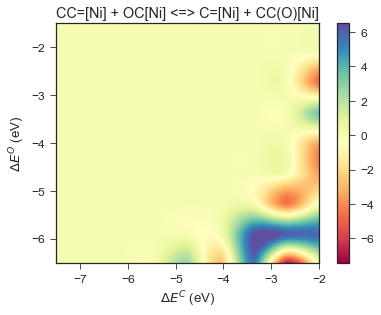

skipping OCOC(O)CO + [Ni] <=> OCOC(O)CO.[Ni] because it's boring
skipping OOC[Ni] + OOC(O)C(O)=[Ni] <=> OOC=[Ni] + OOC(O)C(O)[Ni] because it's boring
skipping OC[Ni] + CCC(O)=[Ni] <=> OC=[Ni] + CCC(O)[Ni] because it's boring
skipping OCOCOC(O)[Ni] + OC(O)OC=[Ni] <=> OCOCOC=[Ni] + OC(O)OC(O)[Ni] because it's boring
skipping CC(O)=[Ni] + CC([Ni])OCO <=> CC(O)[Ni] + CC(=[Ni])OCO because it's boring
skipping CC=[Ni] + CC[Ni] <=> CC(C)[Ni] + C=[Ni] because it's boring
skipping O=[Ni] + CCOCC(O)[Ni] <=> OC=[Ni] + CCOCO[Ni] because it's boring
skipping O[Ni] + OCOC(=[Ni])CO <=> O=[Ni] + OCOC([Ni])CO because it's boring
skipping OCC#[Ni] + OCOC([Ni])CO <=> OCC=[Ni] + OCOC(=[Ni])CO because it's boring
skipping CCC(O)=[Ni] + O=COC[Ni] <=> CCC(O)[Ni] + O=COC=[Ni] because it's boring
skipping CC=[Ni] + OCC(O)(O)[Ni] <=> CC(O)[Ni] + OCC(O)=[Ni] because it's boring
skipping OC(O)=[Ni] + OCOCOC=[Ni] <=> OC#[Ni] + OCOCOC(O)[Ni] because it's boring
skipping COC=[Ni] + OCC(O)(O)[Ni] <=> OCC(O)=[Ni] + CO

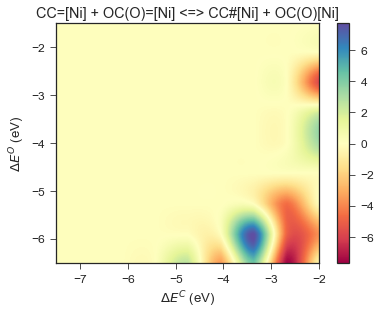

skipping C=[Ni] + OCOC(O)=[Ni] <=> OC#[Ni] + OCOC[Ni] because it's boring
skipping O=COC[Ni] + OOC(O)C(O)=[Ni] <=> O=COC=[Ni] + OOC(O)C(O)[Ni] because it's boring
skipping C[Ni] + OC(=[Ni])C(O)O <=> C=[Ni] + OC(O)C(O)[Ni] because it's boring
skipping OCC=[Ni] + OCOC[Ni] <=> C=[Ni] + OCOC([Ni])CO because it's boring
skipping CC=[Ni] + CC(O)(O)[Ni] <=> CC(O)[Ni] + CC(O)=[Ni] because it's boring
skipping OCC=[Ni] + OCOO[Ni] <=> O=[Ni] + OCOC([Ni])CO because it's boring
skipping OCC=[Ni] + COC(O)[Ni] <=> OCC(O)[Ni] + COC=[Ni] because it's boring
skipping OC#[Ni] + OOC(O)C(O)[Ni] <=> OC=[Ni] + OOC(O)C(O)=[Ni] because it's boring
skipping OC=[Ni] + OCCOC(O)=[Ni] <=> OC#[Ni] + OCCOC(O)[Ni] because it's boring
skipping OCC[Ni] + OC(O)=[Ni] <=> OCC=[Ni] + OC(O)[Ni] because it's boring
skipping C=C=[Ni] + COCC(O)[Ni] <=> C=C[Ni] + COCC(O)=[Ni] because it's boring
skipping OCC=[Ni] + OCOC(O)=[Ni] <=> OCOC(O)[Ni] + OCC#[Ni] because it's boring
skipping COCC(O)=[Ni] + OCC(O)[Ni] <=> COCC(O)[Ni] + O

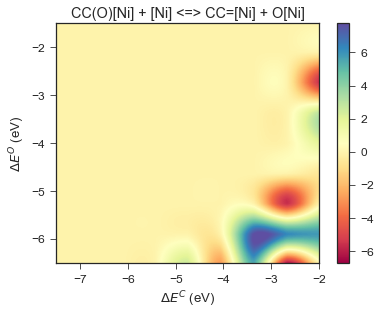

skipping OCOC([Ni])OCO + CCOCC(O)=[Ni] <=> OCOC(=[Ni])OCO + CCOCC(O)[Ni] because it's boring
skipping O=[Ni] + OCOC(O)=[Ni] <=> OC#[Ni] + OCOO[Ni] because it's boring
skipping C[Ni] + CCOCC(O)=[Ni] <=> C=[Ni] + CCOCC(O)[Ni] because it's boring
skipping CC[Ni] + OCCOC(O)=[Ni] <=> CC=[Ni] + OCCOC(O)[Ni] because it's boring
skipping COC(O)[Ni] + CCOCC(O)=[Ni] <=> COC(O)=[Ni] + CCOCC(O)[Ni] because it's boring
skipping OC=[Ni] + OCC(O)C(O)=[Ni] <=> OC#[Ni] + OCC(O)C(O)[Ni] because it's boring
skipping OCOC(O)C(O)=[Ni] + OCOC([Ni])CO <=> OCOC(=[Ni])CO + OCOC(O)C(O)[Ni] because it's boring
skipping CC#[Ni] + OCOC=[Ni] <=> C~[Ni] + CC([Ni])OCO because it's boring
skipping OCOC(O)[Ni] + CC(=[Ni])OCO <=> OCOC(O)=[Ni] + CC([Ni])OCO because it's boring
skipping CC=[Ni] + CC(O)C(O)=[Ni] <=> CC#[Ni] + CC(O)C(O)[Ni] because it's boring
skipping OCC#[Ni] + [Ni] <=> OC[Ni] + C~[Ni] because it's boring
skipping OCC(O)[Ni] + CCOC(O)=[Ni] <=> OCC(O)=[Ni] + CCOC(O)[Ni] because it's boring
skipping OCOC(O)

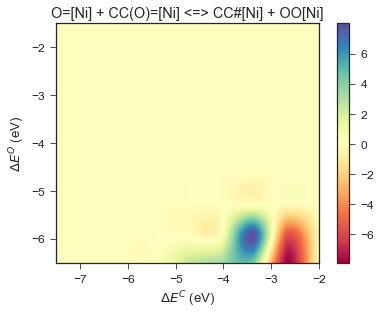

skipping CC=[Ni] + OCC=[Ni] <=> CC#[Ni] + OCC[Ni] because it's boring
skipping OCC(O)=[Ni] + OCOC([Ni])CO <=> OCOC=[Ni] + OCC(O)([Ni])CO because it's boring
skipping OC=[Ni] + CCOC[Ni] <=> C=[Ni] + CCOC(O)[Ni] because it's boring
skipping C#[Ni] + OC(=[Ni])OC(O)O <=> C~[Ni] + OC(O)OC(O)[Ni] because it's boring
skipping O=COC[Ni] + OCOCOC(O)=[Ni] <=> O=COC=[Ni] + OCOCOC(O)[Ni] because it's boring
skipping OCOC([Ni])CO + [Ni] <=> OC[Ni] + OCOC=[Ni] because it's boring
skipping C~[Ni] + OCC[Ni] <=> C=[Ni] + OCC#[Ni] because it's boring
skipping OCOCC(O)=[Ni] + OC(O)OC(O)[Ni] <=> OCOCC(O)[Ni] + OC(=[Ni])OC(O)O because it's boring
skipping C=C=[Ni] + OCC(O)C(O)[Ni] <=> C=C[Ni] + OCC(O)C(O)=[Ni] because it's boring
skipping OCOCOC(O)=[Ni] + OC(O)OC[Ni] <=> OCOCOC(O)[Ni] + OC(O)OC=[Ni] because it's boring
skipping O=C[Ni] + COC(O)=[Ni] <=> O=C=[Ni] + COC(O)[Ni] because it's boring
skipping CC[Ni] + CCC(O)=[Ni] <=> CC=[Ni] + CCC(O)[Ni] because it's boring
skipping C#[Ni] + CC(=[Ni])OCO <=> C~[

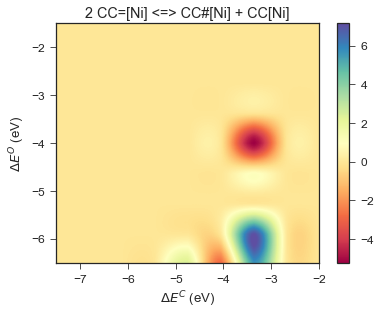

skipping CC(O)C(O)=[Ni] + OC(O)OC[Ni] <=> CC(O)C(O)[Ni] + OC(O)OC=[Ni] because it's boring
skipping COC=[Ni] + COC(O)[Ni] <=> COC[Ni] + COC(O)=[Ni] because it's boring
skipping OCC[Ni] + CC(O)=[Ni] <=> C=[Ni] + CC(O)([Ni])CO because it's boring
skipping CC(O)=[Ni] + OCC(O)=[Ni] <=> OCC#[Ni] + CC(O)(O)[Ni] because it's boring
skipping OCC=[Ni] + CC(O)(O)[Ni] <=> OCC(O)[Ni] + CC(O)=[Ni] because it's boring
skipping C=[Ni] + O=COC(O)=[Ni] <=> OC#[Ni] + O=COC[Ni] because it's boring
skipping OC=[Ni] + CC(O)C(O)=[Ni] <=> OC#[Ni] + CC(O)C(O)[Ni] because it's boring
skipping OCOC([Ni])CO + CCOCC(O)=[Ni] <=> OCOC(=[Ni])CO + CCOCC(O)[Ni] because it's boring
skipping CC(O)C(O)=[Ni] + CC([Ni])OCO <=> CC(O)C(O)[Ni] + CC(=[Ni])OCO because it's boring
skipping OO[Ni] + CCOC=[Ni] <=> O=[Ni] + CCOC(O)[Ni] because it's boring
skipping O[Ni] + OCOC(=[Ni])OCO <=> O=[Ni] + OCOC([Ni])OCO because it's boring
skipping OCC[Ni] + COC(O)=[Ni] <=> OCC=[Ni] + COC(O)[Ni] because it's boring
skipping CCC(O)=[Ni] + 

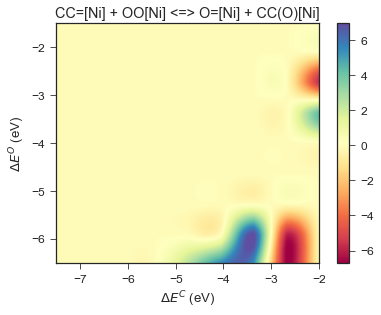

skipping OC#[Ni] + OCC=[Ni] <=> C#[Ni] + OCC(O)=[Ni] because it's boring
skipping C=[Ni] + OCC(O)=[Ni] <=> OC[Ni] + OCC#[Ni] because it's boring
skipping C=C=[Ni] + OCC(O)OC(O)[Ni] <=> C=C[Ni] + OCC(O)OC(O)=[Ni] because it's boring
skipping OCC(O)(O)[Ni] + [Ni] <=> OC[Ni] + OC(O)=[Ni] because it's boring
skipping O=COC[Ni] + OCOC(=[Ni])OCO <=> O=COC=[Ni] + OCOC([Ni])OCO because it's boring
skipping O[Ni] + COCC(O)=[Ni] <=> O=[Ni] + COCC(O)[Ni] because it's boring
skipping CC=[Ni] + OCOCOC(O)=[Ni] <=> CC#[Ni] + OCOCOC(O)[Ni] because it's boring
skipping OC#[Ni] + CCOCC(O)[Ni] <=> OC=[Ni] + CCOCC(O)=[Ni] because it's boring
skipping O=COC(O)[Ni] + OCOCC(O)=[Ni] <=> O=COC(O)=[Ni] + OCOCC(O)[Ni] because it's boring
skipping OCOC(O)(O)[Ni] + OC(O)OC=[Ni] <=> OCOC(O)=[Ni] + OC(O)OC(O)[Ni] because it's boring
skipping OCOCC(O)=[Ni] + CC([Ni])OCO <=> OCOCC(O)[Ni] + CC(=[Ni])OCO because it's boring
skipping OC[Ni] + OCOC(=[Ni])OCO <=> OC=[Ni] + OCOC([Ni])OCO because it's boring
skipping O=C(O)[

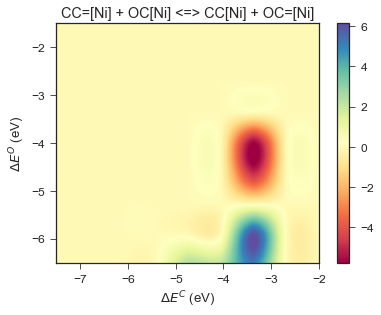

skipping OC=[Ni] + CC(O)=[Ni] <=> C#[Ni] + CC(O)(O)[Ni] because it's boring
skipping OCC(O)OC(O)[Ni] + OC(=[Ni])C(O)O <=> OCC(O)OC(O)=[Ni] + OC(O)C(O)[Ni] because it's boring
skipping OCOC(O)[Ni] + CC(O)=[Ni] <=> CC(O)[Ni] + OCOC(O)=[Ni] because it's boring
skipping OCC=[Ni] + CC(=[Ni])OCO <=> OCC#[Ni] + CC([Ni])OCO because it's boring
skipping CC(O)C(O)=[Ni] + OCOC(O)C(O)[Ni] <=> CC(O)C(O)[Ni] + OCOC(O)C(O)=[Ni] because it's boring
skipping OC#[Ni] + OCOC(O)=[Ni] <=> C~[Ni] + OCOC(O)(O)[Ni] because it's boring
skipping C#[Ni] + O=COC(O)=[Ni] <=> OC#[Ni] + O=COC=[Ni] because it's boring
skipping COCC(O)=[Ni] + OOC(O)[Ni] <=> COCC(O)[Ni] + OOC(O)=[Ni] because it's boring
skipping OCOC(=[Ni])OCO + CCOC[Ni] <=> OCOC([Ni])OCO + CCOC=[Ni] because it's boring
skipping CC(O)=[Ni] + OCC(O)=[Ni] <=> CC#[Ni] + OCC(O)(O)[Ni] because it's boring
skipping CC(O)=[Ni] + OCOCOC=[Ni] <=> CC#[Ni] + OCOCOC(O)[Ni] because it's boring
skipping OCOC(O)[Ni] + OCOC(=[Ni])CO <=> OCOC(O)=[Ni] + OCOC([Ni])CO bec

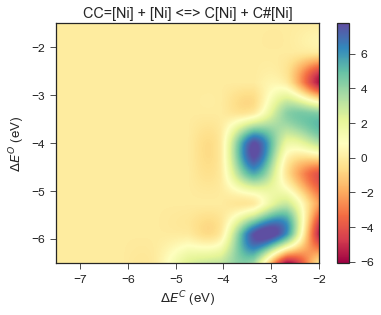

skipping COC=[Ni] + OC(O)OC[Ni] <=> COC[Ni] + OC(O)OC=[Ni] because it's boring
skipping O=COC(O)C(O)=[Ni] + [Ni] <=> OC#[Ni] + O=COC(O)[Ni] because it's boring
skipping OCCOC(O)[Ni] + CCOCC(O)=[Ni] <=> OCCOC(O)=[Ni] + CCOCC(O)[Ni] because it's boring


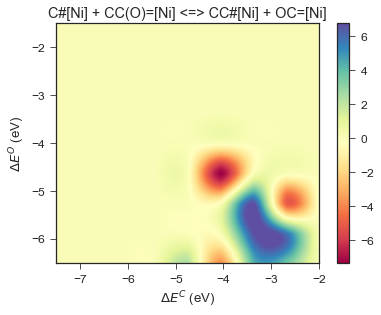

skipping CCC(O)=[Ni] + O=COC(O)[Ni] <=> CCC(O)[Ni] + O=COC(O)=[Ni] because it's boring
skipping OC[Ni] + COC=[Ni] <=> C=[Ni] + COC(O)[Ni] because it's boring
skipping OCOC(=[Ni])OCO + OCOCOC[Ni] <=> OCOC([Ni])OCO + OCOCOC=[Ni] because it's boring
skipping OC[Ni] + OCOC(O)C(O)=[Ni] <=> OC=[Ni] + OCOC(O)C(O)[Ni] because it's boring
skipping OCC(O)OC(O)[Ni] + OCOCOC(O)=[Ni] <=> OCC(O)OC(O)=[Ni] + OCOCOC(O)[Ni] because it's boring
skipping C=[Ni] + OOC(O)=[Ni] <=> OC#[Ni] + OOC[Ni] because it's boring


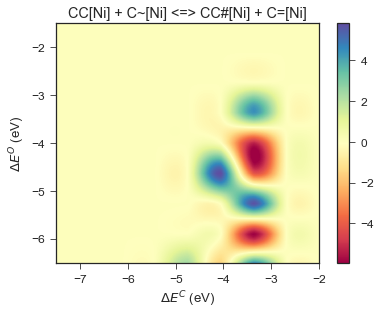

skipping OCC(O)C(O)=[Ni] + OC(O)OC[Ni] <=> OCC(O)C(O)[Ni] + OC(O)OC=[Ni] because it's boring
skipping O=C[Ni] + CC(O)C(O)=[Ni] <=> O=C=[Ni] + CC(O)C(O)[Ni] because it's boring
skipping CC[Ni] + OCOCC(O)=[Ni] <=> CC=[Ni] + OCOCC(O)[Ni] because it's boring
skipping C[Ni] + OOC(O)=[Ni] <=> C=[Ni] + OOC(O)[Ni] because it's boring
skipping COCC(O)=[Ni] + OCCOC(O)[Ni] <=> COCC(O)[Ni] + OCCOC(O)=[Ni] because it's boring
skipping OCOC(O)=[Ni] + OCOCOC(O)[Ni] <=> OCOC(O)[Ni] + OCOCOC(O)=[Ni] because it's boring
skipping O=[Ni] + OCOC([Ni])CO <=> OCO[Ni] + OCOC=[Ni] because it's boring
skipping OCOCC(O)=[Ni] + CCOC(O)[Ni] <=> OCOCC(O)[Ni] + CCOC(O)=[Ni] because it's boring
skipping OCC[Ni] + CC(=[Ni])OCO <=> OCC=[Ni] + CC([Ni])OCO because it's boring
skipping OCC(O)C(O)=[Ni] + OOC(O)[Ni] <=> OCC(O)C(O)[Ni] + OOC(O)=[Ni] because it's boring
skipping C=CC(O)[Ni] + O=COC(O)=[Ni] <=> C=CC(O)=[Ni] + O=COC(O)[Ni] because it's boring
skipping OCC(O)=[Ni] + [Ni] <=> O[Ni] + OCC#[Ni] because it's boring


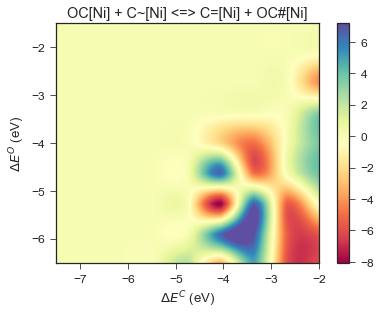

skipping C#[Ni] + OCOCOC[Ni] <=> C=[Ni] + OCOCOC=[Ni] because it's boring


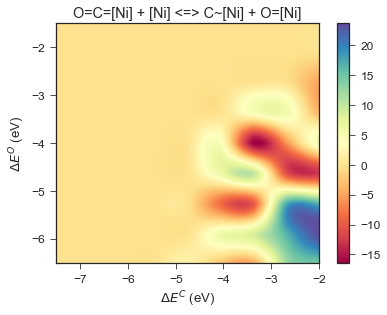

skipping O=COC(O)[Ni] + [Ni] <=> O[Ni] + O=COC=[Ni] because it's boring
skipping OC[Ni] + OC(O)OC=[Ni] <=> OC=[Ni] + OC(O)OC[Ni] because it's boring
skipping OCOC=[Ni] + OC(O)=[Ni] <=> OC#[Ni] + OCOC(O)[Ni] because it's boring
skipping OCC[Ni] + OCC(O)=[Ni] <=> C=[Ni] + OCC(O)([Ni])CO because it's boring
skipping COCC(O)=[Ni] + CC([Ni])OCO <=> COCC(O)[Ni] + CC(=[Ni])OCO because it's boring
skipping OCOC(O)C(O)=[Ni] + OC(O)OC[Ni] <=> OCOC(O)C(O)[Ni] + OC(O)OC=[Ni] because it's boring
skipping OCOC(=[Ni])CO + COC[Ni] <=> COC=[Ni] + OCOC([Ni])CO because it's boring
skipping OOC(O)[Ni] + [Ni] <=> O[Ni] + OOC=[Ni] because it's boring
skipping C=CC(O)[Ni] + OCOCOC=[Ni] <=> C=CC(O)=[Ni] + OCOCOC[Ni] because it's boring
skipping OCC(O)[Ni] + OCOCOC=[Ni] <=> OCC(O)=[Ni] + OCOCOC[Ni] because it's boring
skipping OC(O)OC[Ni] + OC(=[Ni])OC(O)O <=> OC(O)OC=[Ni] + OC(O)OC(O)[Ni] because it's boring
skipping COC(O)[Ni] + [Ni] <=> OC=[Ni] + CO[Ni] because it's boring
skipping C#[Ni] + COCC(O)=[Ni] <=>

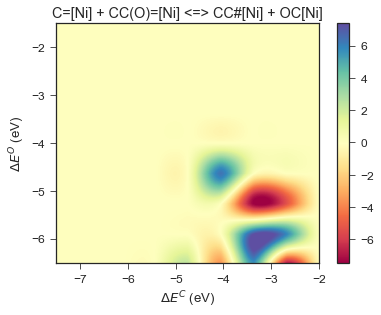

skipping CCC(O)=[Ni] + CC(O)C(O)[Ni] <=> CCC(O)[Ni] + CC(O)C(O)=[Ni] because it's boring
skipping CC([Ni])CO + [Ni] <=> CC=[Ni] + OC[Ni] because it's boring
skipping OCC=[Ni] + OCOCOC(O)=[Ni] <=> OCC#[Ni] + OCOCOC(O)[Ni] because it's boring
skipping COC(O)=[Ni] + OCOCOC[Ni] <=> COC(O)[Ni] + OCOCOC=[Ni] because it's boring
skipping OCC=[Ni] + CCC(O)=[Ni] <=> CCC(O)[Ni] + OCC#[Ni] because it's boring
skipping OC=[Ni] + OCC=[Ni] <=> C#[Ni] + OCC(O)[Ni] because it's boring
skipping OOC(O)C(O)=[Ni] + CCOC[Ni] <=> OOC(O)C(O)[Ni] + CCOC=[Ni] because it's boring
skipping OCC[Ni] + OOC(O)C(O)=[Ni] <=> OCC=[Ni] + OOC(O)C(O)[Ni] because it's boring
skipping OCC[Ni] + OC(=[Ni])OC(O)O <=> OCC=[Ni] + OC(O)OC(O)[Ni] because it's boring
skipping CC=[Ni] + OC(=[Ni])C(O)O <=> CC#[Ni] + OC(O)C(O)[Ni] because it's boring
skipping OC(O)=[Ni] + OC(O)OC(O)[Ni] <=> OC(O)[Ni] + OC(=[Ni])OC(O)O because it's boring
skipping CC(C)[Ni] + OCOC=[Ni] <=> CC=[Ni] + CC([Ni])OCO because it's boring
skipping OOC(O)=[Ni] 

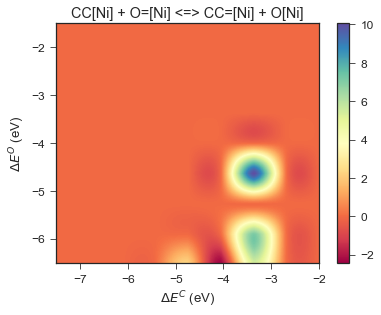

skipping C=C=[Ni] + O=COC(O)[Ni] <=> C=C[Ni] + O=COC(O)=[Ni] because it's boring
skipping CC=[Ni] + OC(=[Ni])OC(O)O <=> CC#[Ni] + OC(O)OC(O)[Ni] because it's boring
skipping OCC=[Ni] + OCOC(O)C(O)=[Ni] <=> OCC#[Ni] + OCOC(O)C(O)[Ni] because it's boring
skipping OCC(O)OC(O)[Ni] + O=COC(O)=[Ni] <=> OCC(O)OC(O)=[Ni] + O=COC(O)[Ni] because it's boring
skipping C#[Ni] + OCOC(=[Ni])CO <=> C~[Ni] + OCOC([Ni])CO because it's boring
skipping OC(O)(O)[Ni] + CCOC=[Ni] <=> OC(O)=[Ni] + CCOC(O)[Ni] because it's boring
skipping OC#[Ni] + OCC(O)OC(O)[Ni] <=> OC=[Ni] + OCC(O)OC(O)=[Ni] because it's boring
skipping CC=[Ni] + COC(O)=[Ni] <=> CC#[Ni] + COC(O)[Ni] because it's boring
skipping O=COC(O)=[Ni] + OCOC([Ni])OCO <=> O=COC(O)[Ni] + OCOC(=[Ni])OCO because it's boring
skipping COC=[Ni] + C=CC(O)[Ni] <=> COC[Ni] + C=CC(O)=[Ni] because it's boring
skipping OCOC=[Ni] + CC([Ni])CO <=> OCC=[Ni] + CC([Ni])OCO because it's boring
skipping OC(O)=[Ni] + OC(O)OC=[Ni] <=> OC#[Ni] + OC(O)OC(O)[Ni] because it's

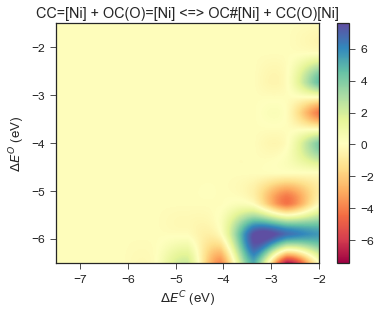

skipping OCOC(O)C(O)[Ni] + OCOCC(O)=[Ni] <=> OCOC(O)C(O)=[Ni] + OCOCC(O)[Ni] because it's boring
skipping C=[Ni] + O=COC=[Ni] <=> C#[Ni] + O=COC[Ni] because it's boring
skipping CC[Ni] + C=CC(O)=[Ni] <=> CC=[Ni] + C=CC(O)[Ni] because it's boring
skipping O=COC=[Ni] + OC(O)(O)[Ni] <=> OC(O)=[Ni] + O=COC(O)[Ni] because it's boring
skipping C=C=[Ni] + OCOCC(O)[Ni] <=> C=C[Ni] + OCOCC(O)=[Ni] because it's boring
skipping OC=[Ni] + OOC=[Ni] <=> C#[Ni] + OOC(O)[Ni] because it's boring
skipping OC(O)C(O)[Ni] + CCC(O)=[Ni] <=> OC(=[Ni])C(O)O + CCC(O)[Ni] because it's boring
skipping OCC(O)=[Ni] + OCOC(O)(O)[Ni] <=> OCOC(O)=[Ni] + OCC(O)(O)[Ni] because it's boring
skipping OC=[Ni] + CC(=[Ni])OCO <=> CC#[Ni] + OCOC(O)[Ni] because it's boring
skipping OC(=[Ni])C(O)O + OCOCOC[Ni] <=> OC(O)C(O)[Ni] + OCOCOC=[Ni] because it's boring
skipping OC#[Ni] + OCOCC(O)[Ni] <=> OC=[Ni] + OCOCC(O)=[Ni] because it's boring
skipping OCC=[Ni] + [Ni] <=> OC[Ni] + C#[Ni] because it's boring
skipping C=C=[Ni] + OCCO

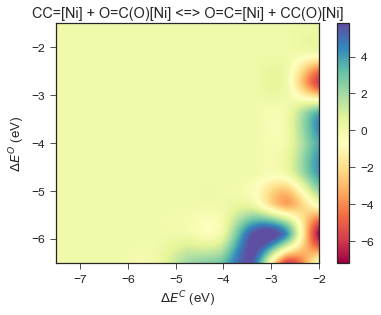

skipping OC#[Ni] + OC(O)C[Ni] <=> C=[Ni] + OC(=[Ni])C(O)O because it's boring
skipping OCC(O)=[Ni] + O=COC=[Ni] <=> O=COC(O)[Ni] + OCC#[Ni] because it's boring
skipping OC(O)OC(O)[Ni] + CCOC=[Ni] <=> OC(O)OC=[Ni] + CCOC(O)[Ni] because it's boring
skipping CC(O)C(O)=[Ni] + OC(O)OC(O)[Ni] <=> CC(O)C(O)[Ni] + OC(=[Ni])OC(O)O because it's boring
skipping OOC=[Ni] + OCOC(O)(O)[Ni] <=> OCOC(O)=[Ni] + OOC(O)[Ni] because it's boring
skipping OC(=[Ni])C(O)O + OCCOC(O)[Ni] <=> OC(O)C(O)[Ni] + OCCOC(O)=[Ni] because it's boring
skipping OCC(O)C(O)=[Ni] + OCOC([Ni])OCO <=> OCC(O)C(O)[Ni] + OCOC(=[Ni])OCO because it's boring
skipping CC=[Ni] + OC(O)OC(O)[Ni] <=> CC(O)[Ni] + OC(O)OC=[Ni] because it's boring
skipping OC[Ni] + CCOC=[Ni] <=> C=[Ni] + CCOC(O)[Ni] because it's boring
skipping OCC(O)C(O)[Ni] + CCOCC(O)=[Ni] <=> OCC(O)C(O)=[Ni] + CCOCC(O)[Ni] because it's boring
skipping OCCOC(O)[Ni] + O=COC(O)=[Ni] <=> O=COC(O)[Ni] + OCCOC(O)=[Ni] because it's boring
skipping CCOC[Ni] + CC(=[Ni])OCO <=> CC

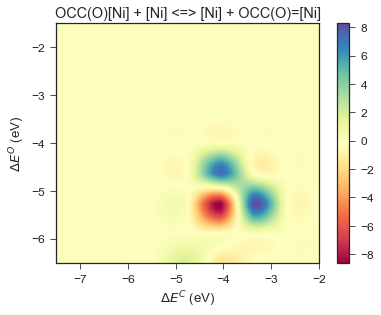

skipping OC[Ni] + OC(=[Ni])OC(O)O <=> OC=[Ni] + OC(O)OC(O)[Ni] because it's boring
skipping OCC=[Ni] + OC(O)(O)[Ni] <=> OC(O)=[Ni] + OCC(O)[Ni] because it's boring
skipping OCOC[Ni] + OCOCC(O)=[Ni] <=> OCOC=[Ni] + OCOCC(O)[Ni] because it's boring
skipping C=[Ni] + COC(O)=[Ni] <=> OC#[Ni] + COC[Ni] because it's boring
skipping OC=[Ni] + O=C([Ni])C(O)O <=> O=C=[Ni] + OC(O)C(O)[Ni] because it's boring
skipping OCCOC(O)[Ni] + CC(=[Ni])OCO <=> OCCOC(O)=[Ni] + CC([Ni])OCO because it's boring
skipping C=CC(O)[Ni] + OC(O)OC=[Ni] <=> C=CC(O)=[Ni] + OC(O)OC[Ni] because it's boring
skipping C#[Ni] + OCOCC(O)=[Ni] <=> C~[Ni] + OCOCC(O)[Ni] because it's boring
skipping COCC(O)=[Ni] + OCOC(O)C(O)[Ni] <=> COCC(O)[Ni] + OCOC(O)C(O)=[Ni] because it's boring
skipping OC#[Ni] + COCC(O)[Ni] <=> OC=[Ni] + COCC(O)=[Ni] because it's boring
skipping CCCO + 2 [Ni] <=> [Ni] + CC([Ni])CO because it's boring
skipping CC(O)C(O)=[Ni] + C=CC(O)[Ni] <=> CC(O)C(O)[Ni] + C=CC(O)=[Ni] because it's boring
skipping O[Ni] 

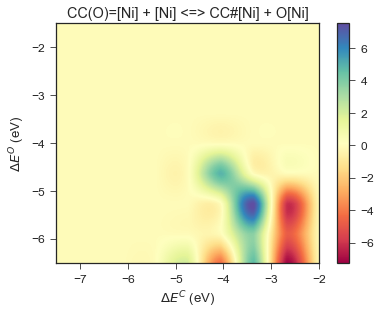

skipping OCC=[Ni] + OCOC(=[Ni])CO <=> OCC#[Ni] + OCOC([Ni])CO because it's boring
skipping OC=[Ni] + COC(O)=[Ni] <=> OC#[Ni] + COC(O)[Ni] because it's boring
skipping CC(O)[Ni] + CCC(O)=[Ni] <=> CC(O)=[Ni] + CCC(O)[Ni] because it's boring
skipping OCC(O)OC(O)[Ni] + OCC(O)C(O)=[Ni] <=> OCC(O)OC(O)=[Ni] + OCC(O)C(O)[Ni] because it's boring
skipping CCC(O)=[Ni] + COC(O)[Ni] <=> CCC(O)[Ni] + COC(O)=[Ni] because it's boring


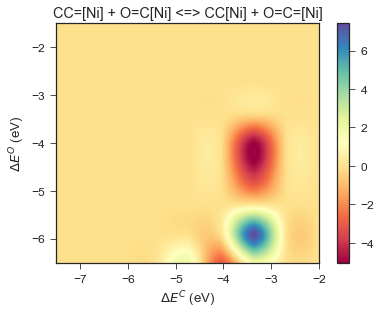

skipping OC#[Ni] + O=COC=[Ni] <=> C~[Ni] + O=COC(O)[Ni] because it's boring
skipping OC[Ni] + OOC=[Ni] <=> OC=[Ni] + OOC[Ni] because it's boring
skipping OC[Ni] + OCOC(O)=[Ni] <=> C=[Ni] + OCOC(O)(O)[Ni] because it's boring
skipping OCC(O)[Ni] + O=COC(O)=[Ni] <=> OCC(O)=[Ni] + O=COC(O)[Ni] because it's boring


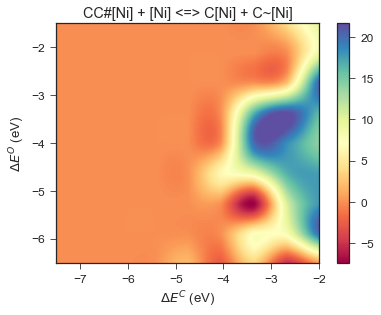

skipping OC(O)OC(O)[Ni] + CCOC(O)=[Ni] <=> OC(=[Ni])OC(O)O + CCOC(O)[Ni] because it's boring
skipping O=C[Ni] + OC(O)OC=[Ni] <=> O=C=[Ni] + OC(O)OC[Ni] because it's boring
skipping O=C(O)[Ni] + CCOC=[Ni] <=> O=C=[Ni] + CCOC(O)[Ni] because it's boring
skipping OC(O)OC[Ni] + CCOC(O)=[Ni] <=> OC(O)OC=[Ni] + CCOC(O)[Ni] because it's boring
skipping CC(O)=[Ni] + COC(O)[Ni] <=> CC(O)[Ni] + COC(O)=[Ni] because it's boring
skipping CCC(O)=[Ni] + OCOCOC(O)[Ni] <=> CCC(O)[Ni] + OCOCOC(O)=[Ni] because it's boring
skipping OCC[Ni] + O=COC(O)=[Ni] <=> OCC=[Ni] + O=COC(O)[Ni] because it's boring
skipping COC[Ni] + OC(=[Ni])OC(O)O <=> COC=[Ni] + OC(O)OC(O)[Ni] because it's boring
skipping CC[Ni] + OCOC=[Ni] <=> CC=[Ni] + OCOC[Ni] because it's boring
skipping CCC(O)=[Ni] + OC(O)OC[Ni] <=> CCC(O)[Ni] + OC(O)OC=[Ni] because it's boring
skipping OC[Ni] + OCOC(=[Ni])CO <=> OC=[Ni] + OCOC([Ni])CO because it's boring
skipping OCOC([Ni])OCO + [Ni] <=> [Ni] + OCOC(=[Ni])OCO because it's boring
skipping CC=[Ni

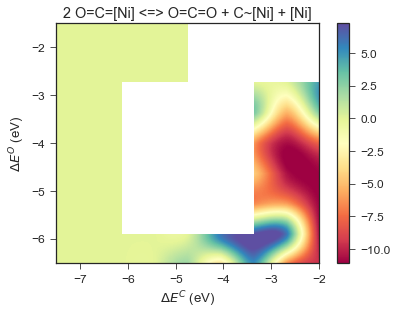

skipping OCC[Ni] + COC=[Ni] <=> OCC=[Ni] + COC[Ni] because it's boring
skipping OOC(O)[Ni] + OCOC(O)C(O)=[Ni] <=> OOC(O)=[Ni] + OCOC(O)C(O)[Ni] because it's boring
skipping O=C(O)[Ni] + O=COC=[Ni] <=> O=C=[Ni] + O=COC(O)[Ni] because it's boring
skipping OCCOC(O)=[Ni] + CCOC[Ni] <=> OCCOC(O)[Ni] + CCOC=[Ni] because it's boring
skipping OCC(O)=[Ni] + CC([Ni])OCO <=> OCOC=[Ni] + CC(O)([Ni])CO because it's boring
skipping COC(O)[Ni] + OCOCOC(O)=[Ni] <=> COC(O)=[Ni] + OCOCOC(O)[Ni] because it's boring
skipping O=COCO + [Ni] <=> O=COCO.[Ni] because it's boring
skipping OOC(O)=[Ni] + OCOCOC[Ni] <=> OOC(O)[Ni] + OCOCOC=[Ni] because it's boring
skipping O=[Ni] + OCOCC(O)=[Ni] <=> OC#[Ni] + OCOCO[Ni] because it's boring
skipping OCC=[Ni] + OOC(O)[Ni] <=> OCC(O)[Ni] + OOC=[Ni] because it's boring
skipping O=C[Ni] + OCC(O)OC(O)=[Ni] <=> O=C=[Ni] + OCC(O)OC(O)[Ni] because it's boring
skipping O=C[Ni] + CCOCC(O)=[Ni] <=> O=C=[Ni] + CCOCC(O)[Ni] because it's boring


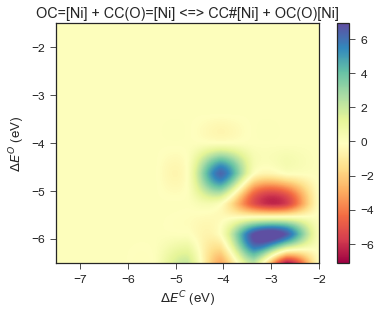

skipping COC=[Ni] + OCOCOC[Ni] <=> COC[Ni] + OCOCOC=[Ni] because it's boring
skipping COC(O)[Ni] + CC(=[Ni])OCO <=> COC(O)=[Ni] + CC([Ni])OCO because it's boring
skipping OC[Ni] + OCC(O)C(O)=[Ni] <=> OC=[Ni] + OCC(O)C(O)[Ni] because it's boring
skipping COC(O)[Ni] + OCCOC(O)=[Ni] <=> OCCOC(O)[Ni] + COC(O)=[Ni] because it's boring
skipping OCC[Ni] + OCOC(O)C(O)=[Ni] <=> OCC=[Ni] + OCOC(O)C(O)[Ni] because it's boring
skipping CC(O)=[Ni] + OCOC([Ni])CO <=> CC(O)[Ni] + OCOC(=[Ni])CO because it's boring


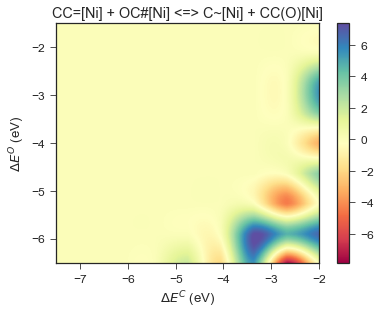

skipping CO[Ni] + OCC(O)=[Ni] <=> O=[Ni] + CC(O)([Ni])CO because it's boring
skipping CCC(O)=[Ni] + CC([Ni])OCO <=> CCC(O)[Ni] + CC(=[Ni])OCO because it's boring
skipping OCOC(O)C(O)=[Ni] + OCOC([Ni])OCO <=> OCOC(O)C(O)[Ni] + OCOC(=[Ni])OCO because it's boring
skipping OCC[Ni] + [Ni] <=> C=[Ni] + OC[Ni] because it's boring
skipping C=CC(O)[Ni] + OC(=[Ni])OC(O)O <=> C=CC(O)=[Ni] + OC(O)OC(O)[Ni] because it's boring
skipping OCOC=[Ni] + OCC(O)=[Ni] <=> OCOC(O)[Ni] + OCC#[Ni] because it's boring
skipping C#[Ni] + OCOCOC=[Ni] <=> C~[Ni] + OCOCOC[Ni] because it's boring
skipping OCOC(=[Ni])CO + O=COC(O)[Ni] <=> O=COC(O)=[Ni] + OCOC([Ni])CO because it's boring
skipping C=CC(O)[Ni] + [Ni] <=> [Ni] + C=CC(O)=[Ni] because it's boring
skipping OC(O)OC(O)[Ni] + CCOCC(O)=[Ni] <=> OC(=[Ni])OC(O)O + CCOCC(O)[Ni] because it's boring
skipping OCCOC(O)[Ni] + OCOCC(O)=[Ni] <=> OCCOC(O)=[Ni] + OCOCC(O)[Ni] because it's boring
skipping CC=[Ni] + OC(O)(O)[Ni] <=> OC(O)=[Ni] + CC(O)[Ni] because it's boring


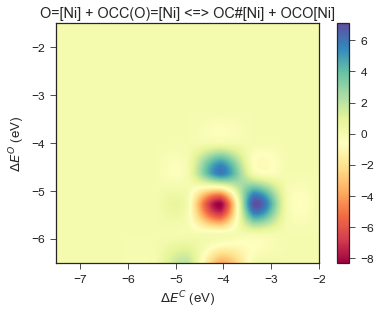

skipping C=[Ni] + OCC=[Ni] <=> C[Ni] + OCC#[Ni] because it's boring
skipping OCOCC[Ni] + [Ni] <=> C=[Ni] + OCOC[Ni] because it's boring
skipping O=C(O)[Ni] + OC(O)=[Ni] <=> O=C=[Ni] + OC(O)(O)[Ni] because it's boring
skipping OC(O)OC[Ni] + CC(=[Ni])OCO <=> CC([Ni])OCO + OC(O)OC=[Ni] because it's boring
skipping CC#[Ni] + OCC(O)=[Ni] <=> C~[Ni] + CC(O)([Ni])CO because it's boring
skipping OCC(O)OC(O)=[Ni] + CCOC[Ni] <=> OCC(O)OC(O)[Ni] + CCOC=[Ni] because it's boring
skipping OCC(O)OC(O)[Ni] + OCOC(=[Ni])OCO <=> OCC(O)OC(O)=[Ni] + OCOC([Ni])OCO because it's boring
skipping OCOO[Ni] + OCOC=[Ni] <=> O=[Ni] + OCOC([Ni])OCO because it's boring
skipping C=C=[Ni] + OC(O)C(O)[Ni] <=> C=C[Ni] + OC(=[Ni])C(O)O because it's boring
skipping C=[Ni] + OCC=[Ni] <=> C#[Ni] + OCC[Ni] because it's boring
skipping C#[Ni] + OCCOC(O)=[Ni] <=> C~[Ni] + OCCOC(O)[Ni] because it's boring


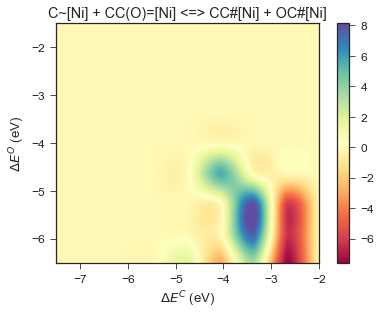

skipping COC[Ni] + CC(=[Ni])OCO <=> COC=[Ni] + CC([Ni])OCO because it's boring
skipping CC=[Ni] + OCC(O)=[Ni] <=> CC#[Ni] + OCC(O)[Ni] because it's boring
skipping COCC(O)=[Ni] + OCOC([Ni])CO <=> COCC(O)[Ni] + OCOC(=[Ni])CO because it's boring
skipping OCOC[Ni] + CCC(O)=[Ni] <=> OCOC=[Ni] + CCC(O)[Ni] because it's boring
skipping O=C[Ni] + CC(=[Ni])OCO <=> O=C=[Ni] + CC([Ni])OCO because it's boring
skipping OCOC(=[Ni])CO + OCOC([Ni])OCO <=> OCOC(=[Ni])OCO + OCOC([Ni])CO because it's boring
skipping OCCOC(O)[Ni] + OCOC(=[Ni])CO <=> OCCOC(O)=[Ni] + OCOC([Ni])CO because it's boring
skipping OC(O)(O)[Ni] + OC(O)OC=[Ni] <=> OC(O)=[Ni] + OC(O)OC(O)[Ni] because it's boring
skipping OC=[Ni] + CC([Ni])CO <=> CC=[Ni] + OCC(O)[Ni] because it's boring
skipping OCOC(O)(O)[Ni] + [Ni] <=> OCO[Ni] + OC(O)=[Ni] because it's boring
skipping CCOC(O)[Ni] + [Ni] <=> [Ni] + CCOC(O)=[Ni] because it's boring
skipping OC[Ni] + OOC(O)=[Ni] <=> OC=[Ni] + OOC(O)[Ni] because it's boring
skipping C=[Ni] + OCOCC(O)=

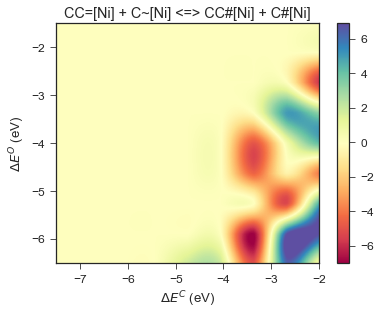

skipping OCOC(O)=[Ni] + COC(O)[Ni] <=> OCOC(O)[Ni] + COC(O)=[Ni] because it's boring
skipping COCC(O)=[Ni] + OCOC(O)[Ni] <=> COCC(O)[Ni] + OCOC(O)=[Ni] because it's boring
skipping COC(O)=[Ni] + OC(O)OC[Ni] <=> COC(O)[Ni] + OC(O)OC=[Ni] because it's boring
skipping OCOC(O)[Ni] + OCOC(=[Ni])OCO <=> OCOC(O)=[Ni] + OCOC([Ni])OCO because it's boring
skipping C#[Ni] + OCOC(=[Ni])OCO <=> C~[Ni] + OCOC([Ni])OCO because it's boring
skipping COCC(O)=[Ni] + OCOCOC[Ni] <=> COCC(O)[Ni] + OCOCOC=[Ni] because it's boring
skipping OCC(O)OC(O)=[Ni] + COC(O)[Ni] <=> OCC(O)OC(O)[Ni] + COC(O)=[Ni] because it's boring
skipping COCC(O)=[Ni] + CCOCC(O)[Ni] <=> COCC(O)[Ni] + CCOCC(O)=[Ni] because it's boring
skipping OCC(O)OC(O)[Ni] + OCOC(O)=[Ni] <=> OCC(O)OC(O)=[Ni] + OCOC(O)[Ni] because it's boring
skipping C#[Ni] + OCOCOC(O)=[Ni] <=> C~[Ni] + OCOCOC(O)[Ni] because it's boring
skipping OC(=[Ni])C(O)O + CCOC(O)[Ni] <=> OC(O)C(O)[Ni] + CCOC(O)=[Ni] because it's boring
skipping OC[Ni] + COCC(O)=[Ni] <=> OC=[

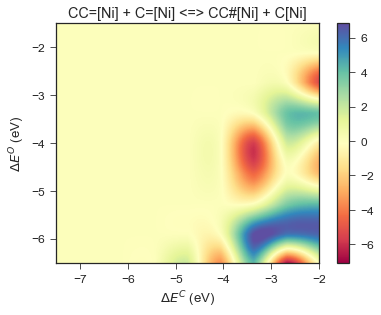

skipping OC(=[Ni])C(O)O + CCOC[Ni] <=> OC(O)C(O)[Ni] + CCOC=[Ni] because it's boring
skipping OCOC(O)[Ni] + [Ni] <=> O[Ni] + OCOC=[Ni] because it's boring
skipping CCCO + 2 [Ni] <=> [Ni] + OCCC[Ni] because it's boring
skipping OCC[Ni] + OC(=[Ni])C(O)O <=> OCC=[Ni] + OC(O)C(O)[Ni] because it's boring
skipping C=C=[Ni] + OC(O)[Ni] <=> C=C[Ni] + OC(O)=[Ni] because it's boring
skipping CC=[Ni] + OCOC(O)C(O)=[Ni] <=> CC#[Ni] + OCOC(O)C(O)[Ni] because it's boring
skipping O=COC[Ni] + OCCOC(O)=[Ni] <=> OCCOC(O)[Ni] + O=COC=[Ni] because it's boring
skipping OCOC[Ni] + OCOC(=[Ni])OCO <=> OCOC=[Ni] + OCOC([Ni])OCO because it's boring
skipping C=C=[Ni] + C=[Ni] <=> C=C[Ni] + C#[Ni] because it's boring
skipping OC[Ni] + OCC(O)OC(O)=[Ni] <=> OC=[Ni] + OCC(O)OC(O)[Ni] because it's boring
skipping OCC(O)[Ni] + OCCOC(O)=[Ni] <=> OCC(O)=[Ni] + OCCOC(O)[Ni] because it's boring


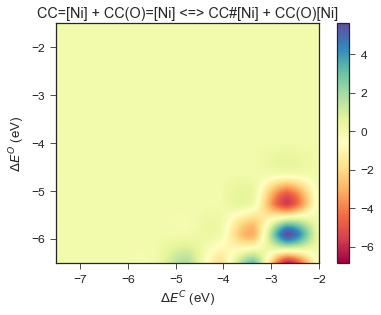

skipping CC[Ni] + OCC(O)C(O)=[Ni] <=> CC=[Ni] + OCC(O)C(O)[Ni] because it's boring
skipping OCCOC(O)[Ni] + OCOC(O)C(O)=[Ni] <=> OCCOC(O)=[Ni] + OCOC(O)C(O)[Ni] because it's boring
skipping CC(O)=[Ni] + OCC(O)=[Ni] <=> OC#[Ni] + CC(O)([Ni])CO because it's boring
skipping CCOCOCO + [Ni] <=> CCOCOCO.[Ni] because it's boring
skipping CC(O)C(O)=[Ni] + COC[Ni] <=> CC(O)C(O)[Ni] + COC=[Ni] because it's boring
skipping CC[Ni] + OOC(O)C(O)=[Ni] <=> CC=[Ni] + OOC(O)C(O)[Ni] because it's boring
skipping C#[Ni] + COC=[Ni] <=> C~[Ni] + COC[Ni] because it's boring
skipping O=C[Ni] + OCCOC(O)=[Ni] <=> O=C=[Ni] + OCCOC(O)[Ni] because it's boring
skipping CCC(O)=[Ni] + COC[Ni] <=> CCC(O)[Ni] + COC=[Ni] because it's boring
skipping CCC(O)=[Ni] + OCCOC(O)[Ni] <=> CCC(O)[Ni] + OCCOC(O)=[Ni] because it's boring
skipping OCC(O)C(O)=[Ni] + O=COC[Ni] <=> OCC(O)C(O)[Ni] + O=COC=[Ni] because it's boring
skipping OCC(O)OC(O)=[Ni] + OCC[Ni] <=> OCC(O)OC(O)[Ni] + OCC=[Ni] because it's boring
skipping C=[Ni] + CCOC

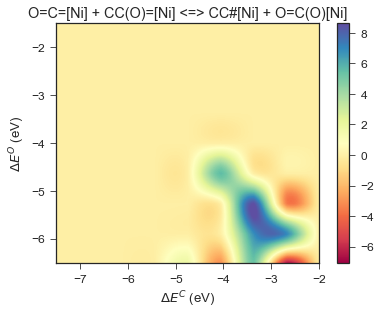

skipping OCC(O)OC(O)[Ni] + OC(=[Ni])OC(O)O <=> OCC(O)OC(O)=[Ni] + OC(O)OC(O)[Ni] because it's boring
skipping OCC=[Ni] + CCOCC(O)=[Ni] <=> OCC#[Ni] + CCOCC(O)[Ni] because it's boring
skipping OCC(O)[Ni] + OCOC(=[Ni])CO <=> OCC(O)=[Ni] + OCOC([Ni])CO because it's boring
skipping O=C[Ni] + O=COC=[Ni] <=> O=C=[Ni] + O=COC[Ni] because it's boring
skipping OC[Ni] + OCOCC(O)=[Ni] <=> OC=[Ni] + OCOCC(O)[Ni] because it's boring
skipping CC[Ni] + OC(O)=[Ni] <=> C=[Ni] + CC(O)(O)[Ni] because it's boring
skipping CC(O)(O)[Ni] + [Ni] <=> C[Ni] + OC(O)=[Ni] because it's boring


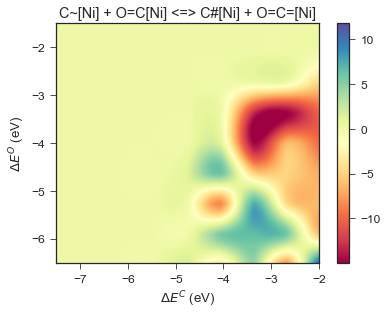

skipping OC[Ni] + CCOC(O)=[Ni] <=> OC=[Ni] + CCOC(O)[Ni] because it's boring
skipping OCOC(O)[Ni] + OCOC(O)C(O)=[Ni] <=> OCOC(O)=[Ni] + OCOC(O)C(O)[Ni] because it's boring
skipping OCC=[Ni] + [Ni] <=> [Ni] + OCC#[Ni] because it's boring
skipping CCOC(O)C(O)=[Ni] + [Ni] <=> OC#[Ni] + CCOC(O)[Ni] because it's boring
skipping OCOC=[Ni] + OCOC(O)=[Ni] <=> OC#[Ni] + OCOC([Ni])OCO because it's boring
skipping OCC=[Ni] + OCOC(O)=[Ni] <=> OC#[Ni] + OCOC([Ni])CO because it's boring


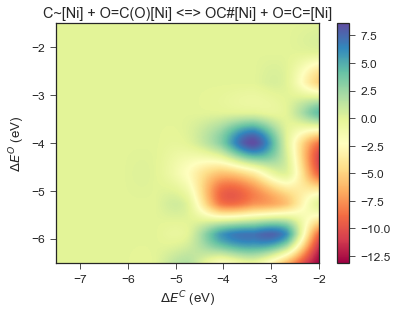

skipping OC(=[Ni])C(O)O + OOC(O)C(O)[Ni] <=> OC(O)C(O)[Ni] + OOC(O)C(O)=[Ni] because it's boring
skipping COCC(O)=[Ni] + OCOCOC(O)[Ni] <=> COCC(O)[Ni] + OCOCOC(O)=[Ni] because it's boring
skipping OCOC(O)C(O)=[Ni] + OCOCOC[Ni] <=> OCOC(O)C(O)[Ni] + OCOCOC=[Ni] because it's boring
skipping OC(O)C(O)[Ni] + CCOCC(O)=[Ni] <=> OC(=[Ni])C(O)O + CCOCC(O)[Ni] because it's boring
skipping CCC(O)=[Ni] + OOC(O)C(O)[Ni] <=> CCC(O)[Ni] + OOC(O)C(O)=[Ni] because it's boring


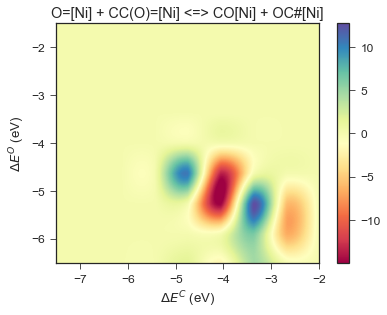

skipping OCC(O)C(O)[Ni] + OCOCC(O)=[Ni] <=> OCC(O)C(O)=[Ni] + OCOCC(O)[Ni] because it's boring
skipping OC#[Ni] + O=COC(O)[Ni] <=> OC=[Ni] + O=COC(O)=[Ni] because it's boring
skipping OCOC(O)=[Ni] + CCOC[Ni] <=> OCOC(O)[Ni] + CCOC=[Ni] because it's boring
skipping OOC(O)[Ni] + [Ni] <=> [Ni] + OOC(O)=[Ni] because it's boring
skipping OCC=[Ni] + OC(=[Ni])C(O)O <=> OC(O)C(O)[Ni] + OCC#[Ni] because it's boring
skipping OCC(O)[Ni] + CC(=[Ni])OCO <=> OCC(O)=[Ni] + CC([Ni])OCO because it's boring
skipping COCC(O)[Ni] + CC(O)=[Ni] <=> COCC(O)=[Ni] + CC(O)[Ni] because it's boring
skipping OCC[Ni] + OCC(O)C(O)=[Ni] <=> OCC=[Ni] + OCC(O)C(O)[Ni] because it's boring
skipping C[Ni] + O=COC(O)=[Ni] <=> C=[Ni] + O=COC(O)[Ni] because it's boring
skipping COCC(O)=[Ni] + OOC[Ni] <=> COCC(O)[Ni] + OOC=[Ni] because it's boring
skipping OCOC[Ni] + COC=[Ni] <=> OCOC=[Ni] + COC[Ni] because it's boring
skipping O[Ni] + CCC(O)=[Ni] <=> O=[Ni] + CCC(O)[Ni] because it's boring
skipping OOC(O)C(O)[Ni] + CCOCC(O)=

skipping COC(O)[Ni] + CCOC=[Ni] <=> COC(O)=[Ni] + CCOC[Ni] because it's boring
skipping C=C=[Ni] + O=COC[Ni] <=> C=C[Ni] + O=COC=[Ni] because it's boring
skipping C=C=[Ni] + OCC(O)[Ni] <=> C=C[Ni] + OCC(O)=[Ni] because it's boring
skipping OC[Ni] + OOC(O)C(O)=[Ni] <=> OC=[Ni] + OOC(O)C(O)[Ni] because it's boring


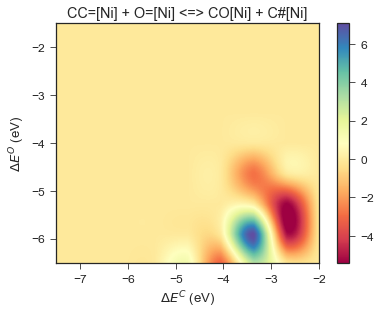

skipping C=CC(O)[Ni] + CCOC(O)=[Ni] <=> C=CC(O)=[Ni] + CCOC(O)[Ni] because it's boring
skipping OCOC[Ni] + OOC(O)C(O)=[Ni] <=> OCOC=[Ni] + OOC(O)C(O)[Ni] because it's boring
skipping OOC=[Ni] + O=COC(O)[Ni] <=> OOC(O)[Ni] + O=COC=[Ni] because it's boring
skipping O=COC(O)[Ni] + CCOC=[Ni] <=> O=COC=[Ni] + CCOC(O)[Ni] because it's boring
skipping O[Ni] + OC(O)OC=[Ni] <=> O=[Ni] + OC(O)OC[Ni] because it's boring
skipping OCOC(O)=[Ni] + COC[Ni] <=> OCOC(O)[Ni] + COC=[Ni] because it's boring
skipping OC(O)=[Ni] + OOC=[Ni] <=> OC#[Ni] + OOC(O)[Ni] because it's boring
skipping O[Ni] + CC(O)C(O)=[Ni] <=> O=[Ni] + CC(O)C(O)[Ni] because it's boring
skipping OC(O)=[Ni] + OCOC(O)=[Ni] <=> OC#[Ni] + OCOC(O)(O)[Ni] because it's boring


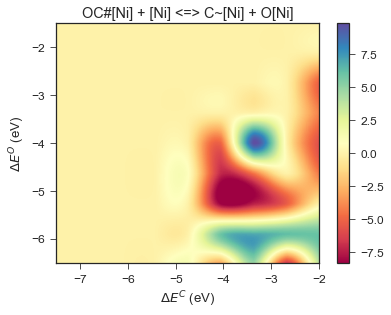

skipping OC(=[Ni])OC(O)O + CCOC[Ni] <=> OC(O)OC(O)[Ni] + CCOC=[Ni] because it's boring
skipping C=CC(O)[Ni] + CCOC=[Ni] <=> C=CC(O)=[Ni] + CCOC[Ni] because it's boring
skipping COC[Ni] + OCCOC(O)=[Ni] <=> OCCOC(O)[Ni] + COC=[Ni] because it's boring
skipping O=COC=[Ni] + OCC(O)(O)[Ni] <=> OCC(O)=[Ni] + O=COC(O)[Ni] because it's boring
skipping CC(O)=[Ni] + OCCOC(O)[Ni] <=> CC(O)[Ni] + OCCOC(O)=[Ni] because it's boring
skipping CC[Ni] + OCOC(O)=[Ni] <=> CC=[Ni] + OCOC(O)[Ni] because it's boring


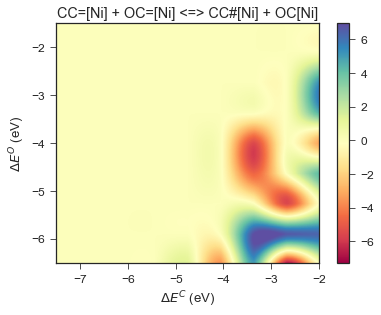

skipping C=[Ni] + O=COC(O)=[Ni] <=> C#[Ni] + O=COC(O)[Ni] because it's boring
skipping CC(O)C(O)[Ni] + OCC(O)C(O)=[Ni] <=> CC(O)C(O)=[Ni] + OCC(O)C(O)[Ni] because it's boring
skipping OCOCOC[Ni] + OC(=[Ni])OC(O)O <=> OCOCOC=[Ni] + OC(O)OC(O)[Ni] because it's boring


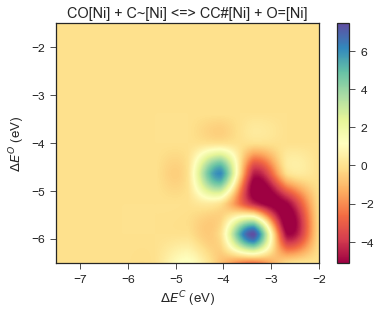

skipping OCOC=[Ni] + OOC[Ni] <=> OCOC[Ni] + OOC=[Ni] because it's boring
skipping CC=[Ni] + OCOC(O)=[Ni] <=> OC#[Ni] + CC([Ni])OCO because it's boring
skipping OOC[Ni] + CCOC=[Ni] <=> OOC=[Ni] + CCOC[Ni] because it's boring
skipping C[Ni] + OOC(O)C(O)=[Ni] <=> C=[Ni] + OOC(O)C(O)[Ni] because it's boring
skipping CCOCOCO + 2 [Ni] <=> C[Ni] + OCOCOC[Ni] because it's boring
skipping OC#[Ni] + CCOC=[Ni] <=> C~[Ni] + CCOC(O)[Ni] because it's boring
skipping OCC=[Ni] + OCC(O)=[Ni] <=> OCC(O)[Ni] + OCC#[Ni] because it's boring
skipping OCC(O)[Ni] + OCOC(=[Ni])OCO <=> OCC(O)=[Ni] + OCOC([Ni])OCO because it's boring
skipping OC=[Ni] + OCOC=[Ni] <=> C#[Ni] + OCOC(O)[Ni] because it's boring
skipping OC[Ni] + CC(O)C(O)=[Ni] <=> OC=[Ni] + CC(O)C(O)[Ni] because it's boring
skipping OCC(O)C(O)=[Ni] + C=CC(O)[Ni] <=> OCC(O)C(O)[Ni] + C=CC(O)=[Ni] because it's boring
skipping OC#[Ni] + OCCOC(O)[Ni] <=> OC=[Ni] + OCCOC(O)=[Ni] because it's boring
skipping OCOC[Ni] + O=COC(O)=[Ni] <=> OCOC=[Ni] + O=COC(O

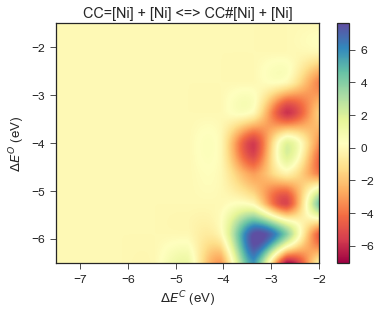

skipping CC=[Ni] + OCC(O)=[Ni] <=> OC#[Ni] + CC([Ni])CO because it's boring
skipping O=C(O)[Ni] + OCC(O)=[Ni] <=> O=C=[Ni] + OCC(O)(O)[Ni] because it's boring
skipping O=C[Ni] + OOC(O)=[Ni] <=> O=C=[Ni] + OOC(O)[Ni] because it's boring
skipping OOC(O)C(O)=[Ni] + OC(O)OC[Ni] <=> OOC(O)C(O)[Ni] + OC(O)OC=[Ni] because it's boring
skipping COC=[Ni] + O=COC(O)[Ni] <=> COC(O)[Ni] + O=COC=[Ni] because it's boring
skipping C=C=[Ni] + OC=[Ni] <=> C=C[Ni] + OC#[Ni] because it's boring
skipping CCOCOCO + 2 [Ni] <=> OC[Ni] + CCOCO[Ni] because it's boring
skipping C=CC(O)[Ni] + OCOCOC(O)=[Ni] <=> C=CC(O)=[Ni] + OCOCOC(O)[Ni] because it's boring
skipping OOC(O)[Ni] + OCOCC(O)=[Ni] <=> OOC(O)=[Ni] + OCOCC(O)[Ni] because it's boring
skipping CC[Ni] + CC(O)=[Ni] <=> CC=[Ni] + CC(O)[Ni] because it's boring
skipping OC(=[Ni])C(O)O + CC([Ni])OCO <=> OC(O)C(O)[Ni] + CC(=[Ni])OCO because it's boring
skipping OC(O)=[Ni] + COC(O)[Ni] <=> OC(O)[Ni] + COC(O)=[Ni] because it's boring
skipping OCC(O)=[Ni] + OCC(O

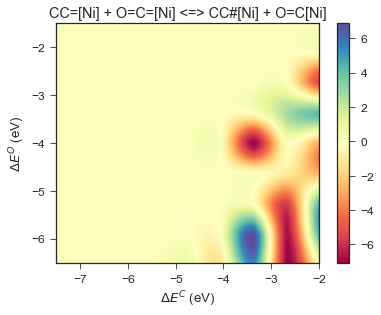

skipping OCOCC(O)=[Ni] + OCOCOC(O)[Ni] <=> OCOCC(O)[Ni] + OCOCOC(O)=[Ni] because it's boring
skipping O=C[Ni] + OCOC(O)=[Ni] <=> O=C=[Ni] + OCOC(O)[Ni] because it's boring
skipping OCC(O)=[Ni] + CC([Ni])CO <=> CC=[Ni] + OCC(O)([Ni])CO because it's boring
skipping O=COC[Ni] + CCOCC(O)=[Ni] <=> O=COC=[Ni] + CCOCC(O)[Ni] because it's boring
skipping OCC(O)C(O)=[Ni] + OC(O)OC(O)[Ni] <=> OCC(O)C(O)[Ni] + OC(=[Ni])OC(O)O because it's boring
skipping OOC=[Ni] + O=COC[Ni] <=> OOC[Ni] + O=COC=[Ni] because it's boring
skipping O=COC(O)=[Ni] + OC(O)OC(O)[Ni] <=> O=COC(O)[Ni] + OC(=[Ni])OC(O)O because it's boring
skipping OC(O)=[Ni] + OCOCOC(O)[Ni] <=> OC(O)[Ni] + OCOCOC(O)=[Ni] because it's boring


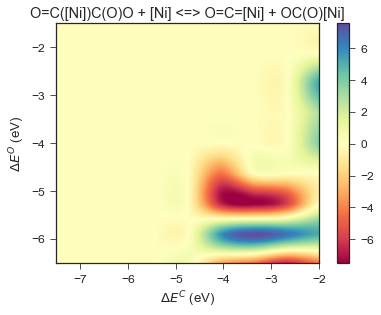

skipping CC=[Ni] + OCOO[Ni] <=> O=[Ni] + CC([Ni])OCO because it's boring
skipping OCC(O)C(O)=[Ni] + OCCOC(O)[Ni] <=> OCC(O)C(O)[Ni] + OCCOC(O)=[Ni] because it's boring
skipping OC[Ni] + OCOC(O)=[Ni] <=> OC=[Ni] + OCOC(O)[Ni] because it's boring
skipping C#[Ni] + CCOC[Ni] <=> C=[Ni] + CCOC=[Ni] because it's boring
skipping CC(O)=[Ni] + O=COC(O)[Ni] <=> CC(O)[Ni] + O=COC(O)=[Ni] because it's boring
skipping OCC[Ni] + OOC(O)=[Ni] <=> OCC=[Ni] + OOC(O)[Ni] because it's boring
skipping OCC[Ni] + CC(O)C(O)=[Ni] <=> OCC=[Ni] + CC(O)C(O)[Ni] because it's boring
skipping OCC=[Ni] + CC([Ni])OCO <=> CC=[Ni] + OCOC([Ni])CO because it's boring
skipping OC(O)C(O)[Ni] + OCOCC(O)=[Ni] <=> OC(=[Ni])C(O)O + OCOCC(O)[Ni] because it's boring
skipping C=[Ni] + OC(=[Ni])OC(O)O <=> OC#[Ni] + OC(O)OC[Ni] because it's boring
skipping O=C(O)[Ni] + OCOC(O)=[Ni] <=> O=C=[Ni] + OCOC(O)(O)[Ni] because it's boring
skipping OCC(O)=[Ni] + OCOC(O)=[Ni] <=> OCC#[Ni] + OCOC(O)(O)[Ni] because it's boring
skipping CC=[Ni] 

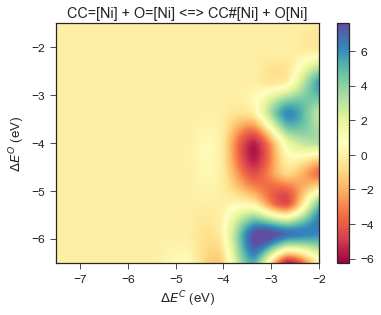

skipping OCC(O)OC(O)[Ni] + OCOC(=[Ni])CO <=> OCC(O)OC(O)=[Ni] + OCOC([Ni])CO because it's boring
skipping OCC(O)OC(O)[Ni] + COCC(O)=[Ni] <=> OCC(O)OC(O)=[Ni] + COCC(O)[Ni] because it's boring
skipping OCOCOC[Ni] + OC(O)OC=[Ni] <=> OCOCOC=[Ni] + OC(O)OC[Ni] because it's boring
skipping CC([Ni])OCO + [Ni] <=> [Ni] + CC(=[Ni])OCO because it's boring
skipping OOC(O)=[Ni] + OCOCOC(O)[Ni] <=> OOC(O)[Ni] + OCOCOC(O)=[Ni] because it's boring
skipping CC[Ni] + OCOC=[Ni] <=> C=[Ni] + CC([Ni])OCO because it's boring
skipping CCC[Ni] + OC=[Ni] <=> C=[Ni] + CCC(O)[Ni] because it's boring
skipping O=C(O)[Ni] + CC(O)=[Ni] <=> O=C=[Ni] + CC(O)(O)[Ni] because it's boring
skipping O=COC(O)[Ni] + [Ni] <=> [Ni] + O=COC(O)=[Ni] because it's boring
skipping CC(O)C(O)=[Ni] + OCOCOC(O)[Ni] <=> CC(O)C(O)[Ni] + OCOCOC(O)=[Ni] because it's boring
skipping CC=[Ni] + OCC(O)=[Ni] <=> C#[Ni] + CC(O)([Ni])CO because it's boring
skipping C=[Ni] + CC(=[Ni])OCO <=> C#[Ni] + CC([Ni])OCO because it's boring
skipping OCOC=

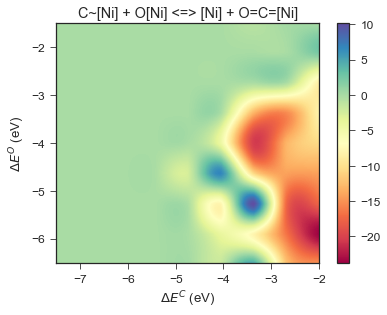

skipping O[Ni] + OCC(O)C(O)=[Ni] <=> O=[Ni] + OCC(O)C(O)[Ni] because it's boring
skipping O=C[Ni] + OCOCOC(O)=[Ni] <=> O=C=[Ni] + OCOCOC(O)[Ni] because it's boring
skipping CCC(O)=[Ni] + OCOC([Ni])OCO <=> CCC(O)[Ni] + OCOC(=[Ni])OCO because it's boring
skipping CC(C)[Ni] + OC=[Ni] <=> CC=[Ni] + CC(O)[Ni] because it's boring
skipping C[Ni] + OCC(O)OC(O)=[Ni] <=> C=[Ni] + OCC(O)OC(O)[Ni] because it's boring
skipping COCC(O)=[Ni] + OCOCC(O)[Ni] <=> COCC(O)[Ni] + OCOCC(O)=[Ni] because it's boring
skipping COCC(O)=[Ni] + OCOC[Ni] <=> COCC(O)[Ni] + OCOC=[Ni] because it's boring
skipping OC(O)=[Ni] + CC([Ni])CO <=> CC=[Ni] + OCC(O)(O)[Ni] because it's boring
skipping 2 OC(O)=[Ni] <=> OC#[Ni] + OC(O)(O)[Ni] because it's boring
skipping O=[Ni] + CC([Ni])CO <=> CO[Ni] + OCC=[Ni] because it's boring
skipping C=[Ni] + CCC(O)=[Ni] <=> C#[Ni] + CCC(O)[Ni] because it's boring
skipping OCC=[Ni] + OC(O)=[Ni] <=> OC#[Ni] + OCC(O)[Ni] because it's boring
skipping CCC(O)[Ni] + [Ni] <=> CC[Ni] + OC=[Ni] be

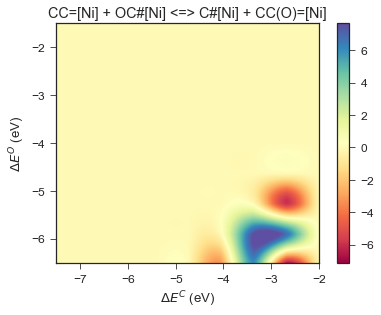

skipping C=[Ni] + OCOC(O)C(O)=[Ni] <=> C#[Ni] + OCOC(O)C(O)[Ni] because it's boring
skipping OCC=[Ni] + CC(O)C(O)=[Ni] <=> CC(O)C(O)[Ni] + OCC#[Ni] because it's boring
skipping OCC[Ni] + OCOC(=[Ni])OCO <=> OCC=[Ni] + OCOC([Ni])OCO because it's boring
skipping C#[Ni] + OCOC(=[Ni])CO <=> OCOC=[Ni] + OCC#[Ni] because it's boring
skipping COC[Ni] + CCOCC(O)=[Ni] <=> COC=[Ni] + CCOCC(O)[Ni] because it's boring
skipping OCOC=[Ni] + CC(O)=[Ni] <=> CC#[Ni] + OCOC(O)[Ni] because it's boring
skipping OC=[Ni] + CCOC(O)=[Ni] <=> OC#[Ni] + CCOC(O)[Ni] because it's boring
skipping COCC(O)=[Ni] + OC(O)[Ni] <=> COCC(O)[Ni] + OC(O)=[Ni] because it's boring
skipping CC(O)=[Ni] + OCOCOC[Ni] <=> CC(O)[Ni] + OCOCOC=[Ni] because it's boring
skipping OOC(O)C(O)=[Ni] + OCOCOC[Ni] <=> OOC(O)C(O)[Ni] + OCOCOC=[Ni] because it's boring
skipping OCC=[Ni] + OC(O)OC=[Ni] <=> OCC#[Ni] + OC(O)OC[Ni] because it's boring
skipping C=C=[Ni] + OC(O)OC(O)[Ni] <=> C=C[Ni] + OC(=[Ni])OC(O)O because it's boring
skipping C#[Ni]

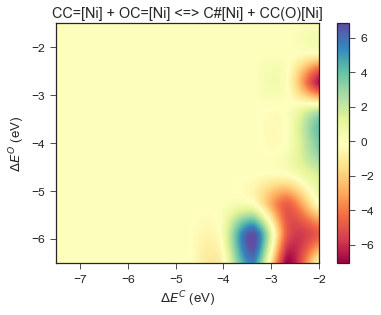

skipping C=CC(O)[Ni] + CC(=[Ni])OCO <=> C=CC(O)=[Ni] + CC([Ni])OCO because it's boring
skipping O=[Ni] + OCC=[Ni] <=> C#[Ni] + OCO[Ni] because it's boring
skipping O=C(O)[Ni] + OCC=[Ni] <=> O=C=[Ni] + OCC(O)[Ni] because it's boring
skipping OC=[Ni] + OC(O)C[Ni] <=> C=[Ni] + OC(O)C(O)[Ni] because it's boring
skipping C[Ni] + OC(=[Ni])OC(O)O <=> C=[Ni] + OC(O)OC(O)[Ni] because it's boring
skipping COC(O)C(O)=[Ni] + [Ni] <=> OC#[Ni] + COC(O)[Ni] because it's boring
skipping CC(O)=[Ni] + O=COC[Ni] <=> CC(O)[Ni] + O=COC=[Ni] because it's boring
skipping OCOC[Ni] + CC(O)C(O)=[Ni] <=> OCOC=[Ni] + CC(O)C(O)[Ni] because it's boring
skipping OCC=[Ni] + OCOC(O)(O)[Ni] <=> OC(O)=[Ni] + OCOC([Ni])CO because it's boring
skipping CC(C)[Ni] + OC(O)=[Ni] <=> CC=[Ni] + CC(O)(O)[Ni] because it's boring
skipping OCC(O)OC(O)[Ni] + OC(O)=[Ni] <=> OCC(O)OC(O)=[Ni] + OC(O)[Ni] because it's boring
skipping C=[Ni] + OC(=[Ni])OC(O)O <=> C#[Ni] + OC(O)OC(O)[Ni] because it's boring
skipping OCC(O)([Ni])CO + [Ni] <

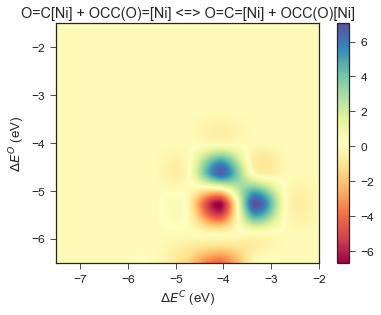

skipping OCC=[Ni] + OCOC(O)[Ni] <=> OC=[Ni] + OCOC([Ni])CO because it's boring
skipping OCC(O)C(O)=[Ni] + OCOCOC(O)[Ni] <=> OCC(O)C(O)[Ni] + OCOCOC(O)=[Ni] because it's boring
skipping CCC(O)=[Ni] + OCOC(O)C(O)[Ni] <=> CCC(O)[Ni] + OCOC(O)C(O)=[Ni] because it's boring
skipping OOC(O)C(O)=[Ni] + OC(O)OC(O)[Ni] <=> OOC(O)C(O)[Ni] + OC(=[Ni])OC(O)O because it's boring
skipping OCC(O)OC(O)[Ni] + CCOC(O)=[Ni] <=> OCC(O)OC(O)=[Ni] + CCOC(O)[Ni] because it's boring


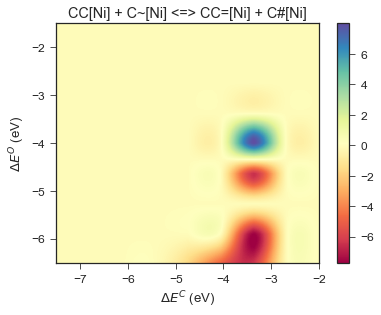

skipping OO[Ni] + COC=[Ni] <=> O=[Ni] + COC(O)[Ni] because it's boring
skipping OC[Ni] + OCC(O)=[Ni] <=> C=[Ni] + OCC(O)(O)[Ni] because it's boring
skipping COC[Ni] + OCOC(=[Ni])OCO <=> COC=[Ni] + OCOC([Ni])OCO because it's boring
skipping C#[Ni] + OCC(O)C(O)=[Ni] <=> C~[Ni] + OCC(O)C(O)[Ni] because it's boring
skipping COC(O)=[Ni] + C=CC(O)[Ni] <=> COC(O)[Ni] + C=CC(O)=[Ni] because it's boring
skipping CC#[Ni] + OC(O)=[Ni] <=> C~[Ni] + CC(O)(O)[Ni] because it's boring
skipping OCC(O)[Ni] + OCOC(O)C(O)=[Ni] <=> OCC(O)=[Ni] + OCOC(O)C(O)[Ni] because it's boring
skipping C=C=[Ni] + C#[Ni] <=> C=C[Ni] + C~[Ni] because it's boring
skipping CCOCO + [Ni] <=> CCOCO.[Ni] because it's boring
skipping OC[Ni] + OOC=[Ni] <=> C=[Ni] + OOC(O)[Ni] because it's boring
skipping CC(O)=[Ni] + CCOC=[Ni] <=> CC#[Ni] + CCOC(O)[Ni] because it's boring
skipping OCOC(O)[Ni] + CC(O)C(O)=[Ni] <=> OCOC(O)=[Ni] + CC(O)C(O)[Ni] because it's boring
skipping OCOC=[Ni] + OCOC(O)(O)[Ni] <=> OC(O)=[Ni] + OCOC([Ni])OCO b

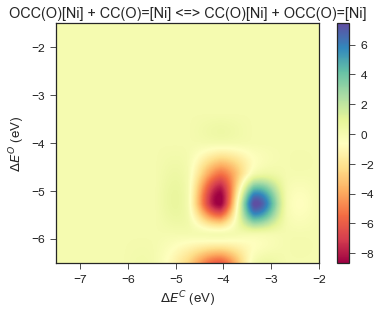

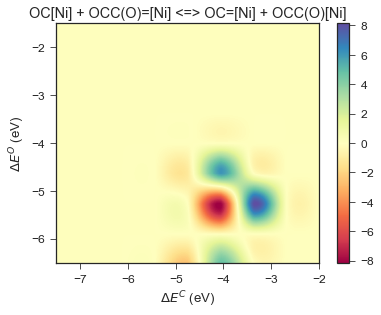

skipping OCC(O)[Ni] + OCC(O)C(O)=[Ni] <=> OCC(O)=[Ni] + OCC(O)C(O)[Ni] because it's boring
skipping OCOC(O)=[Ni] + C=CC(O)[Ni] <=> OCOC(O)[Ni] + C=CC(O)=[Ni] because it's boring
skipping OCC(O)[Ni] + CC(O)C(O)=[Ni] <=> OCC(O)=[Ni] + CC(O)C(O)[Ni] because it's boring
skipping OO[Ni] + OCC=[Ni] <=> O=[Ni] + OCC(O)[Ni] because it's boring
skipping OCC(O)[Ni] + OOC(O)C(O)=[Ni] <=> OCC(O)=[Ni] + OOC(O)C(O)[Ni] because it's boring
skipping OCOC[Ni] + OC(=[Ni])C(O)O <=> OCOC=[Ni] + OC(O)C(O)[Ni] because it's boring
skipping CCOCO + 2 [Ni] <=> [Ni] + CCOCO[Ni] because it's boring
skipping OCOC(O)[Ni] + OC(=[Ni])C(O)O <=> OC(O)C(O)[Ni] + OCOC(O)=[Ni] because it's boring
skipping CC(O)=[Ni] + OCOC(O)C(O)[Ni] <=> CC(O)[Ni] + OCOC(O)C(O)=[Ni] because it's boring
skipping OCOC[Ni] + OCC(O)=[Ni] <=> OCOC=[Ni] + OCC(O)[Ni] because it's boring
skipping OC(=[Ni])C(O)O + OOC(O)[Ni] <=> OC(O)C(O)[Ni] + OOC(O)=[Ni] because it's boring
skipping OC=[Ni] + OC(O)OC[Ni] <=> C=[Ni] + OC(O)OC(O)[Ni] because it's

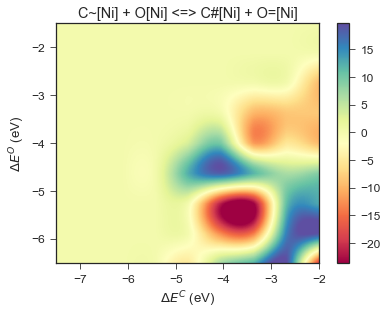

skipping OO[Ni] + OCOC(O)=[Ni] <=> O=[Ni] + OCOC(O)(O)[Ni] because it's boring
skipping OC[Ni] + C=CC(O)=[Ni] <=> OC=[Ni] + C=CC(O)[Ni] because it's boring
skipping CC(O)=[Ni] + OCC(O)C(O)[Ni] <=> CC(O)[Ni] + OCC(O)C(O)=[Ni] because it's boring
skipping CCCO + 2 [Ni] <=> C[Ni] + OCC[Ni] because it's boring


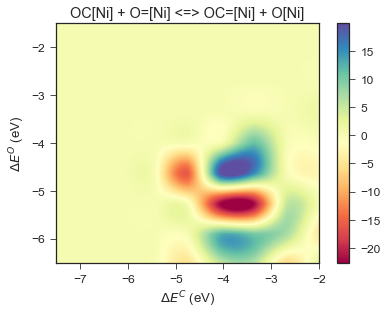

skipping CC(O)=[Ni] + CC(O)C(O)[Ni] <=> CC(O)[Ni] + CC(O)C(O)=[Ni] because it's boring
skipping CC(O)=[Ni] + OOC(O)C(O)[Ni] <=> CC(O)[Ni] + OOC(O)C(O)=[Ni] because it's boring
skipping CC(O)=[Ni] + OOC[Ni] <=> CC(O)[Ni] + OOC=[Ni] because it's boring
skipping C#[Ni] + OCOC=[Ni] <=> C~[Ni] + OCOC[Ni] because it's boring
skipping OC(O)=[Ni] + OCC(O)[Ni] <=> OC(O)[Ni] + OCC(O)=[Ni] because it's boring
skipping CC(O)C(O)=[Ni] + [Ni] <=> OC#[Ni] + CC(O)[Ni] because it's boring
skipping OCC(O)C(O)=[Ni] + [Ni] <=> OC#[Ni] + OCC(O)[Ni] because it's boring
skipping OC(O)[Ni] + OCC(O)C(O)=[Ni] <=> OC(O)=[Ni] + OCC(O)C(O)[Ni] because it's boring
skipping OO[Ni] + OCOC=[Ni] <=> O=[Ni] + OCOC(O)[Ni] because it's boring
skipping OC(O)[Ni] + CC(O)C(O)=[Ni] <=> OC(O)=[Ni] + CC(O)C(O)[Ni] because it's boring
skipping OC(O)[Ni] + OOC(O)C(O)=[Ni] <=> OC(O)=[Ni] + OOC(O)C(O)[Ni] because it's boring


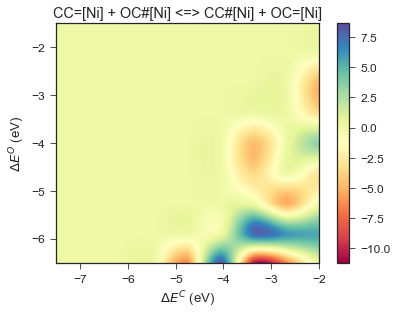

skipping OCC(O)[Ni] + OC(=[Ni])C(O)O <=> OC(O)C(O)[Ni] + OCC(O)=[Ni] because it's boring
skipping C#[Ni] + OOC=[Ni] <=> C~[Ni] + OOC[Ni] because it's boring
skipping O=COCO + 2 [Ni] <=> O=C[Ni] + OCO[Ni] because it's boring
skipping OC(O)=[Ni] + OOC[Ni] <=> OC(O)[Ni] + OOC=[Ni] because it's boring
skipping OCC(O)=[Ni] + OOC[Ni] <=> OCC(O)[Ni] + OOC=[Ni] because it's boring
skipping OC=[Ni] + CC(O)([Ni])CO <=> CC(O)[Ni] + OCC(O)=[Ni] because it's boring
skipping OOC=[Ni] + C=CC(O)[Ni] <=> OOC[Ni] + C=CC(O)=[Ni] because it's boring
skipping OC=[Ni] + OCC(O)([Ni])CO <=> OCC(O)[Ni] + OCC(O)=[Ni] because it's boring
skipping OOC(O)C(O)=[Ni] + [Ni] <=> OC#[Ni] + OOC(O)[Ni] because it's boring
skipping CC(O)=[Ni] + C=CC(O)[Ni] <=> CC(O)[Ni] + C=CC(O)=[Ni] because it's boring
skipping C=[Ni] + COC(O)[Ni] <=> OC=[Ni] + COC[Ni] because it's boring
skipping OCC(O)[Ni] + CC(O)=[Ni] <=> OC=[Ni] + CC(O)([Ni])CO because it's boring
skipping OO[Ni] + OOC=[Ni] <=> O=[Ni] + OOC(O)[Ni] because it's borin

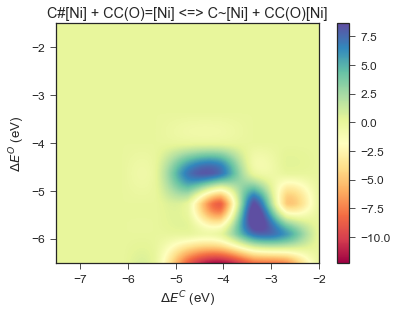

skipping OC(O)[Ni] + OC(=[Ni])C(O)O <=> OC(O)=[Ni] + OC(O)C(O)[Ni] because it's boring


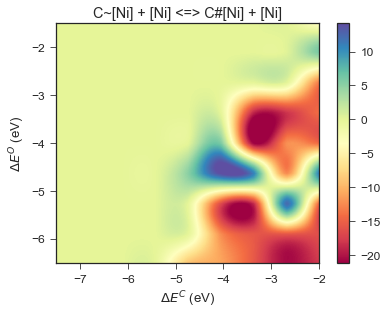

skipping OC(=[Ni])C(O)O + [Ni] <=> OC#[Ni] + OC(O)[Ni] because it's boring


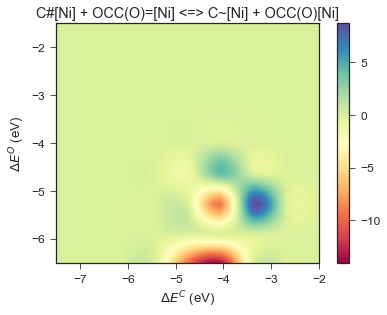

skipping OC=[Ni] + OCOC[Ni] <=> C=[Ni] + OCOC(O)[Ni] because it's boring
skipping OO[Ni] + OCC(O)=[Ni] <=> O=[Ni] + OCC(O)(O)[Ni] because it's boring
skipping OO[Ni] + OC(O)=[Ni] <=> O=[Ni] + OC(O)(O)[Ni] because it's boring


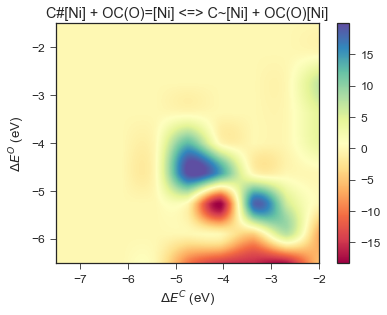

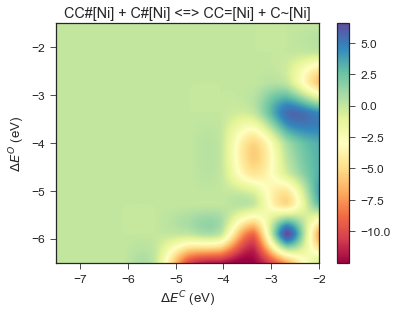

skipping OOC=[Ni] + [Ni] <=> C#[Ni] + OO[Ni] because it's boring
skipping [O]CO + [Ni] <=> OCO[Ni] because it's boring
skipping C#[Ni] + C=CC(O)=[Ni] <=> C~[Ni] + C=CC(O)[Ni] because it's boring
skipping C=CC(O)=[Ni] + [Ni] <=> C=C[Ni] + OC#[Ni] because it's boring


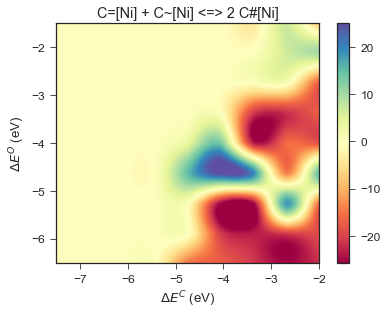

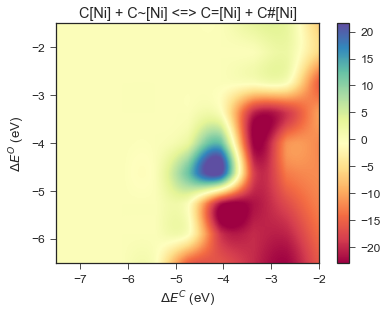

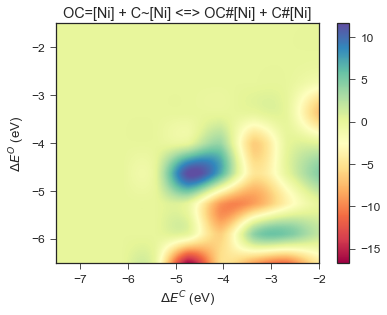

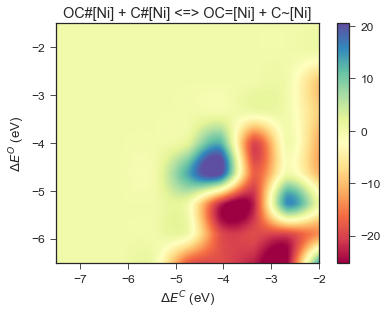

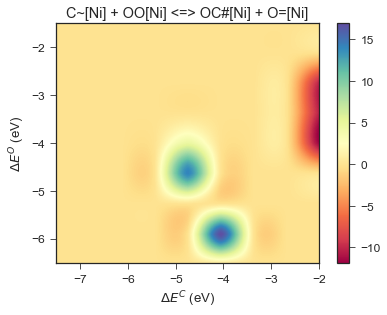

skipping O=C(O)C(O)(O)[Ni] + [Ni] <=> O=C(O)[Ni] + OC(O)=[Ni] because it's boring


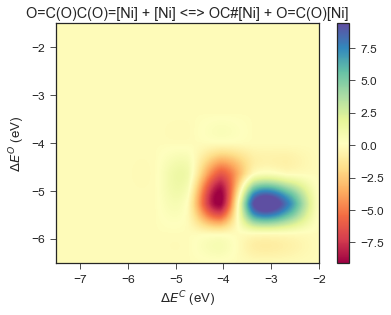

skipping OC(O)=[Ni] + O=C(O)C(O)=[Ni] <=> OC#[Ni] + O=C(O)C(O)(O)[Ni] because it's boring


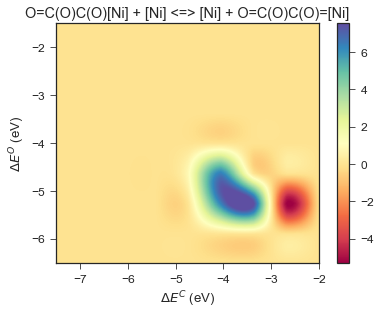

skipping OCC(O)=[Ni] + O=C(O)C(O)(O)[Ni] <=> O=C(O)C(O)=[Ni] + OCC(O)(O)[Ni] because it's boring
skipping OO[Ni] + O=C(O)C(O)=[Ni] <=> O=[Ni] + O=C(O)C(O)(O)[Ni] because it's boring
skipping OC=[Ni] + O=C(O)C(O)=[Ni] <=> C#[Ni] + O=C(O)C(O)(O)[Ni] because it's boring
skipping CC(O)[Ni] + O=C(O)C(O)=[Ni] <=> CC(O)=[Ni] + O=C(O)C(O)[Ni] because it's boring


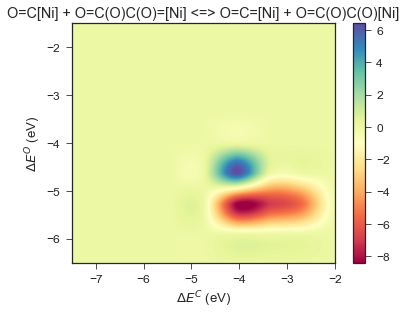

skipping OCC(O)[Ni] + O=C(O)C(O)=[Ni] <=> OCC(O)=[Ni] + O=C(O)C(O)[Ni] because it's boring
skipping OC=[Ni] + O=C(O)C(O)(O)[Ni] <=> OC(O)[Ni] + O=C(O)C(O)=[Ni] because it's boring
skipping C=[Ni] + O=C(O)C(O)=[Ni] <=> C#[Ni] + O=C(O)C(O)[Ni] because it's boring
skipping OCO[Ni] + OC(O)=[Ni] <=> O=[Ni] + OCC(O)(O)[Ni] because it's boring
skipping OC=[Ni] + O=C(O)C(O)=[Ni] <=> OC#[Ni] + O=C(O)C(O)[Ni] because it's boring
skipping OC(O)[Ni] + O=C(O)C(O)=[Ni] <=> OC(O)=[Ni] + O=C(O)C(O)[Ni] because it's boring


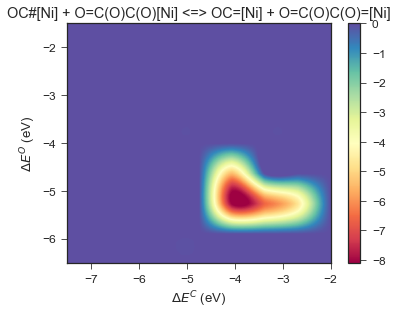

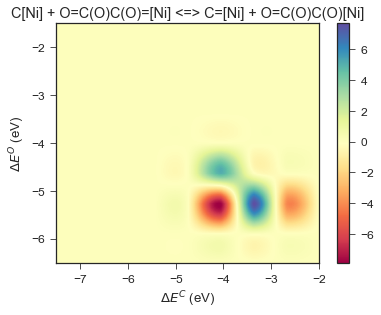

skipping OC[Ni] + O=C(O)C(O)=[Ni] <=> C=[Ni] + O=C(O)C(O)(O)[Ni] because it's boring


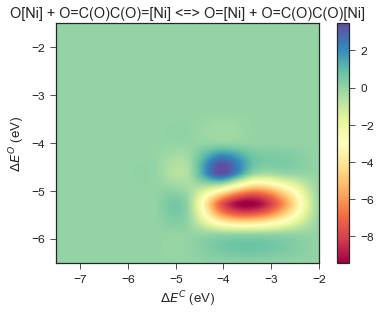

skipping OC=[Ni] + O=C(O)C(O)(O)[Ni] <=> OC(O)=[Ni] + O=C(O)C(O)[Ni] because it's boring


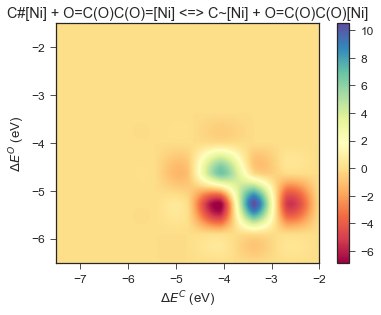

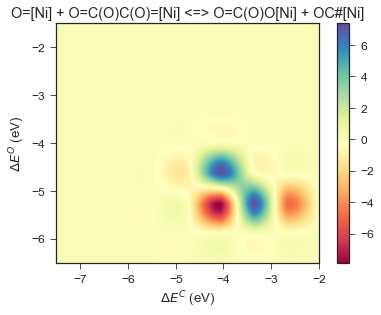

skipping O=C(O)O[Ni] + OC(O)=[Ni] <=> O=[Ni] + O=C(O)C(O)(O)[Ni] because it's boring
skipping O=C(O)[Ni] + O=C(O)C(O)=[Ni] <=> O=C=[Ni] + O=C(O)C(O)(O)[Ni] because it's boring


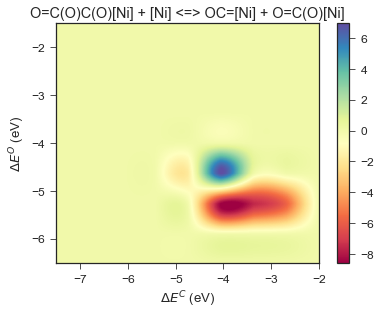

skipping O=C(O)C(O)(O)[Ni] + [Ni] <=> O[Ni] + O=C(O)C(O)=[Ni] because it's boring
skipping OC#[Ni] + O=C(O)C(O)=[Ni] <=> C~[Ni] + O=C(O)C(O)(O)[Ni] because it's boring


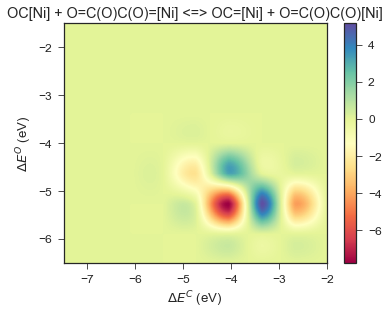

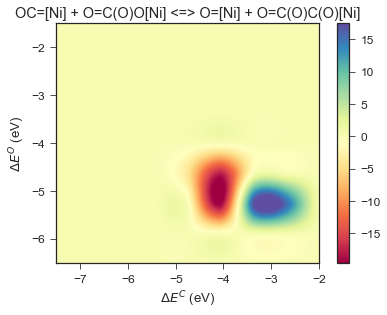

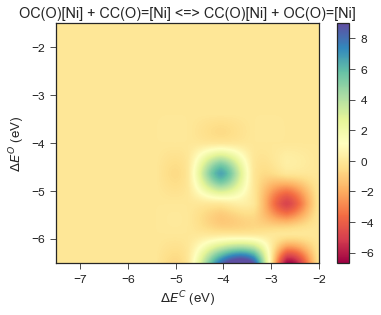

skipping O=C(O)OO[Ni] + [Ni] <=> O=C(O)O[Ni] + O=[Ni] because it's boring
skipping CC(=O)O + [Ni] <=> CC(=O)O.[Ni] because it's boring
skipping CC(=O)O + 2 [Ni] <=> C[Ni] + O=C(O)[Ni] because it's boring
skipping O[Ni] + O=C=[Ni] <=> O=C[Ni] + O=[Ni] because it's boring


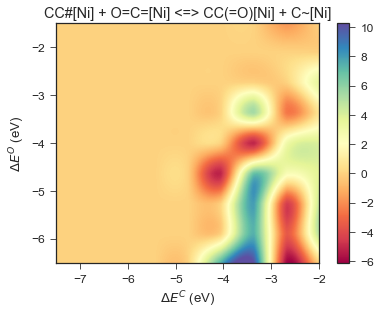

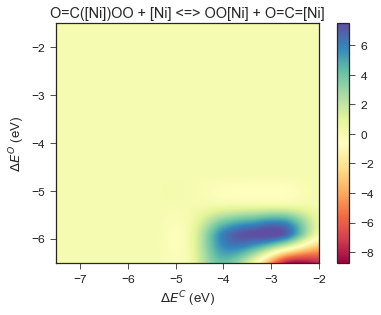

skipping O=C=[Ni] + OOC(O)=[Ni] <=> O=C([Ni])OO + OC#[Ni] because it's boring


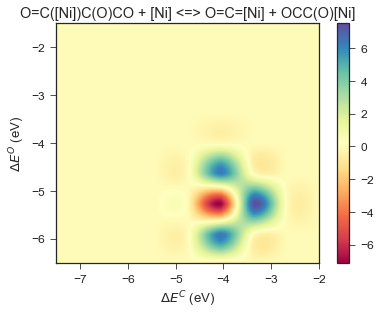

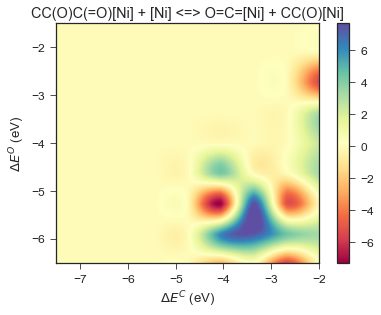

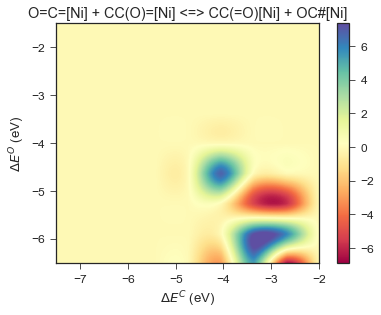

skipping CC(C)[Ni] + O=C=[Ni] <=> CC(=O)[Ni] + CC=[Ni] because it's boring


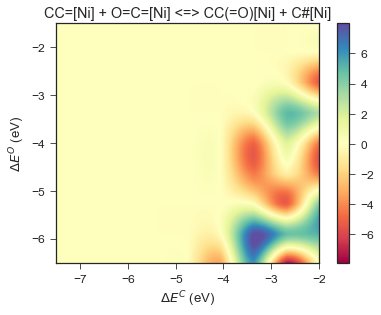

skipping OC=[Ni] + O=C([Ni])OO <=> O=C=[Ni] + OOC(O)[Ni] because it's boring


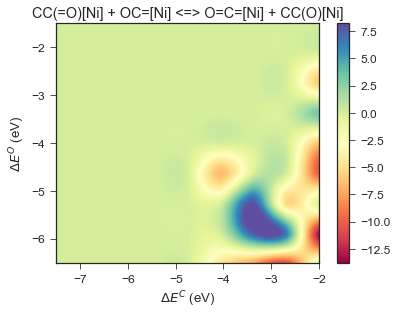

skipping OCC(O)[Ni] + OC(O)=[Ni] <=> OC(O)[Ni] + OCC(O)=[Ni] because it's boring
skipping OCOC(O)[Ni] + O=C(O)C(O)=[Ni] <=> O=C(O)C(O)[Ni] + OCOC(O)=[Ni] because it's boring
skipping CC(O)[Ni] + O=C(O)C(O)=[Ni] <=> O=C(O)C(O)[Ni] + CC(O)=[Ni] because it's boring
skipping OCC(O)[Ni] + O=C(O)C(O)=[Ni] <=> O=C(O)C(O)[Ni] + OCC(O)=[Ni] because it's boring
skipping O=CC(O)=[Ni] + [Ni] <=> OC#[Ni] + O=C[Ni] because it's boring
skipping OC=[Ni] + O=CC(O)=[Ni] <=> OC#[Ni] + O=CC(O)[Ni] because it's boring
skipping C#[Ni] + O=CC(O)=[Ni] <=> C~[Ni] + O=CC(O)[Ni] because it's boring


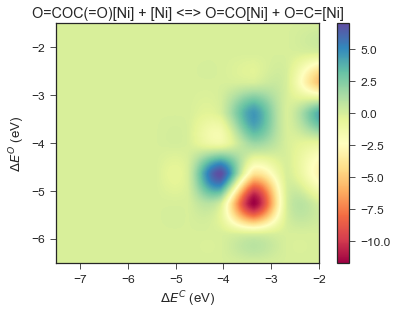

skipping OC#[Ni] + O=CC(O)[Ni] <=> OC=[Ni] + O=CC(O)=[Ni] because it's boring
skipping O=C([Ni])OCO + [Ni] <=> O=C=[Ni] + OCO[Ni] because it's boring
skipping O=C=[Ni] + OCC[Ni] <=> C=[Ni] + O=C([Ni])CO because it's boring
skipping O=CC(O)[Ni] + [Ni] <=> [Ni] + O=CC(O)=[Ni] because it's boring
skipping OC=[Ni] + O=C([Ni])CO <=> O=C=[Ni] + OCC(O)[Ni] because it's boring
skipping O=CC(O)[Ni] + O=C(O)C(O)=[Ni] <=> O=C(O)C(O)[Ni] + O=CC(O)=[Ni] because it's boring


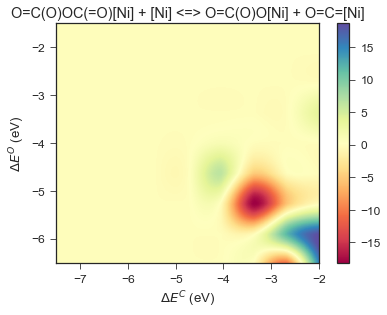

skipping O=CC(O)[Ni] + OC(O)=[Ni] <=> OC(O)[Ni] + O=CC(O)=[Ni] because it's boring
skipping OC(O)[Ni] + O=C(O)C(O)=[Ni] <=> O=C(O)C(O)[Ni] + OC(O)=[Ni] because it's boring
skipping O=C=[Ni] + OCC(O)=[Ni] <=> OC#[Ni] + O=C([Ni])CO because it's boring
skipping OC[Ni] + O=CC(O)=[Ni] <=> OC=[Ni] + O=CC(O)[Ni] because it's boring
skipping C=[Ni] + O=CC(O)=[Ni] <=> C#[Ni] + O=CC(O)[Ni] because it's boring
skipping O=CC(O)[Ni] + OCC(O)=[Ni] <=> OCC(O)[Ni] + O=CC(O)=[Ni] because it's boring
skipping O=CC(O)[Ni] + CC(O)=[Ni] <=> CC(O)[Ni] + O=CC(O)=[Ni] because it's boring
skipping O=[Ni] + O=CC(O)=[Ni] <=> O=CO[Ni] + OC#[Ni] because it's boring
skipping O=CC(O)[Ni] + [Ni] <=> OC=[Ni] + O=C[Ni] because it's boring
skipping O=C[Ni] + O=CC(O)=[Ni] <=> O=C=[Ni] + O=CC(O)[Ni] because it's boring
skipping O[Ni] + O=CC(O)=[Ni] <=> O=[Ni] + O=CC(O)[Ni] because it's boring
skipping C[Ni] + O=CC(O)=[Ni] <=> C=[Ni] + O=CC(O)[Ni] because it's boring
skipping OC=[Ni] + O=CO[Ni] <=> O=[Ni] + O=CC(O)[Ni] bec

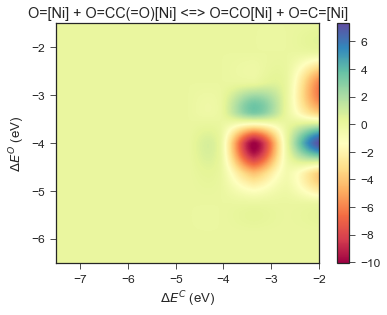

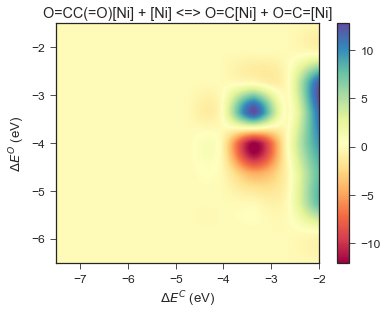

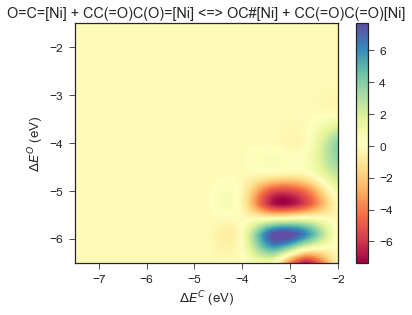

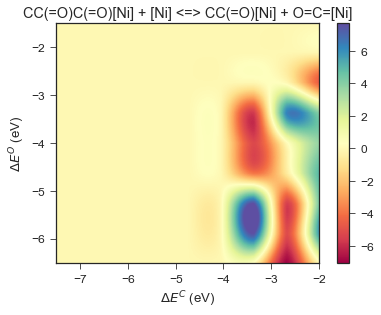

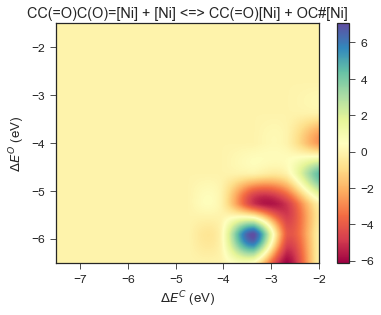

skipping O=C([Ni])COCO + [Ni] <=> O=C=[Ni] + OCOC[Ni] because it's boring
skipping O=C([Ni])C(=O)CO + [Ni] <=> O=C=[Ni] + O=C([Ni])CO because it's boring
skipping O=C=[Ni] + OCOC(O)=[Ni] <=> OC#[Ni] + O=C([Ni])OCO because it's boring
skipping C=[Ni] + O=C([Ni])OCO <=> O=C=[Ni] + OCOC[Ni] because it's boring
skipping O=C(O)C(O)C(=O)[Ni] + [Ni] <=> O=C=[Ni] + O=C(O)C(O)[Ni] because it's boring
skipping O=C([Ni])C(=O)OCO + [Ni] <=> O=C=[Ni] + O=C([Ni])OCO because it's boring
skipping O=C([Ni])C(O)OCO + [Ni] <=> O=C=[Ni] + OCOC(O)[Ni] because it's boring
skipping OCOC[Ni] + O=C(O)C(O)=[Ni] <=> OCOC=[Ni] + O=C(O)C(O)[Ni] because it's boring
skipping O=C=[Ni] + OCOC=[Ni] <=> C#[Ni] + O=C([Ni])OCO because it's boring
skipping O=C(CO)C(O)=[Ni] + [Ni] <=> OC#[Ni] + O=C([Ni])CO because it's boring
skipping OC=[Ni] + O=C([Ni])OCO <=> O=C=[Ni] + OCOC(O)[Ni] because it's boring
skipping O=C=[Ni] + O=C(CO)C(O)=[Ni] <=> OC#[Ni] + O=C([Ni])C(=O)CO because it's boring


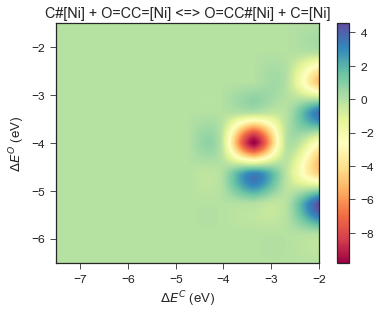

skipping CC=[Ni] + O=CC=[Ni] <=> CC[Ni] + O=CC#[Ni] because it's boring


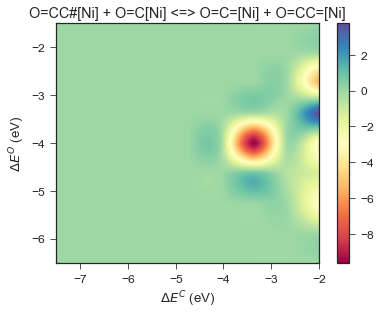

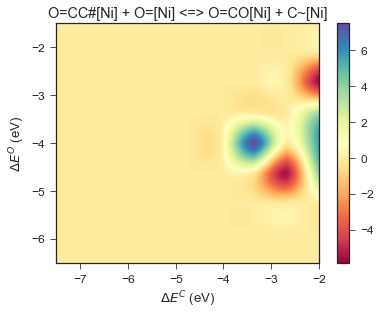

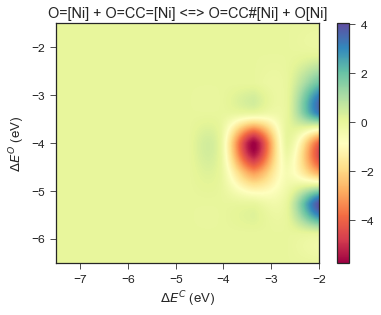

skipping O=C(O)OC(=O)C(=O)[Ni] + [Ni] <=> O=C=[Ni] + O=C(O)OC(=O)[Ni] because it's boring


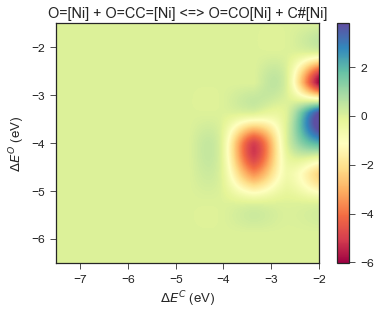

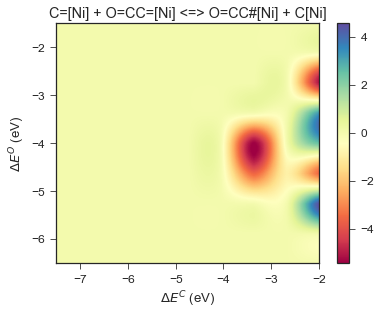

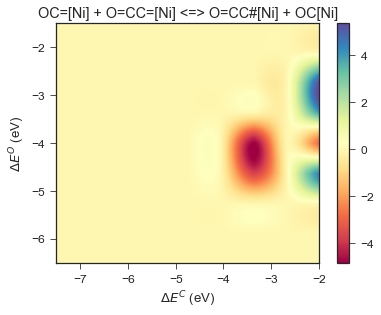

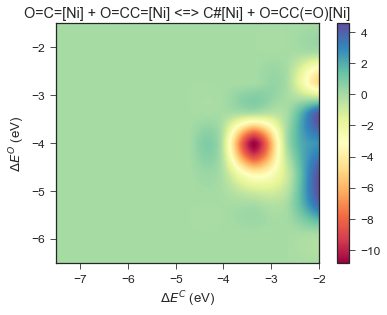

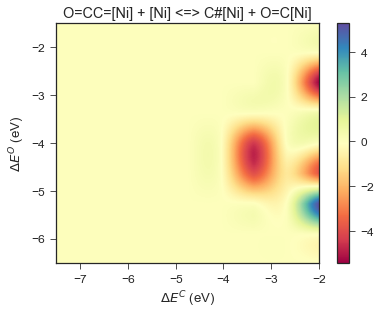

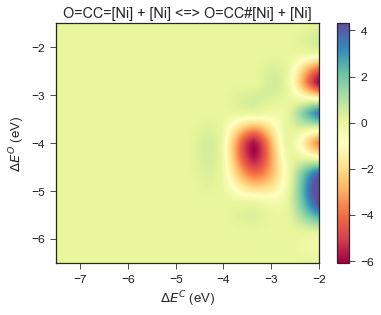

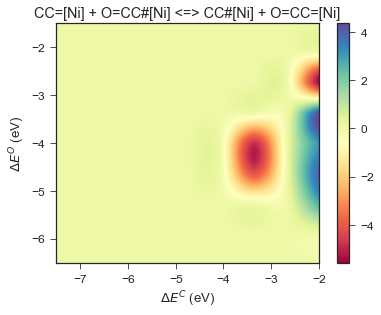

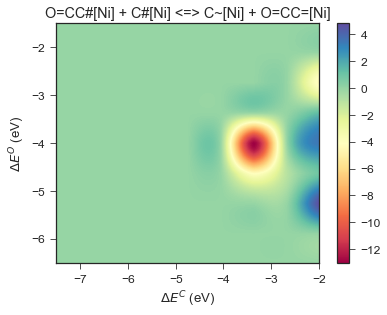

skipping O=CC(=O)C(=O)[Ni] + [Ni] <=> O=C=[Ni] + O=CC(=O)[Ni] because it's boring


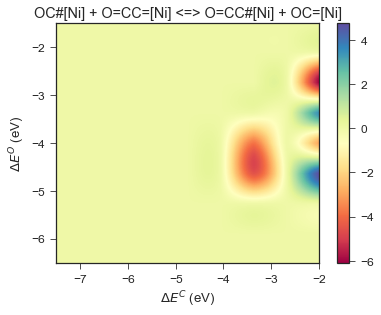

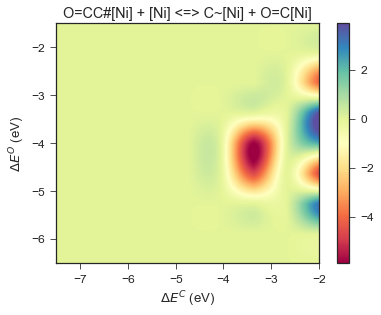

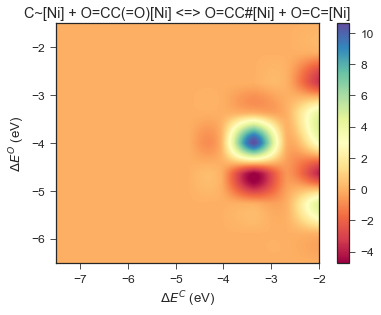

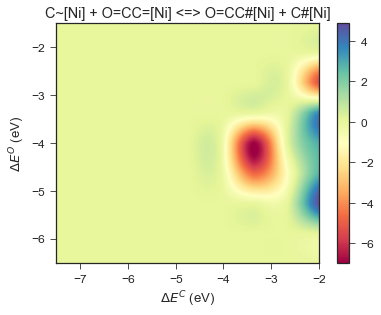

skipping CC=[Ni] + O[Ni] <=> CC[Ni] + O=[Ni] because it's boring


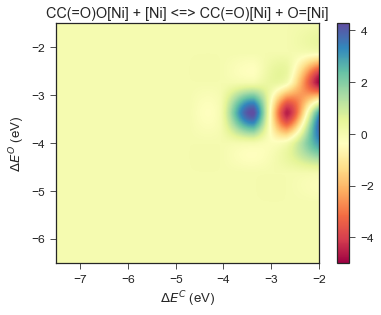

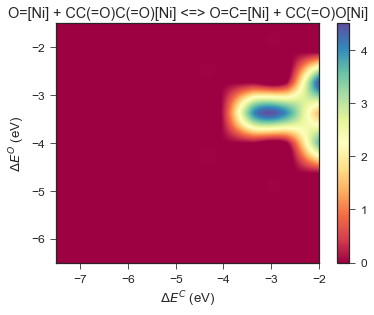

skipping O=CO[Ni] + C~[Ni] <=> O=CC#[Ni] + O=[Ni] because it's boring
skipping O=C=[Ni] + O=C(O)OC(O)=[Ni] <=> OC#[Ni] + O=C(O)OC(=O)[Ni] because it's boring
skipping O=C(O)OC(O)=[Ni] + [Ni] <=> O=C(O)O[Ni] + OC#[Ni] because it's boring
skipping CC=[Ni] + O=C(O)C(O)=[Ni] <=> CC#[Ni] + O=C(O)C(O)[Ni] because it's boring


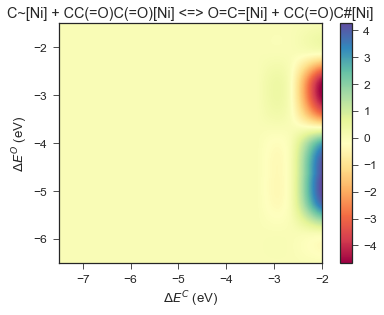

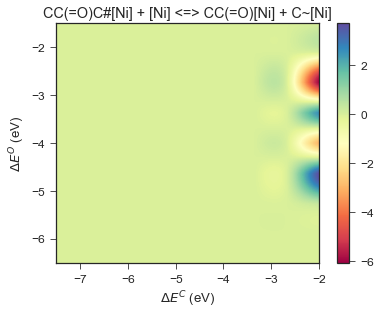

skipping O=C(O)C#[Ni] + [Ni] <=> C~[Ni] + O=C(O)[Ni] because it's boring
skipping OC=[Ni] + CC(=O)C#[Ni] <=> C#[Ni] + CC(=O)C(O)=[Ni] because it's boring
skipping CC=[Ni] + CC(=O)C(O)=[Ni] <=> CC(=O)C#[Ni] + CC(O)[Ni] because it's boring
skipping CC(=O)C(O)=[Ni] + [Ni] <=> O[Ni] + CC(=O)C#[Ni] because it's boring
skipping C=[Ni] + CC(=O)C(O)=[Ni] <=> OC[Ni] + CC(=O)C#[Ni] because it's boring
skipping O=C=[Ni] + O=COC=[Ni] <=> C#[Ni] + O=COC(=O)[Ni] because it's boring
skipping C~[Ni] + CC(=O)C(O)=[Ni] <=> OC#[Ni] + CC(=O)C#[Ni] because it's boring
skipping C~[Ni] + O=C(O)C(=O)[Ni] <=> O=C=[Ni] + O=C(O)C#[Ni] because it's boring
skipping O=C(O)[Ni] + CC(=O)C#[Ni] <=> O=C=[Ni] + CC(=O)C(O)=[Ni] because it's boring
skipping O=C(O)C(=O)[Ni] + [Ni] <=> O=C(O)[Ni] + O=C=[Ni] because it's boring
skipping OC=[Ni] + CC(=O)C(O)=[Ni] <=> CC(=O)C#[Ni] + OC(O)[Ni] because it's boring
skipping O=[Ni] + CC(=O)C(O)=[Ni] <=> OO[Ni] + CC(=O)C#[Ni] because it's boring
skipping O=[Ni] + CC(=O)C(O)=[Ni] <=

In [8]:
for rxn in reactions:
    sensitivities = rxn[1]
    
    sensitivities = np.array(sensitivities)
    if sum(abs(sensitivities)>1e-9) < 5:
        print "skipping {} because it's boring".format(rxn[0])
        continue
    log_sensitivities = np.log(abs(sensitivities))
    a = np.log(abs(sensitivities))+20
    log_sensitivities = a * (a>0) * (1-2*(sensitivities<0) )
    sensitivities_grid = np.reshape(log_sensitivities, (grid_size,grid_size))
    
    #ax = sns.heatmap(sensitivities_grid, cmap="Spectral")

    plt.imshow(sensitivities_grid.T, interpolation='spline16', origin='lower', 
               extent=extent2, aspect='equal', cmap="Spectral")
    plt.xlim(carbon_range)
    plt.ylim(oxygen_range)
    plt.xlabel('$\Delta E^C$ (eV)')
    plt.ylabel('$\Delta E^O$ (eV)')
    plt.title(rxn[0])
    plt.colorbar()
    plt.show()
    
    

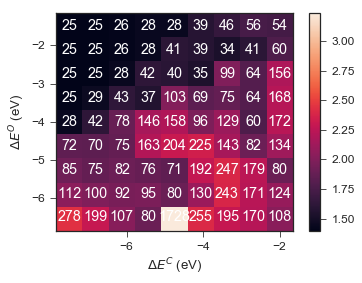

In [18]:
# Plot the number of surface reactions
num_surf_reactions

reaction_counts_grid = np.log10(np.reshape(num_surf_reactions, (grid_size,grid_size)))
plt.imshow(reaction_counts_grid.T, interpolation='none', origin='lower', extent=extent2, aspect='equal')
plt.xlim(carbon_range2)
plt.ylim(oxygen_range2)
plt.xlabel('$\Delta E^C$ (eV)')
plt.ylabel('$\Delta E^O$ (eV)')
for e,n in zip(experiments,num_surf_reactions):
    plt.text(e[0],e[1],n,color='w',ha='center', va='center')
plt.colorbar()

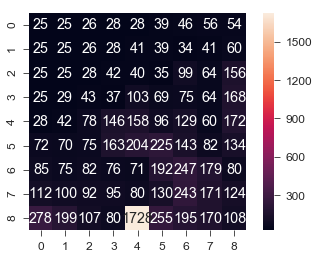

In [19]:
# A linear one, just to check it looks the same
reaction_counts_grid = np.reshape(num_surf_reactions, (grid_size,grid_size))
ax = sns.heatmap(reaction_counts_grid.T[::-1,:], annot=True, fmt='d', square=True)